In [1]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import PIL.Image
from matplotlib import pylab as P
import matplotlib as plt1
import pickle
import matplotlib.pyplot as plt
import math
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'
# import saliency2.core as saliency
import time
from skimage import segmentation
from skimage.morphology import dilation
from skimage.morphology import disk
from skimage.transform import resize
from itertools import combinations
import copy
import scipy

%matplotlib inline


In [2]:
mask_generator_2=None

In [3]:
filepath_array=[]

In [4]:
#add the image path here
image_path_with_name= '/Users/nuthan/ME/Feature-visualization-and-attribution/images/zoo2.jpeg'
filepath_array.append(image_path_with_name)

In [6]:
%run loading_models_for_code.ipynb
if mask_generator_2 is None:
    %run segments_notebook_for_code.ipynb
%run image_loader_for_code.ipynb
%run misc_functions.ipynb
%run preproceess_and_predict_for_code.ipynb
%run pixel_wise_attribution_for_code.ipynb
%run segmentwise_attribution_for_code.ipynb
%run DistinctEntitiesAlgorithm1.ipynb
%run CalculateRedactionWisePredictions.ipynb
%run DistinctEntitiesAlgorithm2.ipynb
%run SingleEntityAlgorithm.ipynb

In [7]:
topk=5

available_models=['VGG16','InceptionV3','ResNet50']

# model_to_use='InceptionV3'
model_to_use='VGG16'
# model_to_use='ResNet50'

model_using,model_wth_pre_soft_max_using=load_model(model_to_use)
# model_in_use.summary()


*******************************************************************
zoo2.jpeg


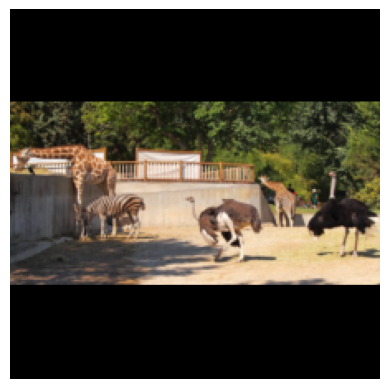

Prediction class: 355
1:n02437616 llama (0.0932898447)
2:n02437312 Arabian_camel (0.0843768939)
3:n02403003 ox (0.0795283020)
4:n02115913 dhole (0.0479160696)
5:n02408429 water_buffalo (0.0449796431)
6:n01518878 ostrich (0.0445909798)
7:n02486410 baboon (0.0202514790)
8:n02100877 Irish_setter (0.0200585742)
9:n01877812 wallaby (0.0189613886)
10:n02397096 warthog (0.0181531161)
11:n02116738 African_hunting_dog (0.0175319687)
12:n02487347 macaque (0.0158432405)
13:n02488291 langur (0.0155016314)
14:n02092002 Scottish_deerhound (0.0149260759)
15:n02105412 kelpie (0.0140338978)
16:n02423022 gazelle (0.0120424516)
17:n02422699 impala (0.0112110842)
18:n06359193 web_site (0.0111358864)
19:n02395406 hog (0.0110447388)
20:n02410509 bison (0.0105432356)
started segmentation
time taken by segmentation : 117.4251139163971 sec
completed segmentation
calculating pixel wise attributions
for 355
started IG
completed IG calculation
picking up max gradients of 3 channels
for 354
started IG
completed IG

In [9]:


cnt=0
for file_path in filepath_array:
    start_time = time.time()
    pth='temp/'
    (fig_name,image)=image_load(model_to_use,file_path) # load according to model
    pth=pth+model_to_use+'_'+fig_name
    im = PreprocessImage(model_to_use,image) # preprocess according to model
    # ShowImage(image,title=fig_name)
    plt.imshow(image)
    plt.axis('off')
    # plt.savefig('zoo/type2_fig.svg',format='svg')
    plt.show()
    
    #predict image with model and load respective data
    (predictions,decoded_predictions,top10list,top1000list,id_to_name)=predict_img(model_using,im,print_data=True)
    
    #generate segments with segmentation algorithm
    segs=generate_segments(image,pth,redo=False)

    #Calculate pixel wise attribution with Integrated Gradients
    pixelwise_attributions=check_pixelwise_attributions_and_load(model_using,topk,top10list,pth,redo=False)

    #making the segments disjoint
    new_segs=make_segs_disjoint(segs)
    # new_segs_2=rank_disjoint_segs(new_segs,topk,top10list)

    #Calculate segment level attribution using XRAI
    (segmentwise_attributions,list_of_masks,list_of_segment_avg)=check_segmentwise_attributions_and_load(pixelwise_attributions,topk,top10list,pth,new_segs,redo=True)


    #disjoint
    # prediction_dictionary = compare_topk(model_using,segmentwise_attributions,image,im,topk,top10list,new_segs,predictions,pth,list_of_masks,list_of_segment_avg,redo=True,presoftmax=False)
    # print(sum(predictions[0]))

    #disjoint_presoftmax
    # (predictions_pre,decoded_predictions_pre,top10list_pre,top1000list_pre,id_to_name_pre)=predict_img(model_wth_pre_soft_max_using,im,print_data=False)
    # prediction_dictionary = compare_topk(model_wth_pre_soft_max_using,segmentwise_attributions,image,im,topk,top10list,new_segs,predictions_pre,pth,list_of_masks,list_of_segment_avg,redo=False,presoftmax=True)

    #disjoint
    #Distinct entities Algorithm 1
    # abcd,cnt=check_for_type_1_and_2_using_rankings_new(segs,pixelwise_attributions,segmentwise_attributions,prediction_dictionary,model_using,im,image,topk,top10list,60,new_segs,list_of_masks,checkonly=None)

    #normal algorithm
    # all_redaction_values = load_predictions_by_redactions(model_using,segmentwise_attributions,image,im,topk,top10list,pth,list_of_masks,new_segs,predictions,redo=False,dont_save=False)
    
    #type2
    #single entity algorithm
    # xx,yy,zz=check_for_type_2_using_rankings_exp2(segs,pixelwise_attributions,segmentwise_attributions,all_redaction_values[0],all_redaction_values[1],all_redaction_values[2],model_using,model_wth_pre_soft_max_using,im,image,topk,top10list,80,checkonly=None,check_both_pred=True)
    
    #type1
    # Distinct entities Algorithm 2
    # xx,yy,zz=check_for_type_1_using_rankings_exp2(segs,pixelwise_attributions,segmentwise_attributions,all_redaction_values[0],all_redaction_values[1],all_redaction_values[2],model_using,model_wth_pre_soft_max_using,im,image,topk,top10list,60,checkonly=None,check_both_pred=True)



    cnt=cnt+1
    print('completed for '+str(cnt))
    end_time = time.time()
    # print('completed for fig_name')
    print('time taken : '+str(end_time-start_time)+' sec')
    print('------------------------------------------------------------------------------------------------------------------------')
    

    

    








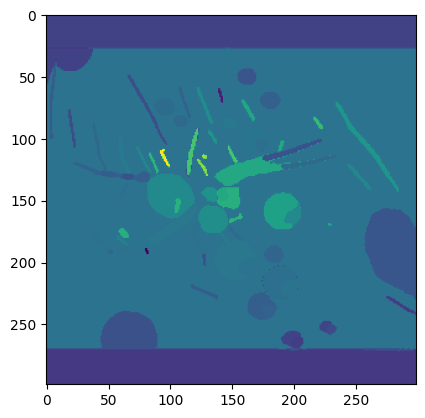

In [166]:
plt.imshow(segmentwise_attributions[74])

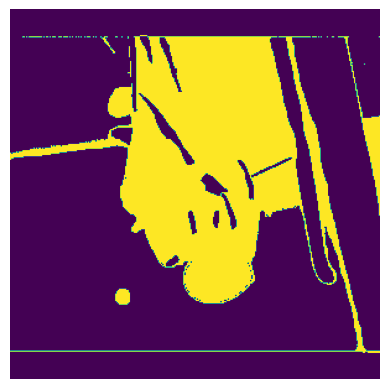

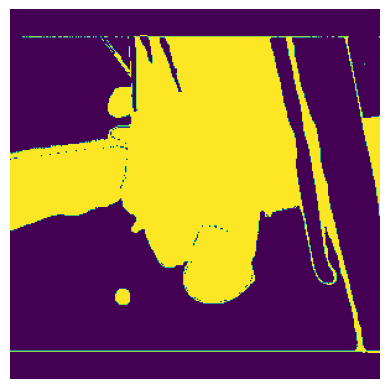

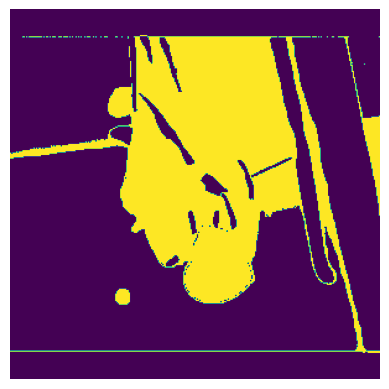

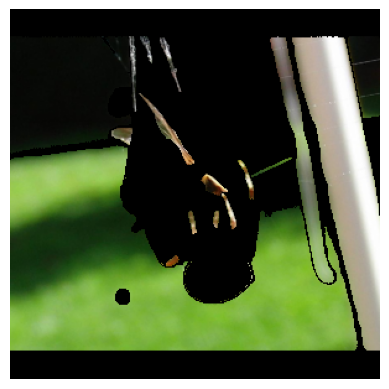

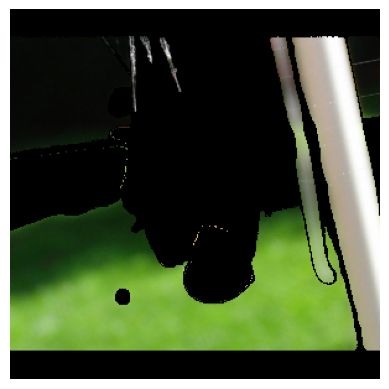

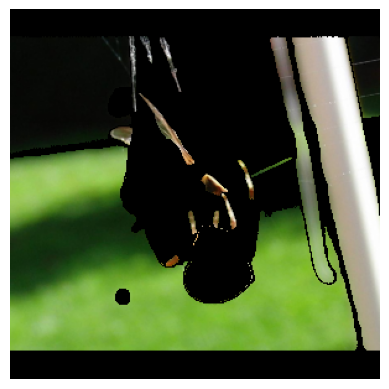

In [410]:
# type2 figures
plt.imshow(get_mask(xx,new_segs))
plt.axis('off')
plt.savefig('spider5/type2mask1.svg',format='svg')
plt.show()
plt.imshow(get_mask(yy,new_segs))
plt.axis('off')
plt.savefig('spider5/type2mask2.svg',format='svg')
plt.show()
plt.imshow(get_mask(zz,new_segs))
plt.axis('off')
plt.savefig('spider5/type2mask_intersection.svg',format='svg')
plt.show()

xx1=get_mask(xx,new_segs)
new_im1=mask_on_image(image , xx1, masking_type)
plt.imshow(new_im1)
plt.axis('off')
plt.savefig('spider5/type2redaction1.svg',format='svg')
plt.show()
yy1=get_mask(yy,new_segs)
new_im1=mask_on_image(image , yy1, masking_type)
plt.imshow(new_im1)
plt.axis('off')
plt.savefig('spider5/type2redaction2.svg',format='svg')
plt.show()
zz1=get_mask(zz,new_segs)
new_im1=mask_on_image(image , zz1, masking_type)
plt.imshow(new_im1)
plt.axis('off')
plt.savefig('spider5/type2redaction_intersection.svg',format='svg')
plt.show()


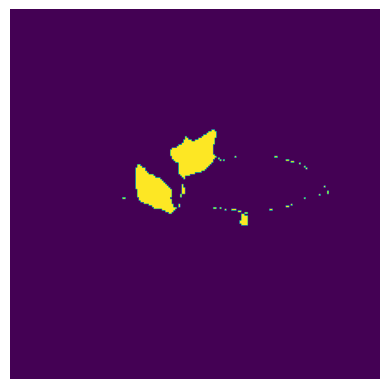

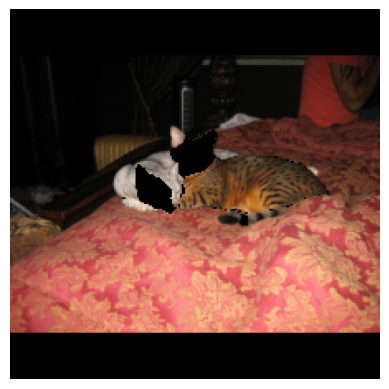

0.02020355
0.03522641


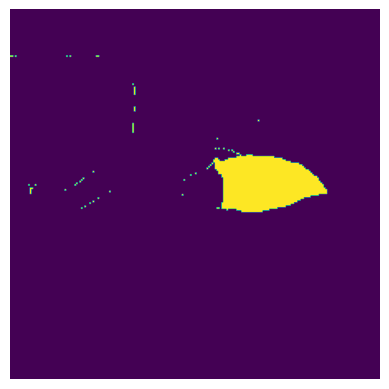

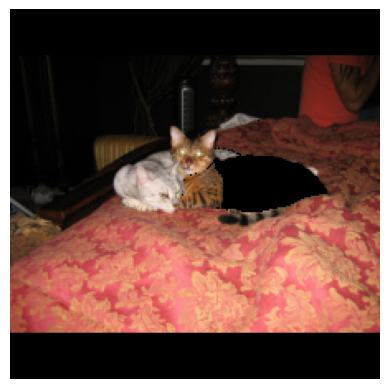

0.20956345
0.006090858


In [364]:
#type 1  disjoint printing and saving images


prediction1=top10list[1]
prediction2=top10list[3]
mask_intersection=abcd[f'{prediction1} vs {prediction2}'][0]
masking_type='normal/'
new_im=mask_on_image(im , mask_intersection, masking_type)
new_im1=mask_on_image(image , mask_intersection, masking_type)
plt.imshow(mask_intersection)
plt.axis('off')
plt.savefig('cats2/type1_mask1.svg',format='svg')
plt.show()

plt.imshow(new_im1)
plt.axis('off')
plt.savefig('cats2/type1_mask1_redacted.svg',format='svg')
plt.show()

(predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
print(predictions_temp[0][prediction1].numpy())
print(predictions_temp[0][prediction2].numpy())

mask_intersection=abcd[f'{prediction1} vs {prediction2}'][1]
masking_type='normal/'
new_im=mask_on_image(im , mask_intersection, masking_type)
new_im1=mask_on_image(image , mask_intersection, masking_type)
plt.imshow(mask_intersection)
plt.axis('off')
plt.savefig('cats2/type1_mask2.svg',format='svg')
plt.show()

plt.imshow(new_im1)
plt.axis('off')
plt.savefig('cats2/type1_mask2_redacted.svg',format='svg')
plt.show()

(predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
print(predictions_temp[0][prediction1].numpy())
print(predictions_temp[0][prediction2].numpy())
# label1_dip_perc_a=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy()))/np.sum(new_segs[p]))*100
# label2_dip_perc_a=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy()))/np.sum(new_segs[p]))*100

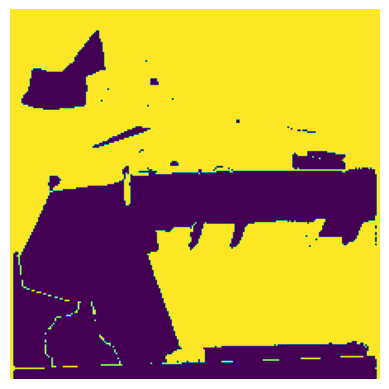

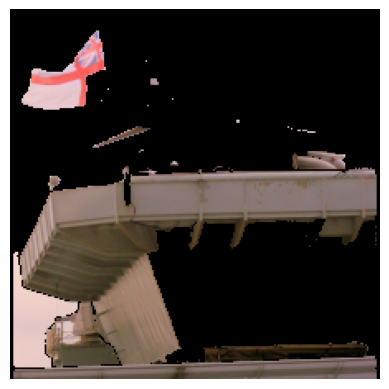

Prediction class: 404
1:n02690373 airliner (0.3151586056)
2:n04552348 warplane (0.2845706046)
3:n02749479 assault_rifle (0.0713622719)
4:n03967562 plow (0.0352762528)
5:n03721384 marimba (0.0284603015)
6:n04592741 wing (0.0273089688)
7:n03478589 half_track (0.0243272241)
8:n02704792 amphibian (0.0186225306)
9:n02687172 aircraft_carrier (0.0158613529)
10:n03496892 harvester (0.0137541117)
11:n03126707 crane (0.0126613872)
12:n02971356 carton (0.0101028448)
13:n04008634 projectile (0.0088760341)
14:n03773504 missile (0.0070124399)
15:n04467665 trailer_truck (0.0061008190)
16:n03888257 parachute (0.0055603818)
17:n03874293 paddlewheel (0.0055574337)
18:n04336792 stretcher (0.0052395323)
19:n02692877 airship (0.0046249474)
20:n04090263 rifle (0.0045832833)
0.015861353
0.008876034
0.035678502
0.035400663


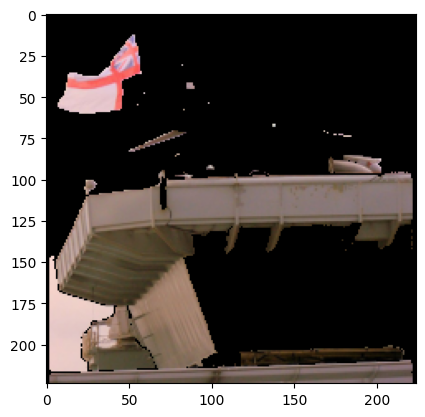

In [29]:
#get type1 disjoint combinaqtion mask

prediction1=top10list[0]
prediction2=top10list[1]
type1_comb_list=abcd[f'{prediction1} vs {prediction2}'][2]+abcd[f'{prediction1} vs {prediction2}'][3]
# type1_comb_list=abcd[f'{prediction1} vs {prediction2}'][2]

mask_intersection= get_mask(type1_comb_list,new_segs)

# plt.imshow(get_mask(type1_comb_list,new_segs))
masking_type='normal/'
new_im=mask_on_image(im , mask_intersection, masking_type)
new_im1=mask_on_image(image , mask_intersection, masking_type)

plt.imshow(mask_intersection)
plt.axis('off')
plt.savefig('verification_mask_union.svg',format='svg')
plt.show()

plt.imshow(new_im1)
plt.axis('off')
plt.savefig('verification_image_union.svg',format='svg')
plt.show()


plt.imshow(new_im1)
(predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=True)
print(predictions_temp[0][prediction1].numpy())
print(predictions_temp[0][prediction2].numpy())

print(predictions_temp[0][prediction1].numpy()/predictions[0][prediction1].numpy())
print(predictions_temp[0][prediction2].numpy()/predictions[0][prediction2].numpy())
# type1_comb_list

In [31]:
#new algorithm for type 1

# 1.pick up one segment one after the other and find the segment that has maximum dip in percentage for Label l1 and it has to be more than dip for l2
# 2.push it into label's set
# 3.pick up each segment from its adjacent segments and find the segment that has highest dip in percentage for label when we this segment is part of label's set
# 4.push it into label's set
# 5.repeat from step 3 until there are no segments that has higher dip for l1 than l2
# 6.repeat from step 1  with new seg of segments and new image that already redacted the initial segments to find the next segment to start with until we donot find any other segments 

In [445]:
list_of_all_segs=sorted(list_of_masks[top10list[0]])

def calc_adjacency_list(main_list_of_segments,new_segs):


    adjacency_list={}
    for i in main_list_of_segments:
        a=get_adjacent_segments(new_segs,i)
        new_a=[j for j in a if j in main_list_of_segments]
        adjacency_list[i]=new_a
    return adjacency_list

In [446]:
# list_of_all_segs

In [447]:

# adjacency_list=calc_adjacency_list(list_of_all_segs,new_segs)

checking from first
new final set of segments  []
new set of segments checking  [0, 2, 3, 4, 5, 6, 9, 12, 13, 14, 16, 19, 20, 21, 25, 26, 30, 31, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 51, 52, 53, 54, 58, 59, 65, 66, 67, 69, 71, 72, 73, 74, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 89, 91, 92, 94, 95, 96, 97, 99, 100, 104, 105, 106, 107, 110, 111, 117, 118, 119, 120]
calculating adjacency list
new image


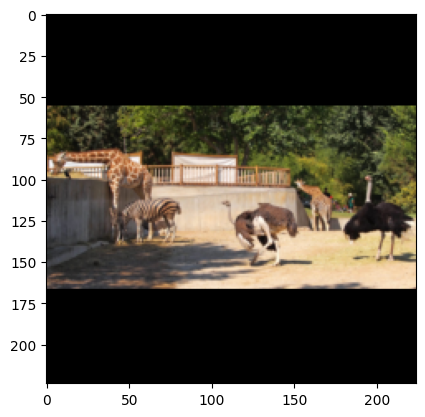

0 13.538753986358643 8.137214183807373
2 -15.305137634277344 22.914212942123413
3 -0.8687973022460938 2.5412440299987793
4 -3.8651347160339355 -12.269866466522217
5 -36.41468286514282 48.71504306793213
6 3.082972764968872 -11.944377422332764
9 68.50691735744476 -77.44381427764893
12 86.21902018785477 49.89876747131348
13 -9.124243259429932 6.6234290599823
14 -2.2408366203308105 -2.9411673545837402
16 1.9562900066375732 1.8720030784606934
19 72.7279007434845 69.89394426345825
20 2.0941615104675293 -0.8643507957458496
21 -4.592001438140869 -1.237344741821289
25 -23.650503158569336 16.13052487373352
26 3.098142147064209 -8.306825160980225
30 0.6587088108062744 0.607532262802124
31 13.397616147994995 -15.23892879486084
36 37.118542194366455 82.92659670114517
38 0.9266495704650879 -1.2514233589172363
39 3.7242889404296875 -12.573599815368652
40 -0.041925907135009766 4.471147060394287
41 -11.19321584701538 -4.301738739013672
43 -9.760630130767822 19.367843866348267
44 2.280890941619873 -7.40

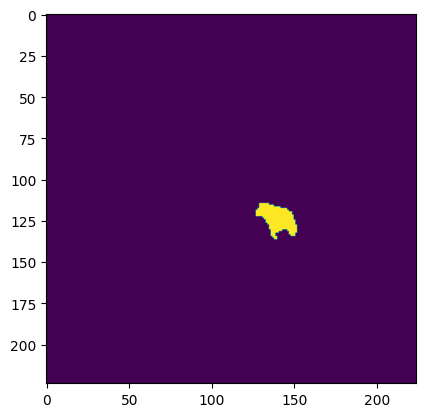

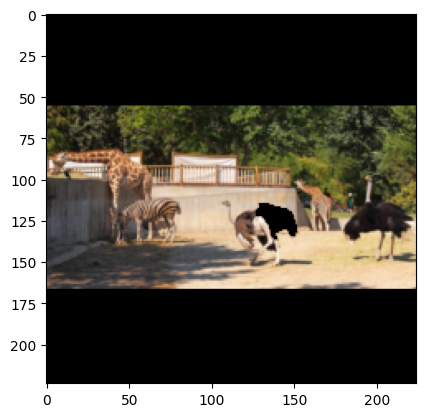

checking the adjacency list of  [51]
checking for  [0, 9, 53, 58, 71]
0 19.913393259048462 -15.117645263671875
highest until here with 0
9 32.67365097999573 -11.265289783477783
highest until here with 9
53 21.740686893463135 35.83651781082153
58 19.09630298614502 -2.1828532218933105
71 -0.3826022148132324 0.28687119483947754
maximum dip at  9


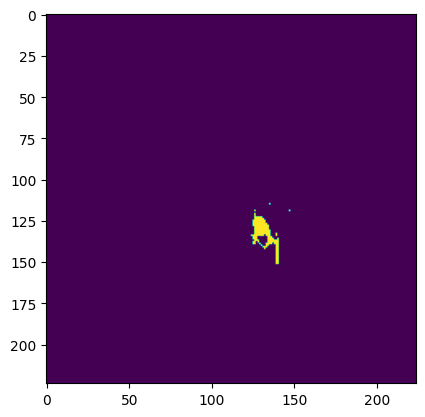

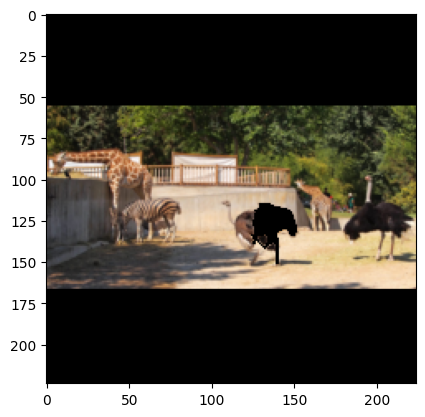

checking the adjacency list of  [51, 9]
checking for  [0, 53, 58, 71, 36, 74, 76, 79, 99]
0 21.608948707580566 -29.690778255462646
highest until here with 0
53 6.760096549987793 44.65293288230896
58 -1.9950032234191895 10.283845663070679
71 -0.48503875732421875 -0.545048713684082
36 -19.4669246673584 55.72558343410492
74 0.9750008583068848 3.0939459800720215
76 1.1447012424468994 4.699450731277466
79 5.439162254333496 9.70674753189087
99 -9.152209758758545 12.840521335601807
maximum dip at  0


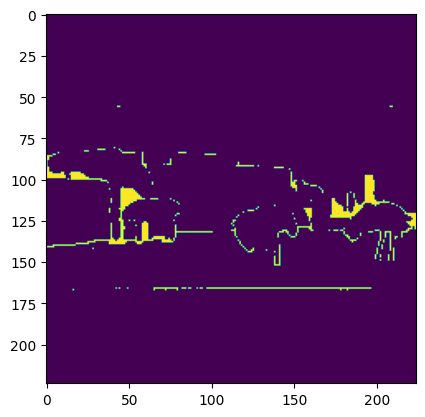

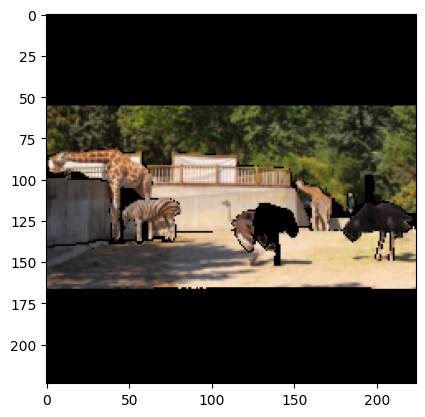

checking the adjacency list of  [51, 9, 0]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 2, 3, 4, 5, 6, 12, 13, 14, 16, 19, 20, 21, 25, 26, 30, 31, 38, 39, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 80, 81, 84, 85, 86, 87, 89, 91, 92, 94, 95, 97, 104, 105, 106, 107, 110, 111, 117]
53 -1.8819689750671387 34.15619730949402
58 1.1144161224365234 0.44400691986083984
highest until here with 58
71 -2.497732639312744 -0.2429485321044922
36 -4.162967205047607 29.572218656539917
74 1.5064001083374023 1.0547339916229248
76 -1.7655134201049805 -6.748092174530029
highest until here with 76
79 -2.1094918251037598 2.6332318782806396
99 -11.89274787902832 9.153604507446289
2 -5.4534077644348145 -65.30522108078003
highest until here with 2
3 10.629326105117798 -3.5030603408813477
4 -6.656503677368164 -8.564567565917969
5 -24.352753162384033 35.73414087295532
6 3.9337635040283203 3.8011014461517334
12 56.99427127838135 9.151279926300049
13 -7.5621843338012695 6.062948703765869
14 -1.7

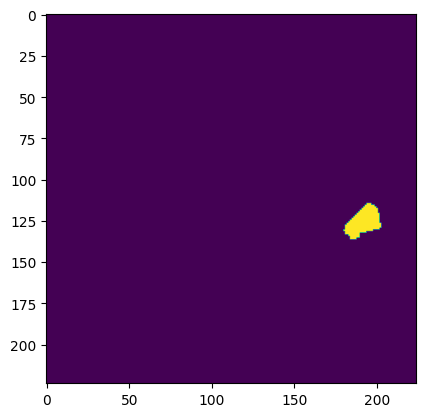

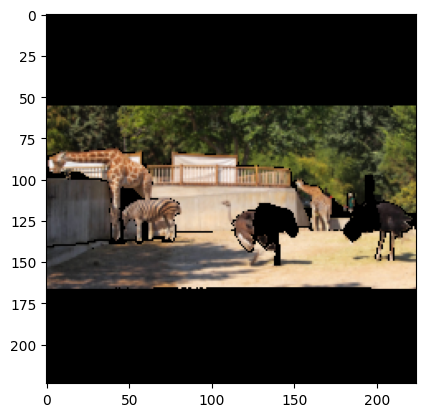

checking the adjacency list of  [51, 9, 0, 95]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 2, 3, 4, 5, 6, 12, 13, 14, 16, 19, 20, 21, 25, 26, 30, 31, 38, 39, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 80, 81, 84, 85, 86, 87, 89, 91, 92, 94, 97, 104, 105, 106, 107, 110, 111, 117]
53 -7.47600793838501 30.255448818206787
58 7.444906234741211 11.375981569290161
71 -0.8174419403076172 -0.21352767944335938
36 -14.8895263671875 72.08650410175323
74 1.6573905944824219 -0.6444573402404785
highest until here with 74
76 -2.907419204711914 -1.7999768257141113
79 -2.5135159492492676 1.079714298248291
99 -20.42856216430664 8.248043060302734
2 -17.872178554534912 -41.7361855506897
highest until here with 2
3 13.592725992202759 -4.310142993927002
4 -6.158709526062012 -9.071934223175049
5 -14.570963382720947 36.49698495864868
6 -0.7268667221069336 -2.263927459716797
12 62.99943029880524 13.873165845870972
highest until here with 12
13 -14.591240882873535 7.544946670532227
14 1.40113

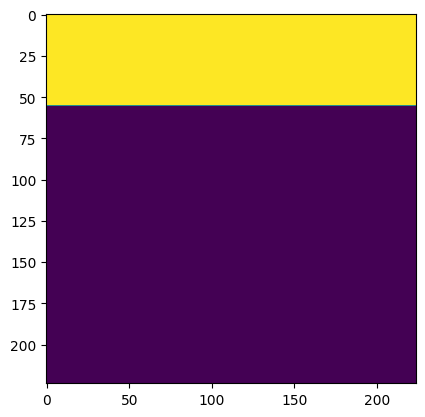

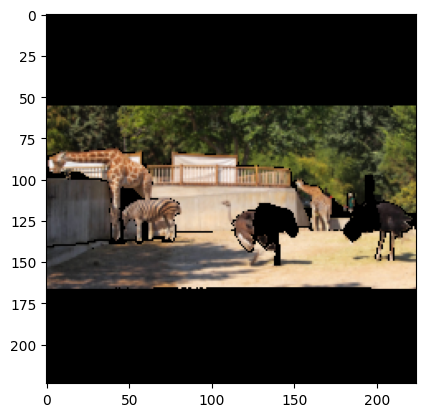

checking the adjacency list of  [51, 9, 0, 95, 89]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 2, 3, 4, 5, 6, 12, 13, 14, 16, 19, 20, 21, 25, 26, 30, 31, 38, 39, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 80, 81, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 106, 107, 110, 111, 117]
53 -6.891334056854248 31.314104795455933
58 13.63103985786438 6.71614408493042
highest until here with 58
71 -0.12646913528442383 -0.790870189666748
36 -34.43523645401001 57.59008228778839
74 2.4859070777893066 0.4909932613372803
76 -0.8646726608276367 -3.0521750450134277
79 -1.0844707489013672 0.10063052177429199
99 -22.17562198638916 6.928050518035889
2 -2.7478933334350586 -53.69749069213867
highest until here with 2
3 12.194907665252686 -2.9245615005493164
4 -9.915924072265625 -10.183489322662354
5 -15.527725219726562 31.448256969451904
6 -0.6241321563720703 -2.8479933738708496
12 60.177600383758545 0.3131270408630371
highest until here with 12
13 -14.637577533721924 3.176206350326538
14 

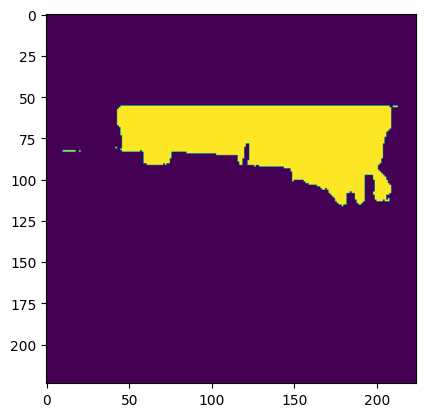

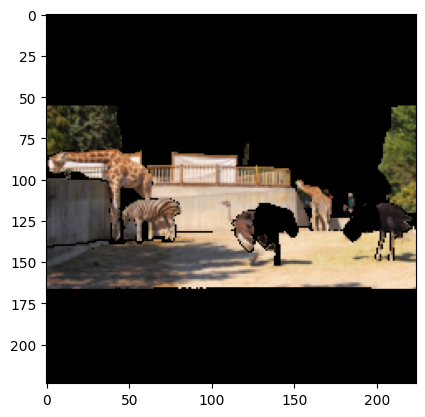

checking the adjacency list of  [51, 9, 0, 95, 89, 12]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 2, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 26, 30, 31, 38, 39, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 80, 81, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 106, 107, 110, 111, 117]
53 -12.326323986053467 27.14160680770874
58 -17.89858341217041 15.0238037109375
71 0.8546233177185059 -1.6426563262939453
highest until here with 71
36 42.53132939338684 87.05117404460907
74 0.05187392234802246 0.15310049057006836
76 -4.013621807098389 9.06561017036438
79 -2.8224945068359375 3.4954607486724854
99 -24.7886061668396 7.005548477172852
2 -26.966309547424316 -18.247175216674805
3 10.467112064361572 -4.998135566711426
highest until here with 3
4 -0.6227254867553711 -5.223119258880615
5 34.597617387771606 75.53734332323074
6 -4.736697673797607 -5.500626564025879
13 -5.213606357574463 -0.11094808578491211
14 -2.7756690979003906 -1.0027170181274414
16 1.0365426540374756 -1.5563488006

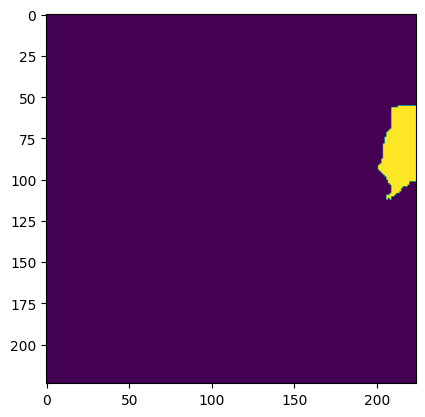

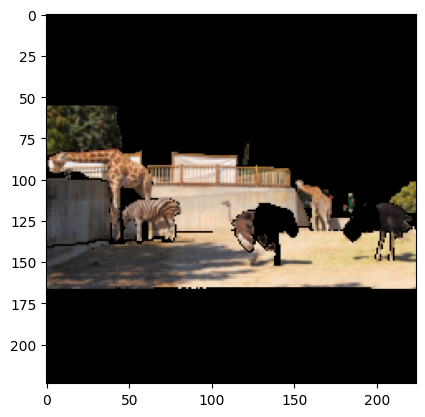

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 2, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 26, 30, 31, 38, 39, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 80, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 106, 107, 110, 111, 117]
53 -21.37855291366577 21.04758620262146
58 -24.893951416015625 17.755818367004395
71 1.2697339057922363 -1.2732386589050293
highest until here with 71
36 15.859943628311157 88.23691308498383
74 -1.4680147171020508 0.31057000160217285
76 -4.024803638458252 8.973151445388794
79 -2.6779890060424805 2.565765380859375
99 -23.891055583953857 3.6543667316436768
2 -14.833426475524902 -12.602472305297852
3 8.731168508529663 -2.7869224548339844
highest until here with 3
4 -0.855100154876709 -3.2298803329467773
5 24.664121866226196 74.32466149330139
6 -6.678640842437744 -4.187357425689697
13 -5.990159511566162 -0.0077724456787109375
14 0.39499998092651367 -1.884150505065918
16 1.023423671722412 -1.1115

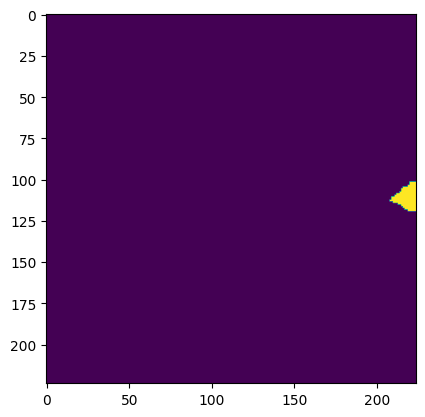

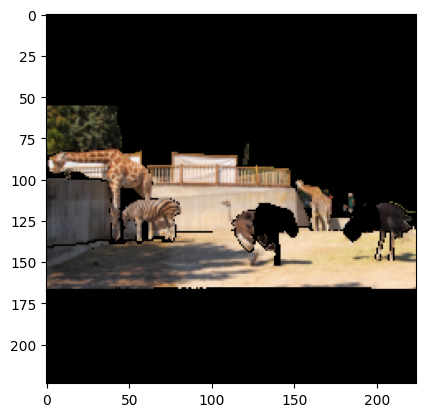

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 2, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 26, 30, 31, 38, 39, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 80, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 107, 110, 111, 117]
53 -26.305878162384033 19.69289779663086
58 -37.44673728942871 17.99291968345642
71 1.312243938446045 -0.805354118347168
highest until here with 71
36 -52.8741717338562 79.30107116699219
74 -2.3401856422424316 0.7974207401275635
76 -8.230268955230713 7.7268898487091064
79 -3.8765668869018555 2.523314952850342
99 -25.76146125793457 2.4406790733337402
2 -17.078125476837158 -11.974859237670898
3 11.398786306381226 -2.521693706512451
highest until here with 3
4 0.40400028228759766 -3.1754374504089355
5 5.746251344680786 68.57844293117523
6 -6.062018871307373 -0.6847381591796875
13 -13.37825059890747 1.3105034828186035
14 0.3272593021392822 -1.5792012214660645
16 1.4374852180480957 -0.81866979598

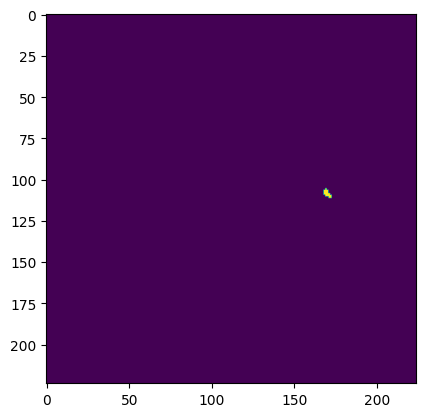

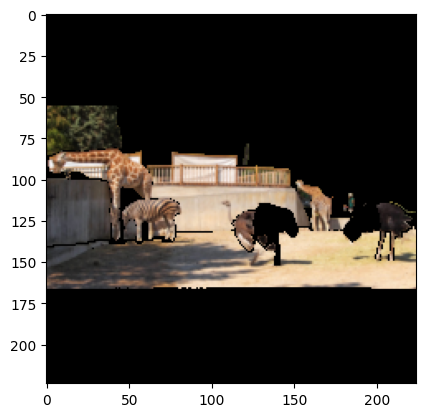

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 2, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 26, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 80, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 107, 110, 111, 117]
53 -24.63299036026001 17.90010929107666
58 -28.48079204559326 15.740931034088135
71 1.380676031112671 -1.0071158409118652
highest until here with 71
36 -70.74209451675415 75.28399229049683
74 -0.8121252059936523 0.45602917671203613
76 -6.046926975250244 5.630338191986084
79 -2.0698189735412598 2.4660468101501465
99 -24.262583255767822 1.772606372833252
2 -19.42143440246582 -12.33668327331543
3 11.618274450302124 -2.2781968116760254
highest until here with 3
4 1.7930984497070312 -2.905905246734619
5 1.2040674686431885 69.75978314876556
6 -2.06143856048584 -1.3240814208984375
13 -11.165499687194824 0.5687117576599121
14 0.539165735244751 -1.754152774810791
16 1.019817590713501 -0.1917243003845

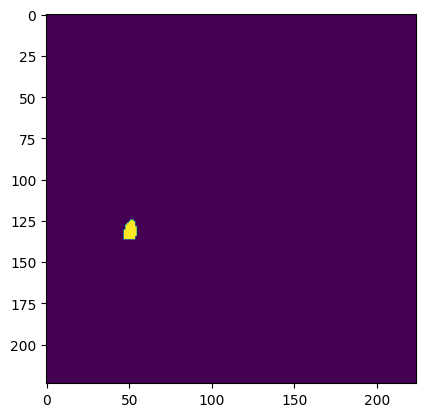

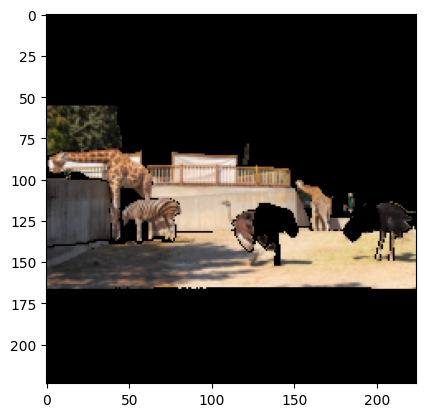

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 2, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 80, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 107, 110, 111, 117]
53 -16.594016551971436 19.88047957420349
58 -11.49066686630249 16.8618381023407
71 1.5740394592285156 -1.2572169303894043
highest until here with 71
36 -32.63615369796753 81.77566528320312
74 1.399397850036621 0.3493368625640869
76 -3.0400991439819336 6.6269636154174805
79 -0.9424090385437012 3.112947940826416
99 -21.1641788482666 1.5279412269592285
2 -7.974088191986084 -27.070677280426025
highest until here with 2
3 9.223240613937378 -0.4392266273498535
4 -12.142574787139893 0.050187110900878906
5 23.087841272354126 80.83377033472061
6 -4.122006893157959 -1.9009947776794434
13 -12.598109245300293 2.6894867420196533
14 -3.4040093421936035 -3.789997100830078
16 1.3006627559661865 0.0630080699

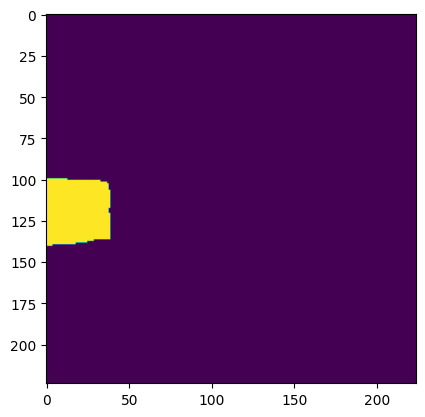

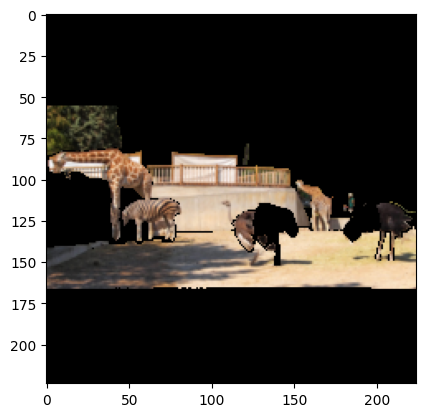

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 80, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 107, 110, 111, 117]
53 -29.76369857788086 9.543019533157349
58 -47.602200508117676 5.971604585647583
71 2.485370635986328 -0.7016539573669434
highest until here with 71
36 -85.26867628097534 75.70456266403198
74 -0.6918430328369141 -0.39201974868774414
76 -9.546566009521484 1.9514083862304688
79 -3.172004222869873 0.9020626544952393
99 -22.280728816986084 0.9684741497039795
3 7.935160398483276 -0.3437995910644531
highest until here with 3
4 -8.717131614685059 3.1788289546966553
5 29.265308380126953 35.73288917541504
6 -2.39410400390625 -0.4298090934753418
13 -19.80435848236084 1.0517597198486328
14 -2.882695198059082 -1.9630670547485352
16 0.8132398128509521 0.1237332820892334
19 51.96690261363983 66.6591346263

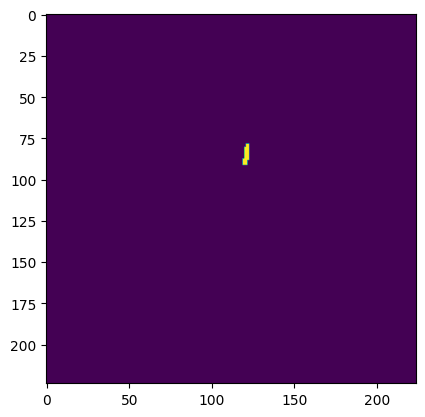

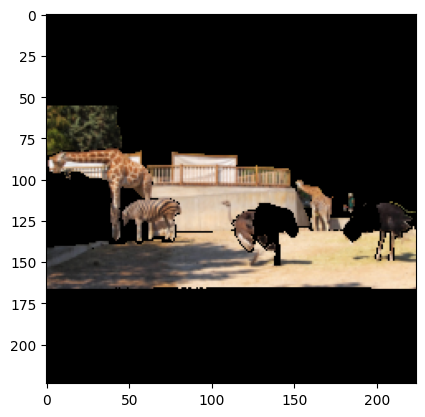

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 73, 77, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 107, 110, 111, 117]
53 -18.454408645629883 5.350184440612793
58 -48.97953271865845 9.504729509353638
71 2.734673023223877 -0.4652857780456543
highest until here with 71
36 -137.8997564315796 72.33665585517883
74 -0.23630857467651367 -0.15240907669067383
76 -7.593107223510742 1.1228382587432861
79 -2.876007556915283 0.8989036083221436
99 -17.510557174682617 0.618058443069458
3 7.457464933395386 -0.27087926864624023
highest until here with 3
4 -10.234391689300537 2.4574458599090576
5 24.337589740753174 29.398423433303833
6 -2.1182775497436523 -0.47892332077026367
13 -24.88635778427124 1.2309670448303223
14 -3.0485033988952637 -1.3129115104675293
16 -0.7751822471618652 0.353085994720459
19 38.723206520080566 63.98

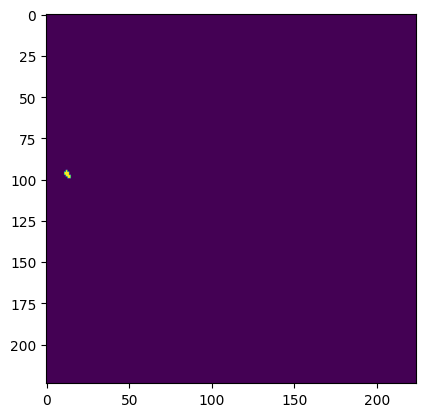

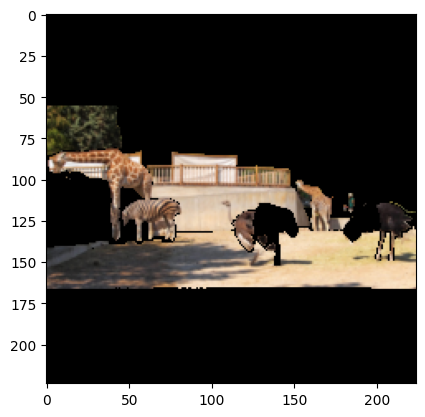

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 77, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 107, 110, 111, 117]
53 -18.56321096420288 4.69624400138855
58 -44.92534399032593 8.7657630443573
71 2.8000831604003906 -0.44236183166503906
highest until here with 71
36 -149.9389410018921 72.50250279903412
74 -0.8394122123718262 -0.02835988998413086
76 -9.162402153015137 1.225525140762329
79 -3.424346446990967 0.9226024150848389
99 -16.753268241882324 0.5679309368133545
3 7.580465078353882 -0.2785682678222656
highest until here with 3
4 -14.848458766937256 2.5624632835388184
5 16.036927700042725 29.045462608337402
6 -4.0322184562683105 -0.3570079803466797
13 -25.641202926635742 0.7347583770751953
14 -3.2898783683776855 -1.3040542602539062
16 -0.5041241645812988 0.2906382083892822
19 41.91482067108154 62.617474

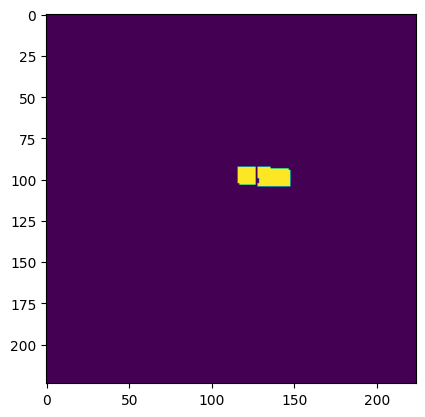

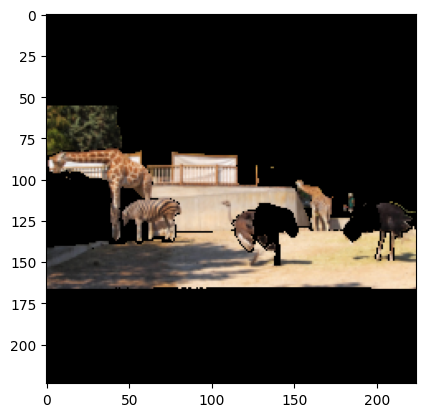

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 54, 59, 65, 67, 69, 72, 77, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 107, 110, 117, 119]
53 -56.45921230316162 2.590644359588623
58 -122.95777797698975 1.0827064514160156
71 1.1635422706604004 -0.30562877655029297
highest until here with 71
36 -370.4827308654785 45.30041217803955
74 -8.236432075500488 0.08135437965393066
76 -9.852993488311768 0.060176849365234375
79 -6.633126735687256 0.24252533912658691
99 -30.37618398666382 0.8320450782775879
3 8.696019649505615 -0.15767812728881836
highest until here with 3
4 -18.29169988632202 0.9374856948852539
5 14.792215824127197 11.478573083877563
6 -1.3337254524230957 0.0036478042602539062
13 -33.75788927078247 0.8558571338653564
14 -3.353404998779297 -0.4535794258117676
16 -7.105660438537598 0.24048686027526855
19 22.2405850887298

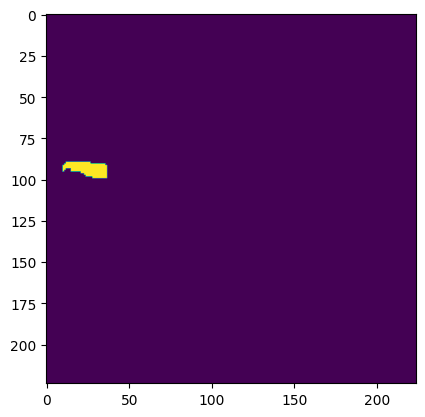

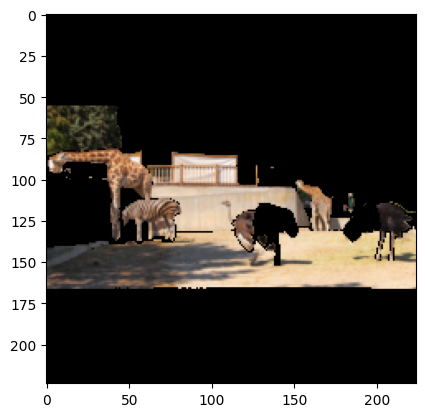

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 3, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 59, 65, 67, 69, 72, 77, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 107, 110, 117, 119]
53 -45.45265436172485 2.6228904724121094
58 -123.4804630279541 0.8944928646087646
71 0.33588409423828125 -0.45086145401000977
highest until here with 71
36 -287.5722408294678 55.64580857753754
74 -7.4253082275390625 0.08379817008972168
76 -13.85195255279541 0.07821917533874512
79 -8.782660961151123 0.37950873374938965
99 -30.166494846343994 1.227891445159912
3 10.381162166595459 -0.2655029296875
highest until here with 3
4 -13.81906270980835 1.7224431037902832
5 14.124459028244019 19.81292963027954
6 0.7881760597229004 -0.07494688034057617
13 -33.1215500831604 1.2028515338897705
14 -4.367411136627197 -0.7176041603088379
16 -7.709324359893799 0.3196895122528076
19 -13.663709163665771 50.

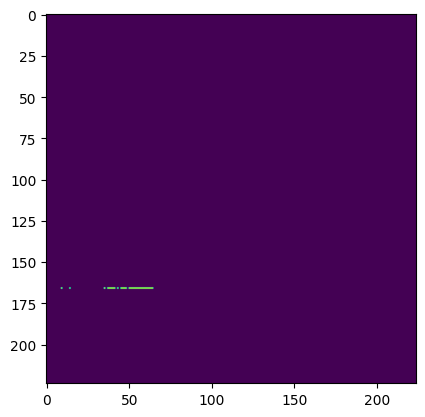

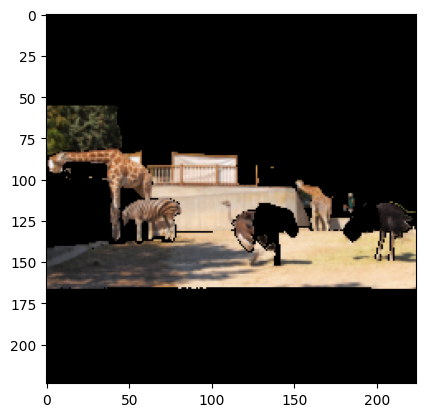

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 59, 65, 67, 69, 72, 77, 84, 85, 86, 87, 91, 92, 94, 97, 104, 105, 107, 110, 117, 119]
53 -44.3558931350708 2.3418962955474854
58 -117.87269115447998 0.7388532161712646
71 0.09356141090393066 -0.4300117492675781
highest until here with 71
36 -260.42065620422363 52.33035087585449
74 -6.501471996307373 0.0016808509826660156
76 -12.760138511657715 0.005888938903808594
79 -7.491862773895264 0.2540886402130127
99 -28.73373031616211 0.9876728057861328
4 -16.35812520980835 1.8852710723876953
5 10.47866940498352 19.303429126739502
6 0.7663488388061523 -0.12426376342773438
highest until here with 6
13 -34.26086902618408 0.9703278541564941
14 -2.9897093772888184 -0.7970809936523438
16 -8.130276203155518 0.3566563129425049
19 -9.112286567687988 48.50043058395386
20 -7.74842500686645

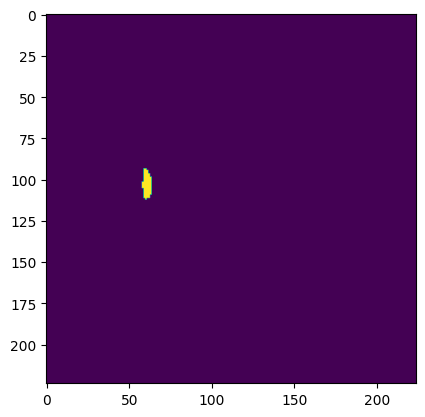

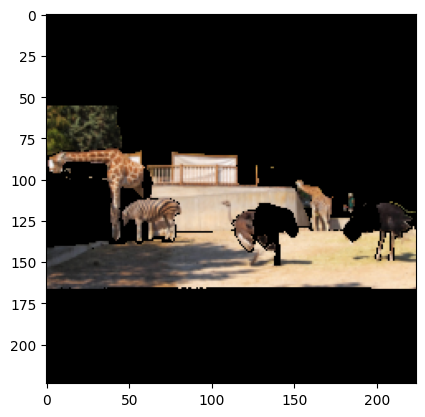

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3, 87]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 59, 65, 67, 69, 72, 77, 84, 85, 86, 91, 92, 94, 97, 104, 105, 107, 110, 117, 119]
53 -47.377657890319824 2.2406041622161865
58 -166.56694412231445 0.8755385875701904
71 0.7844150066375732 -0.3382086753845215
highest until here with 71
36 -299.223256111145 38.76296877861023
74 -6.672823429107666 0.005239248275756836
76 -12.043344974517822 -0.061583518981933594
79 -7.417857646942139 0.24268031120300293
99 -30.974245071411133 0.9429275989532471
4 -10.537898540496826 0.7170557975769043
5 2.3208320140838623 20.588994026184082
6 0.9443044662475586 -0.035881996154785156
13 -29.018962383270264 0.7896661758422852
14 -0.9240388870239258 -0.7347941398620605
16 -7.0583343505859375 0.20428895950317383
19 -23.328983783721924 53.13720107078552
20 -7.7063679695129395 0.2528190612792

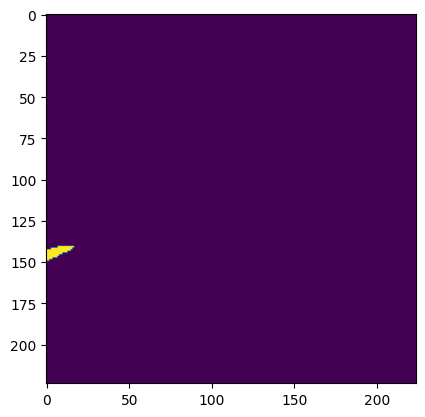

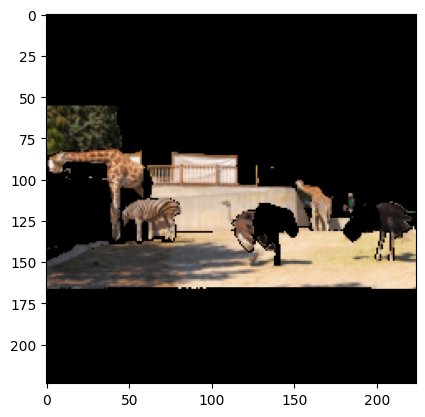

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3, 87, 110]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 59, 65, 67, 69, 72, 77, 84, 85, 86, 91, 92, 94, 97, 104, 105, 107, 117, 119]
53 -52.648067474365234 2.3081302642822266
58 -172.22905158996582 1.2240946292877197
71 0.8927404880523682 -0.350797176361084
highest until here with 71
36 -311.30638122558594 38.35166096687317
74 -6.969237327575684 0.025588274002075195
76 -9.865736961364746 -0.11682510375976562
79 -7.110869884490967 0.22232532501220703
99 -29.25708293914795 0.9123623371124268
4 -10.647010803222656 0.5196809768676758
5 -14.701390266418457 20.5439031124115
6 -0.06682872772216797 -0.0038504600524902344
13 -30.715131759643555 0.7443010807037354
14 -0.4269599914550781 -0.7220983505249023
16 -5.502891540527344 0.16959309577941895
19 -27.981340885162354 55.34624755382538
20 -8.070135116577148 0.258666276931762

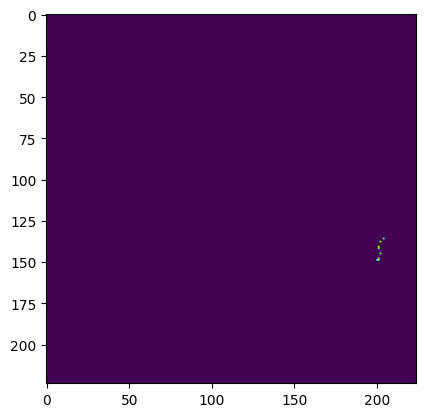

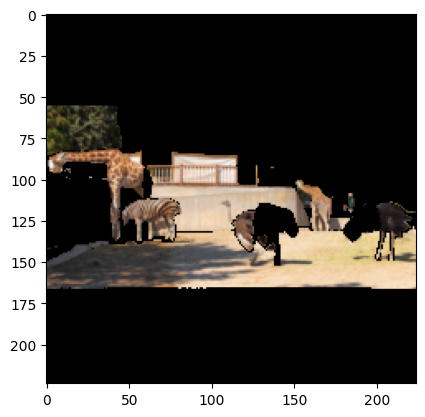

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3, 87, 110, 72]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 21, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 59, 65, 67, 69, 77, 84, 85, 86, 91, 92, 94, 97, 104, 105, 107, 117, 119]
53 -52.77378559112549 2.21293568611145
58 -175.83889961242676 1.244431734085083
71 0.8349001407623291 -0.33202171325683594
highest until here with 71
36 -325.20408630371094 40.1913583278656
74 -7.105767726898193 0.031435489654541016
76 -9.64670181274414 -0.10341405868530273
79 -7.4906110763549805 0.23632049560546875
99 -29.110634326934814 0.8508920669555664
4 -10.3132963180542 0.47302842140197754
5 -15.543174743652344 19.061309099197388
6 -1.0093450546264648 0.016617774963378906
13 -29.392755031585693 0.6980836391448975
14 -0.5754470825195312 -0.6767034530639648
16 -5.878698825836182 0.1774311065673828
19 -32.44849443435669 53.406113386154175
20 -8.472669124603271 0.2731740474700928
21 

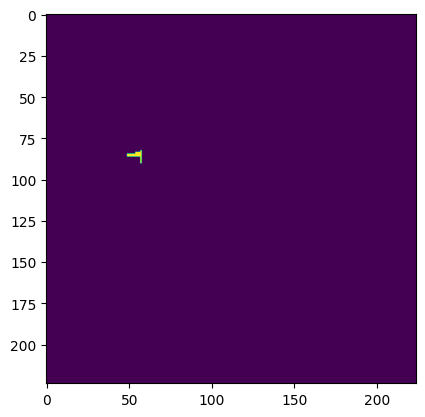

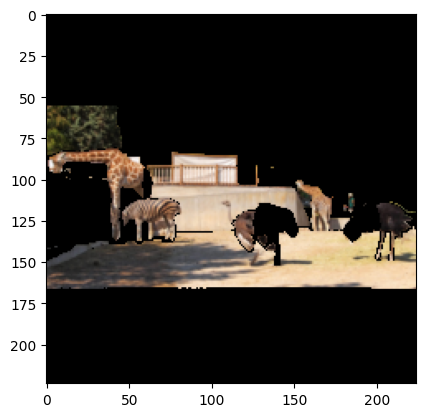

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3, 87, 110, 72, 21]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 25, 30, 31, 38, 40, 41, 43, 44, 45, 47, 52, 59, 65, 67, 69, 77, 84, 85, 86, 91, 92, 94, 97, 104, 105, 107, 117, 119, 66]
53 -58.557212352752686 1.941823959350586
58 -228.17721366882324 1.6222000122070312
71 0.9507656097412109 -0.24366378784179688
highest until here with 71
36 -369.1713333129883 34.38364863395691
74 -6.521344184875488 0.01678466796875
76 -8.637189865112305 -0.05893707275390625
79 -6.882190704345703 0.19472837448120117
99 -29.55493927001953 0.6663978099822998
4 -14.111363887786865 0.35063624382019043
5 -10.266435146331787 14.858818054199219
6 -1.1118531227111816 0.032776594161987305
13 -24.343204498291016 0.5431771278381348
14 -1.649916172027588 -0.47676563262939453
16 -6.400752067565918 0.15351176261901855
19 -39.32472467422485 57.68887102603912
20 -8.543777465820312 0.2168416976928711

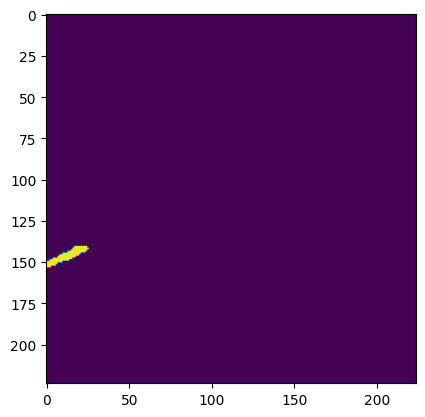

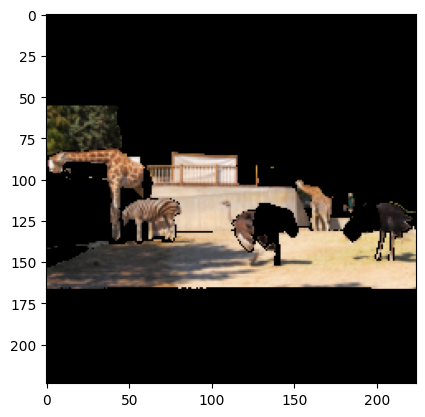

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3, 87, 110, 72, 21, 44]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 25, 30, 31, 38, 40, 41, 43, 45, 47, 52, 59, 65, 67, 69, 77, 84, 85, 86, 91, 92, 94, 97, 104, 105, 107, 117, 119, 66]
53 -58.61283540725708 1.973634958267212
58 -215.85693359375 1.4153063297271729
71 1.0893642902374268 -0.23589134216308594
highest until here with 71
36 -354.85548973083496 34.4071090221405
74 -6.886780261993408 0.026595592498779297
76 -10.072064399719238 -0.02257823944091797
79 -7.254445552825928 0.20418167114257812
99 -30.67713975906372 0.713801383972168
4 -7.188069820404053 -0.7194161415100098
5 -14.43556547164917 13.72019648551941
6 -0.9922146797180176 0.03396868705749512
13 -25.60431957244873 0.62980055809021
14 -1.3335227966308594 -0.4902958869934082
16 -6.522607803344727 0.1456737518310547
19 -31.441211700439453 57.40855932235718
20 -8.516788482666016 0.21767020225524902
25 -1

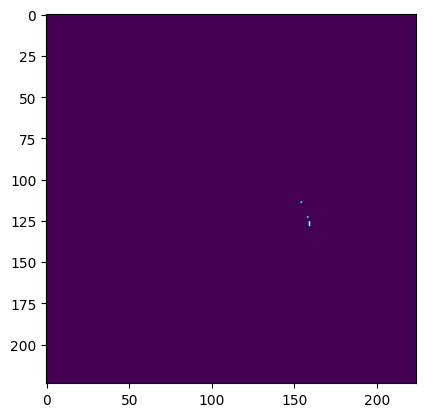

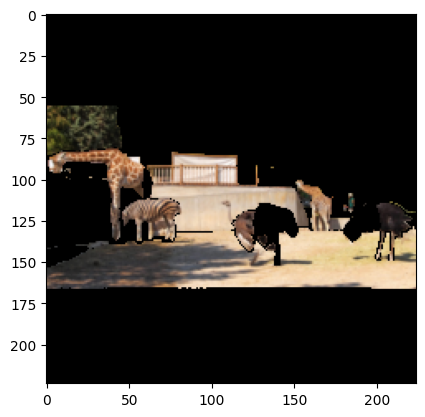

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3, 87, 110, 72, 21, 44, 30]
checking for  [53, 58, 71, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 25, 31, 38, 40, 41, 43, 45, 47, 52, 59, 65, 67, 69, 77, 84, 85, 86, 91, 92, 94, 97, 104, 105, 107, 117, 119, 66]
53 -59.79797840118408 1.8718957901000977
58 -234.14063453674316 1.3937652111053467
71 0.9145975112915039 -0.2622842788696289
highest until here with 71
36 -365.77043533325195 34.063953161239624
74 -6.6167473793029785 0.014442205429077148
76 -9.746861457824707 -0.05009174346923828
79 -6.524872779846191 0.19314885139465332
99 -31.80234432220459 0.7184207439422607
4 -7.2582244873046875 -0.6935954093933105
5 -15.289533138275146 12.890279293060303
6 -0.8472561836242676 0.02588033676147461
13 -26.01938247680664 0.6001055240631104
14 -1.7979741096496582 -0.459444522857666
16 -7.234668731689453 0.15195608139038086
19 -34.85182523727417 56.24364912509918
20 -8.595919609069824 0.2158284187316

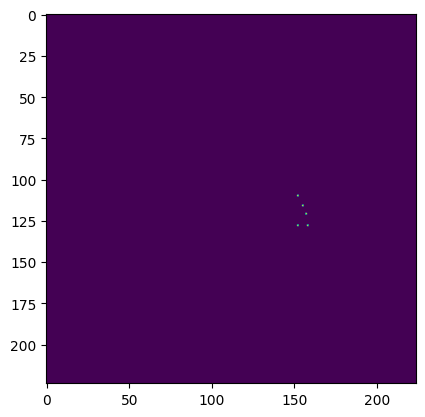

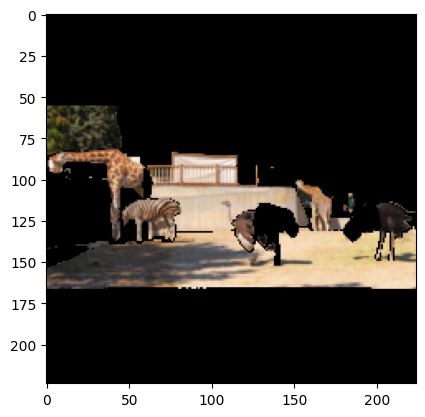

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3, 87, 110, 72, 21, 44, 30, 71]
checking for  [53, 58, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 25, 31, 38, 40, 41, 43, 45, 47, 52, 59, 65, 67, 69, 77, 84, 85, 86, 91, 92, 94, 97, 104, 105, 107, 117, 119, 66]
53 -67.93981790542603 1.8136382102966309
58 -238.94009590148926 1.4869868755340576
36 -395.16377449035645 32.48823285102844
74 -6.964266300201416 0.0186920166015625
76 -9.834539890289307 -0.05480051040649414
79 -7.764589786529541 0.19080042839050293
99 -33.71208906173706 0.6756782531738281
4 -7.635176181793213 -0.6415247917175293
5 -15.952086448669434 11.90347671508789
6 -1.1550068855285645 0.0009834766387939453
13 -26.742911338806152 0.5497515201568604
14 -1.7379283905029297 -0.43015480041503906
16 -7.967531681060791 0.14292001724243164
19 -39.23213481903076 53.89406085014343
20 -8.710801601409912 0.18559694290161133
25 -19.153451919555664 0.26880502700805664
31 -8.796954154968262 

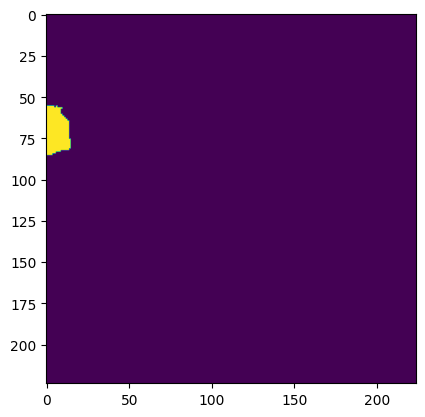

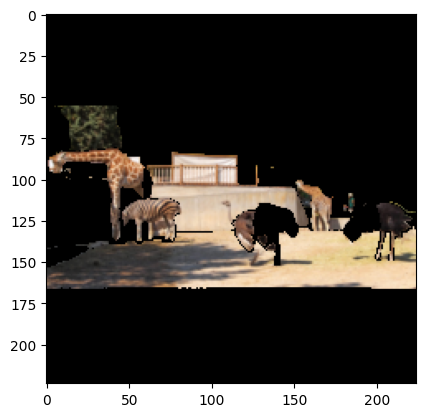

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3, 87, 110, 72, 21, 44, 30, 71, 94]
checking for  [53, 58, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 25, 31, 38, 40, 41, 43, 45, 47, 52, 59, 65, 67, 69, 77, 84, 85, 86, 91, 92, 97, 104, 105, 107, 117, 119, 66]
53 -74.57245588302612 2.0046889781951904
58 -230.58066368103027 1.7697274684906006
36 -338.7691020965576 32.06462860107422
74 -7.735240459442139 0.03959536552429199
76 -8.896446228027344 -0.04285573959350586
79 -7.169067859649658 0.18780231475830078
99 -30.08573055267334 0.5405902862548828
4 -3.5701394081115723 -0.7044553756713867
5 -7.968747615814209 11.253535747528076
6 -0.8778929710388184 -0.10222196578979492
13 -24.669277667999268 0.6351232528686523
14 -1.2102484703063965 -0.36106109619140625
16 -5.398356914520264 0.04559755325317383
19 -20.591354370117188 35.36210060119629
20 -8.949363231658936 0.12992620468139648
25 -22.811996936798096 0.4405558109283447
31 -14.007413387298584

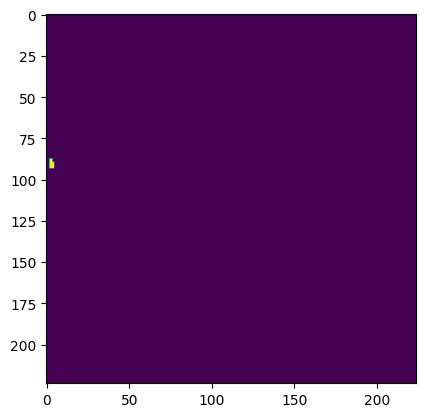

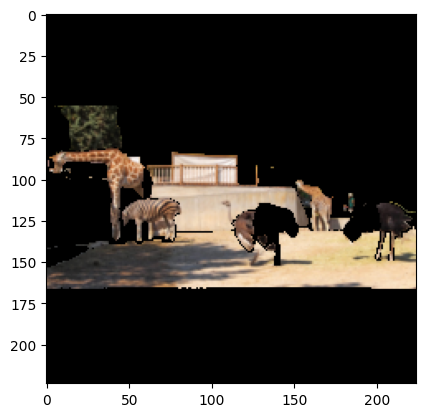

checking the adjacency list of  [51, 9, 0, 95, 89, 12, 81, 106, 39, 26, 2, 80, 73, 111, 54, 3, 87, 110, 72, 21, 44, 30, 71, 94, 67]
checking for  [53, 58, 36, 74, 76, 79, 99, 4, 5, 6, 13, 14, 16, 19, 20, 25, 31, 38, 40, 41, 43, 45, 47, 52, 59, 65, 69, 77, 84, 85, 86, 91, 92, 97, 104, 105, 107, 117, 119, 66]
53 -73.59483242034912 2.1810293197631836
58 -228.96840572357178 1.9436836242675781
36 -337.0201110839844 33.460408449172974
74 -7.839012145996094 0.028377771377563477
76 -8.836913108825684 -0.0479578971862793
79 -7.550156116485596 0.22606849670410156
99 -29.478931427001953 0.6105303764343262
4 -3.339564800262451 -0.8530378341674805
5 -9.587156772613525 12.159383296966553
6 -0.9962320327758789 -0.0876307487487793
13 -22.897374629974365 0.6313502788543701
14 -0.9506821632385254 -0.39200782775878906
16 -5.384993553161621 0.052642822265625
19 -18.631350994110107 31.961774826049805
20 -8.981215953826904 0.1607358455657959
25 -22.13364839553833 0.4747331142425537
31 -14.34088945388794 0.4

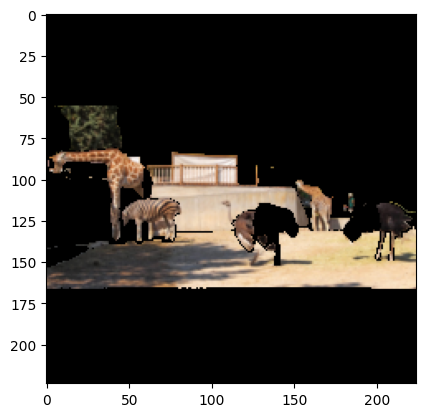

4 -3.339564800262451 -0.8530378341674805
5 -9.587156772613525 12.159383296966553
6 -0.9962320327758789 -0.0876307487487793
13 -22.897374629974365 0.6313502788543701
14 -0.9506821632385254 -0.39200782775878906
16 -5.384993553161621 0.052642822265625
19 -18.631350994110107 31.961774826049805
20 -8.981215953826904 0.1607358455657959
25 -22.13364839553833 0.4747331142425537
31 -14.34088945388794 0.488048791885376
36 -337.0201110839844 33.460408449172974
38 -15.060853958129883 -0.05463361740112305
40 -2.182888984680176 -0.02079010009765625
41 -7.939779758453369 0.08754134178161621
43 -18.284916877746582 0.18319487571716309
45 -34.700751304626465 0.66794753074646
47 -16.80121421813965 -0.07635354995727539
48 -5.991780757904053 0.16074776649475098
52 -87.51665353775024 2.0034432411193848
53 -73.59483242034912 2.1810293197631836
58 -228.96840572357178 1.9436836242675781
59 -14.364099502563477 -1.1791348457336426
65 -5.4041266441345215 0.4277348518371582
66 -19.763457775115967 1.048463582992553

In [448]:
final_segs_forlabel=[]
segments_for_label=[]
im_prev=copy.deepcopy(im)
image_prev=copy.deepcopy(image)
predictions_prev=copy.deepcopy(predictions)
segs_to_check=copy.deepcopy(list_of_all_segs)
# segs_to_check=copy.deepcopy(sorted(type1_comb_list))


prediction1=top10list[0]
prediction2=top10list[1]

while(True):
    print('checking from first')
    for i in segments_for_label:
        final_segs_forlabel.append(i)
    print('new final set of segments ',final_segs_forlabel)
    
    for seg in segments_for_label:
        segs_to_check.remove(seg)

    print('new set of segments checking ',segs_to_check)
    print('calculating adjacency list')
    
    adjacency_list=calc_adjacency_list(segs_to_check,new_segs)
    
    
    if final_segs_forlabel!=[]:
        im_prev=copy.deepcopy(new_im_highest_dip)
        image_prev=copy.deepcopy(new_im1_highest_dip)

    print('new image')
    plt.imshow(image_prev)
    plt.show()
    
    segments_for_label=[]
    adj_segments_for_label=[]
    max_dip=0
    Found=False
    max_dis=0
    #############################function with segs_to_check,model_using,im,image,predictions
    for i in segs_to_check:
    
        mask_intersection=get_mask([i],new_segs)
        masking_type='normal/'
        new_im=mask_on_image(im_prev , mask_intersection, masking_type)
        new_im1=mask_on_image(image_prev , mask_intersection, masking_type)
        (predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
        # label1_dip_perc=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy()))/np.sum(new_segs[i]))*100
        # label2_dip_perc=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy()))/np.sum(new_segs[i]))*100

        label1_dip_perc=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy())))*100
        label2_dip_perc=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy())))*100
    
        
        print(i,label1_dip_perc,label2_dip_perc)
        if label1_dip_perc > label2_dip_perc and  max_dis < label1_dip_perc-label2_dip_perc:
        # if label1_dip_perc > label2_dip_perc and max_dip < label1_dip_perc and max_dis < label1_dip_perc-label2_dip_perc:
        # if label1_dip_perc > label2_dip_perc and max_dip < label1_dip_perc :
    
            max_dis=label1_dip_perc-label2_dip_perc
            max_dip = label1_dip_perc
            max_dip_at = i
            predictions_highest_dip=predictions_temp
            new_im_highest_dip=new_im
            new_im1_highest_dip=new_im1
            Found=True
    
    if max_dip==0:
        break
    predictions_prev=copy.deepcopy(predictions_highest_dip)
    im_prev=copy.deepcopy(new_im_highest_dip)
    image_prev=copy.deepcopy(new_im1_highest_dip)
    if Found==True:
        print('maximum dip at ',max_dip_at)
        plt.imshow(new_segs[max_dip_at])
        plt.show()
        plt.imshow(new_im1_highest_dip)
        plt.show()
    
    
    ####################close function ,return i as max_dip_at
    
    while Found == True:
        
        max_dip=0
        max_dis=0
        Found=False
        
        segments_for_label.append(max_dip_at)
        for k in segments_for_label:
            for kk in adjacency_list[k]:
                if kk not in adj_segments_for_label and kk not in segments_for_label:
                    adj_segments_for_label.append(kk)
            # adj_segments_for_label
            # print(adjacency_list[k])
            # print(adj_segments_for_label)
        if max_dip_at in adj_segments_for_label:
            adj_segments_for_label.remove(max_dip_at)
            
        print('checking the adjacency list of ',segments_for_label)
        print('checking for ',adj_segments_for_label)
        
        for p in adj_segments_for_label:
            # print('checking for ',p)
            mask_intersection=get_mask(segments_for_label,new_segs)
            masking_type='normal/'
            new_im=mask_on_image(im_prev , mask_intersection, masking_type)
            new_im1=mask_on_image(image_prev , mask_intersection, masking_type)
            (predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
            # label1_dip_perc_a=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy()))/np.sum(new_segs[p]))*100
            # label2_dip_perc_a=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy()))/np.sum(new_segs[p]))*100

            label1_dip_perc_a=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy())))*100
            label2_dip_perc_a=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy())))*100
    
    
            mask_intersection=get_mask([p],new_segs)
            masking_type='normal/'
            new_im=mask_on_image(im_prev , mask_intersection, masking_type)
            new_im1=mask_on_image(image_prev , mask_intersection, masking_type)
            (predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
            # label1_dip_perc_b=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy()))/np.sum(new_segs[p]))*100
            # label2_dip_perc_b=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy()))/np.sum(new_segs[p]))*100

            label1_dip_perc_b=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy())))*100
            label2_dip_perc_b=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy())))*100

            mask_intersection=get_mask([p]+segments_for_label,new_segs)
            masking_type='normal/'
            new_im=mask_on_image(im_prev , mask_intersection, masking_type)
            new_im1=mask_on_image(image_prev , mask_intersection, masking_type)
            (predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
            # label1_dip_perc=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy()))/np.sum(new_segs[p]))*100
            # label2_dip_perc=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy()))/np.sum(new_segs[p]))*100

            label1_dip_perc=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy())))*100
            label2_dip_perc=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy())))*100
    
            print(p,label1_dip_perc,label2_dip_perc)
            if label1_dip_perc > label2_dip_perc and  max_dis < label1_dip_perc-label2_dip_perc:
            # if label1_dip_perc > label2_dip_perc and max_dip < label1_dip_perc:#  and label1_dip_perc_b > label2_dip_perc_b:#and label1_dip_perc>label1_dip_perc_a+label1_dip_perc_b
                print('highest until here with', p)
                Found=True
                max_dis=label1_dip_perc-label2_dip_perc
                max_dip = label1_dip_perc
                max_dip_at = p
                predictions_highest_dip=predictions_temp
                new_im_highest_dip=new_im
                new_im1_highest_dip=new_im1
        
        predictions_prev=copy.deepcopy(predictions_highest_dip)
        # print([max_dip_at]+segments_for_label)
        if Found==True:
            print('maximum dip at ',max_dip_at)
            plt.imshow(new_segs[max_dip_at])
            plt.show()
            plt.imshow(new_im1_highest_dip)
            plt.show()
        # im_prev=copy.deepcopy(new_im_highest_dip)
        # image_prev=copy.deepcopy(new_im1_highest_dip)
    
        
     



In [449]:
A=final_segs_forlabel

checking from first
new final set of segments  []
new set of segments checking  [0, 2, 3, 4, 5, 6, 9, 12, 13, 14, 16, 19, 20, 21, 25, 26, 30, 31, 36, 38, 39, 40, 41, 43, 44, 45, 47, 48, 51, 52, 53, 54, 58, 59, 65, 66, 67, 69, 71, 72, 73, 74, 76, 77, 78, 79, 80, 81, 84, 85, 86, 87, 89, 91, 92, 94, 95, 96, 97, 99, 100, 104, 105, 106, 107, 110, 111, 117, 118, 119, 120]
calculating adjacency list
new image


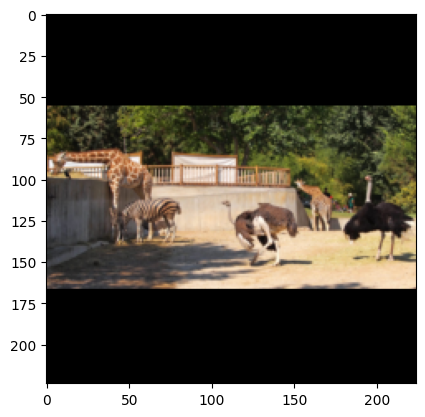

0 8.137214183807373 13.538753986358643
2 22.914212942123413 -15.305137634277344
3 2.5412440299987793 -0.8687973022460938
4 -12.269866466522217 -3.8651347160339355
5 48.71504306793213 -36.41468286514282
6 -11.944377422332764 3.082972764968872
9 -77.44381427764893 68.50691735744476
12 49.89876747131348 86.21902018785477
13 6.6234290599823 -9.124243259429932
14 -2.9411673545837402 -2.2408366203308105
16 1.8720030784606934 1.9562900066375732
19 69.89394426345825 72.7279007434845
20 -0.8643507957458496 2.0941615104675293
21 -1.237344741821289 -4.592001438140869
25 16.13052487373352 -23.650503158569336
26 -8.306825160980225 3.098142147064209
30 0.607532262802124 0.6587088108062744
31 -15.23892879486084 13.397616147994995
36 82.92659670114517 37.118542194366455
38 -1.2514233589172363 0.9266495704650879
39 -12.573599815368652 3.7242889404296875
40 4.471147060394287 -0.041925907135009766
41 -4.301738739013672 -11.19321584701538
43 19.367843866348267 -9.760630130767822
44 -7.400393486022949 2.28

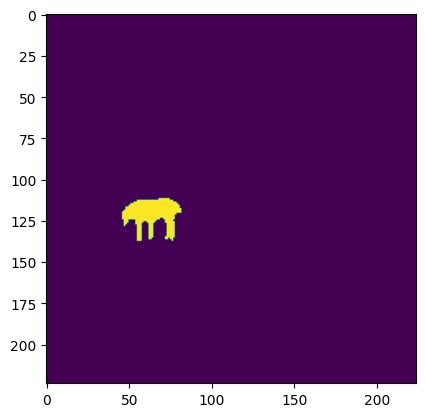

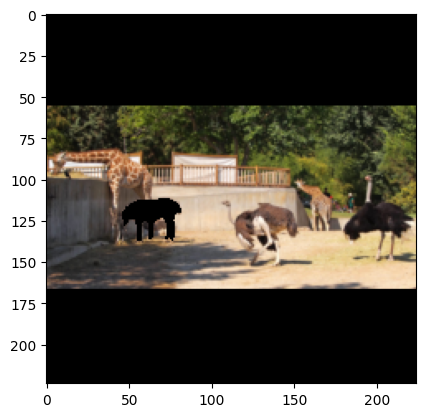

checking the adjacency list of  [5]
checking for  [0, 14, 26, 40, 41, 58, 87, 91, 100]
0 -38.52201700210571 0.7398664951324463
14 -5.21925687789917 -3.432798385620117
26 -4.582107067108154 4.140883684158325
40 1.4553248882293701 2.5245606899261475
41 -1.2521862983703613 -0.03635883331298828
58 6.851142644882202 12.035685777664185
87 20.243406295776367 15.071165561676025
highest until here with 87
91 7.465863227844238 -0.03556013107299805
highest until here with 91
100 -21.243178844451904 -4.51810359954834
maximum dip at  91


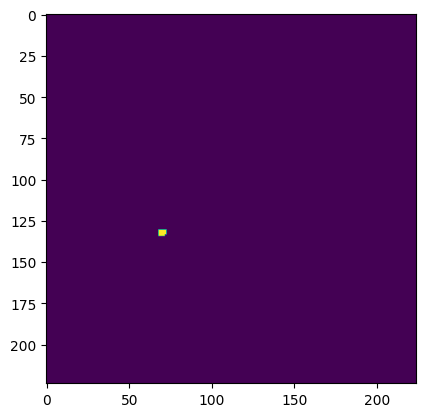

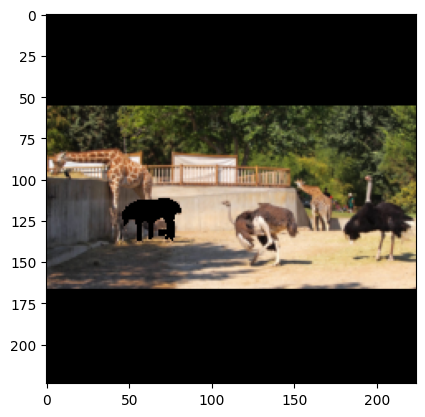

checking the adjacency list of  [5, 91]
checking for  [0, 14, 26, 40, 41, 58, 87, 100]
0 -44.56899166107178 -1.6273975372314453
14 -6.495106220245361 -2.1324515342712402
26 -8.693110942840576 3.9227962493896484
40 0.573045015335083 2.280116081237793
41 -1.2728571891784668 4.290628433227539
58 8.618605136871338 18.996471166610718
87 18.676745891571045 14.130258560180664
highest until here with 87
100 -32.70493745803833 8.70659351348877
maximum dip at  87


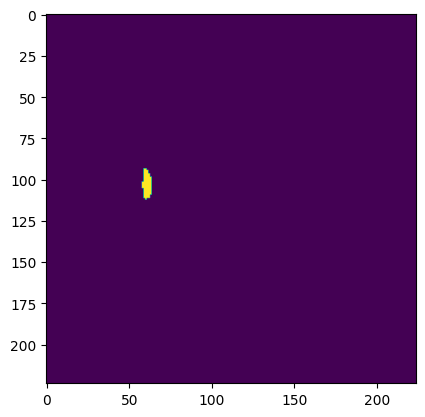

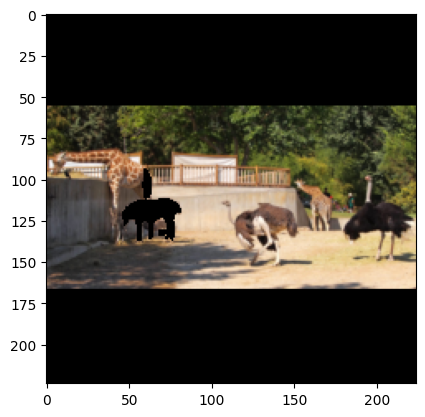

checking the adjacency list of  [5, 91, 87]
checking for  [0, 14, 26, 40, 41, 58, 100, 16, 19, 59]
0 -45.434367656707764 2.356398105621338
14 -6.123769283294678 -2.5708436965942383
26 -7.568955421447754 -0.6539702415466309
40 -3.941333293914795 4.535847902297974
41 -3.673577308654785 7.126480340957642
58 31.0197114944458 21.119755506515503
highest until here with 58
100 -27.522337436676025 8.417940139770508
16 1.8383204936981201 2.879136800765991
19 65.30804634094238 57.567816972732544
59 -46.487319469451904 9.600555896759033
maximum dip at  58


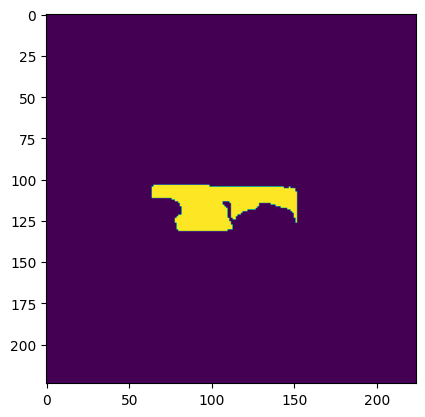

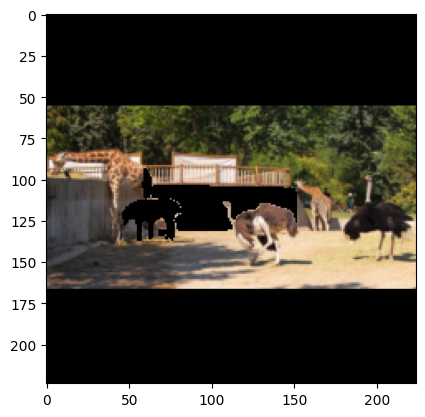

checking the adjacency list of  [5, 91, 87, 58]
checking for  [0, 14, 26, 40, 41, 100, 16, 19, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 111, 118, 119]
0 -22.824490070343018 2.9372036457061768
14 3.8058578968048096 11.016380786895752
26 -6.319010257720947 -1.8265843391418457
40 5.253857374191284 3.421640396118164
highest until here with 40
41 10.556930303573608 12.844628095626831
100 15.05545973777771 15.065062046051025
16 1.4340877532958984 0.4088938236236572
19 65.05636274814606 38.05022835731506
highest until here with 19
59 -42.666423320770264 7.482039928436279
9 -291.2083625793457 61.49989068508148
25 0.15839338302612305 6.680858135223389
31 -29.794561862945557 10.173559188842773
36 91.20131656527519 71.17594182491302
51 -88.65565061569214 84.60147976875305
53 -24.17045831680298 67.44541525840759
71 1.1576354503631592 2.7389943599700928
78 -0.11279582977294922 0.4233419895172119
104 3.2525479793548584 -0.1900196075439453
111 -4.754757881164551 -28.832435607910156
118 6.3154280185699

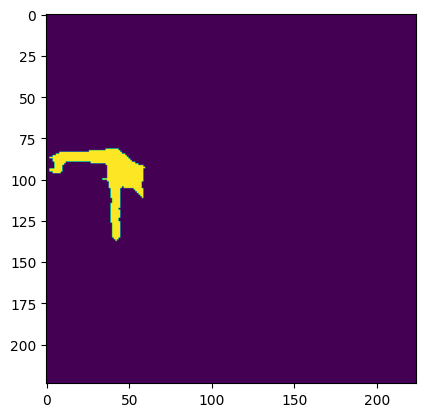

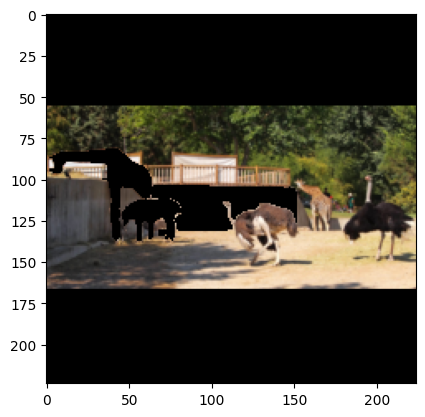

checking the adjacency list of  [5, 91, 87, 58, 19]
checking for  [0, 14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 111, 118, 119, 2, 12, 21, 45, 54, 66, 67, 92, 94]
0 -14.923667907714844 -64.97347354888916
highest until here with 0
14 1.9945919513702393 9.58225131034851
26 -15.502583980560303 -9.189856052398682
40 -0.288236141204834 3.1159579753875732
41 -1.3683795928955078 5.260592699050903
100 14.969402551651001 6.128513813018799
16 -0.27654170989990234 -0.36934614181518555
59 8.712691068649292 3.343343734741211
9 -266.7487144470215 62.16309070587158
25 -3.5419106483459473 4.891812801361084
31 -34.169650077819824 4.571080207824707
36 90.25645852088928 73.37937355041504
51 -78.05519104003906 84.3332052230835
53 3.872990608215332 70.65757811069489
71 1.7291009426116943 3.1547069549560547
78 0.7838666439056396 1.3235688209533691
104 1.7842233180999756 -0.5308866500854492
111 -11.997318267822266 -37.81036138534546
118 2.727019786834717 3.3659756183624268
119 -5.330014

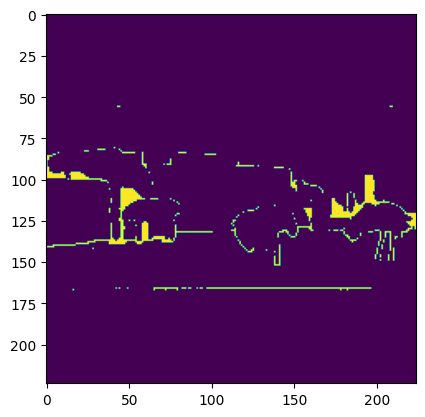

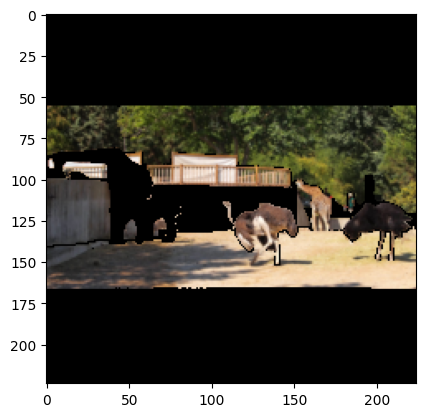

checking the adjacency list of  [5, 91, 87, 58, 19, 0]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 111, 118, 119, 2, 12, 21, 45, 54, 66, 67, 92, 94, 3, 4, 6, 13, 20, 30, 38, 39, 43, 44, 47, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 95, 97, 99, 105, 106, 107, 110, 117]
14 -4.474771022796631 9.216243028640747
26 -11.274826526641846 32.10375905036926
40 -2.845168113708496 0.3074049949645996
41 6.89237117767334 5.196952819824219
highest until here with 41
100 2.2440731525421143 15.848064422607422
16 -2.1652936935424805 -9.654247760772705
highest until here with 16
59 -15.016818046569824 6.9882214069366455
9 -141.694974899292 55.846452713012695
25 -8.584833145141602 -0.289309024810791
31 -0.7311105728149414 -5.248880386352539
36 76.22382044792175 74.7015506029129
51 -109.47215557098389 79.41372692584991
53 6.539171934127808 54.08874452114105
71 0.1515209674835205 -1.067817211151123
78 -3.7879109382629395 1.0389506816864014
104 1.404786109924

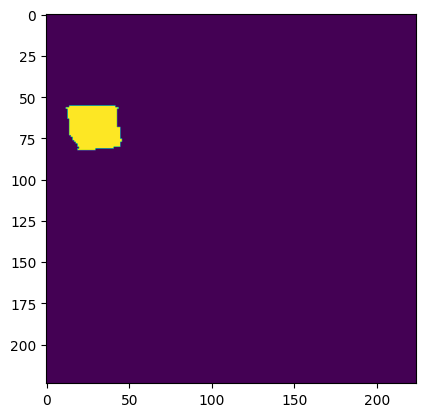

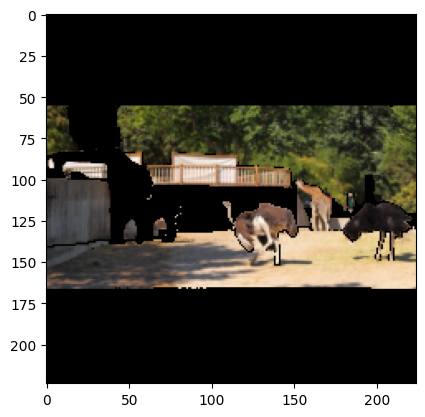

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 111, 118, 119, 2, 12, 21, 45, 54, 66, 67, 94, 3, 4, 6, 13, 20, 30, 38, 39, 43, 44, 47, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 95, 97, 99, 105, 106, 107, 110, 117]
14 -3.6987662315368652 11.33190393447876
26 -3.857564926147461 37.87756562232971
40 -2.375626564025879 -1.100301742553711
41 7.51376748085022 3.612661361694336
highest until here with 41
100 6.027513742446899 18.460607528686523
16 -0.8943557739257812 -9.65644121170044
highest until here with 16
59 -6.392836570739746 17.695975303649902
9 -162.92600631713867 54.21891510486603
25 -9.748661518096924 1.2649178504943848
31 -3.693222999572754 -3.7244677543640137
36 74.2958128452301 74.0881860256195
51 -96.57707214355469 78.92917692661285
53 3.441399335861206 53.11937928199768
71 0.15039443969726562 -1.2426495552062988
78 -2.6339292526245117 0.715947151184082
104 2.238917350769043

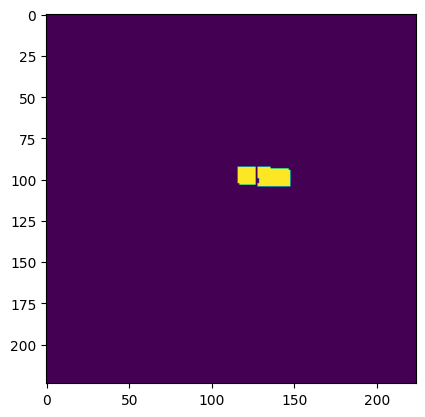

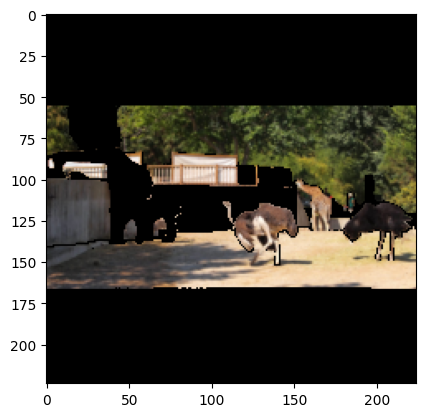

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 67, 94, 3, 4, 6, 13, 20, 30, 38, 39, 43, 44, 47, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 95, 97, 99, 105, 106, 107, 110, 117]
14 -8.770346641540527 10.767954587936401
26 -7.947182655334473 35.74818968772888
40 -2.4358510971069336 -0.6053686141967773
41 8.334225416183472 3.446286916732788
highest until here with 41
100 4.151880741119385 15.344077348709106
16 4.953324794769287 -4.290533065795898
highest until here with 16
59 -15.058410167694092 18.59995126724243
9 -148.03121089935303 64.38523828983307
25 -12.906527519226074 1.7809808254241943
31 -29.07238006591797 -10.498201847076416
36 78.03412675857544 74.8582512140274
51 -78.7793755531311 83.24704021215439
53 7.156670093536377 52.97718644142151
71 3.6876380443573 -2.155733108520508
78 -0.9628176689147949 0.9304285049438477
104 -3.637385368347168

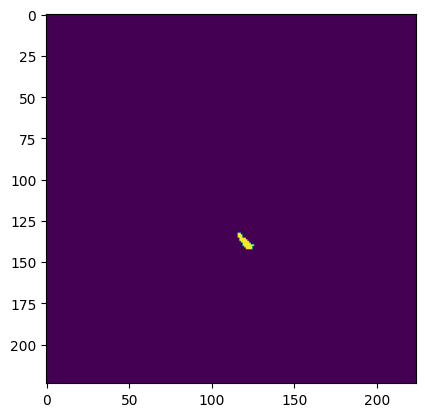

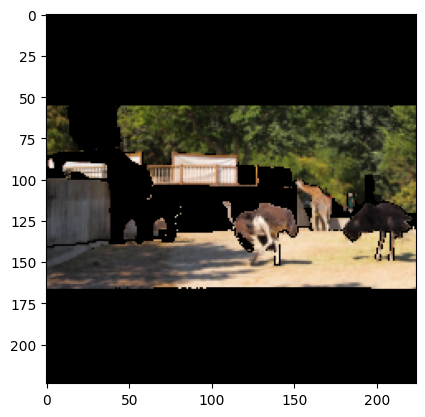

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 67, 94, 3, 4, 6, 13, 20, 30, 38, 39, 43, 44, 47, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 95, 97, 105, 106, 107, 110, 117]
14 -26.802372932434082 14.252018928527832
26 -4.489314556121826 33.32114219665527
40 -2.3441672325134277 0.17672181129455566
41 7.8833818435668945 2.9234111309051514
highest until here with 41
100 4.349333047866821 14.87857699394226
16 6.468725204467773 -1.605069637298584
highest until here with 16
59 -15.628480911254883 20.930415391921997
9 -207.08582401275635 60.10023355484009
25 -10.129153728485107 8.159726858139038
31 -22.24268913269043 -5.259907245635986
36 62.139344215393066 74.09915030002594
51 -165.83702564239502 78.88333946466446
53 1.1523127555847168 49.81416463851929
71 3.126406669616699 -1.6706466674804688
78 0.04350543022155762 4.151660203933716
104 -1.7460465

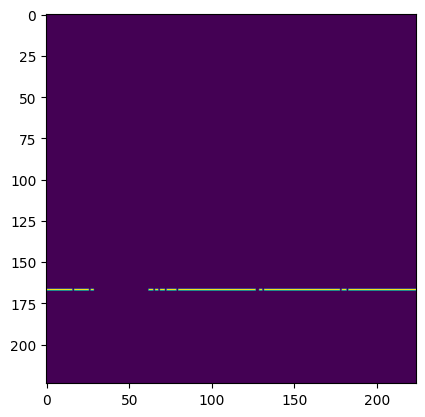

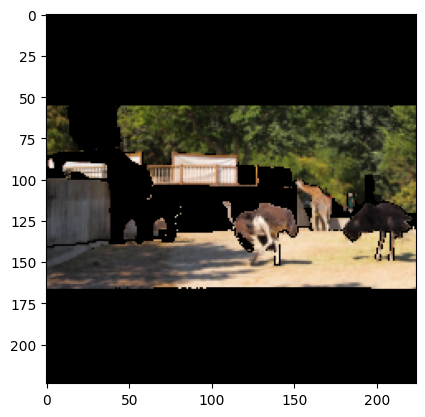

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 67, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 47, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 95, 97, 105, 106, 107, 110, 117]
14 -25.950539112091064 11.76537275314331
26 -4.093968868255615 35.00707149505615
40 -1.4142155647277832 1.271986961364746
41 7.8749775886535645 1.5119969844818115
highest until here with 41
100 1.1336565017700195 12.633156776428223
16 7.203596830368042 -1.3145685195922852
highest until here with 16
59 -13.506686687469482 21.891599893569946
9 -187.80124187469482 58.619698882102966
25 -14.716124534606934 6.04473352432251
31 -19.1017746925354 -3.9381027221679688
36 67.2883540391922 76.37041211128235
51 -185.2243423461914 79.43626642227173
53 -4.402041435241699 47.334665060043335
71 3.6652684211730957 -1.0701537132263184
78 -0.8094191551208496 3.4531056880950928
104 0.08790493

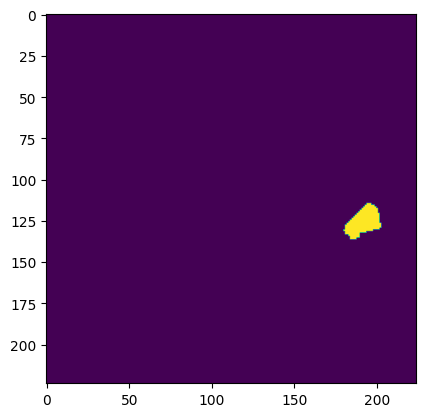

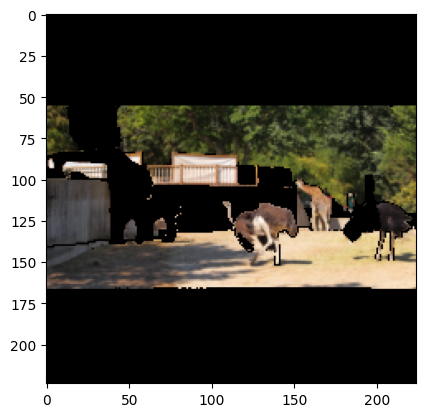

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 67, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 47, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 97, 105, 106, 107, 110, 117]
14 -34.64100360870361 15.028959512710571
26 2.237647771835327 41.69265031814575
40 -0.5588412284851074 1.5898823738098145
41 5.614250898361206 0.8779287338256836
highest until here with 41
100 5.257803201675415 20.048236846923828
16 6.659871339797974 -1.5620231628417969
highest until here with 16
59 -16.16642475128174 28.653454780578613
9 -465.1334285736084 55.86639940738678
25 -2.9265522956848145 15.301293134689331
31 -10.665714740753174 -0.5014300346374512
36 78.53743135929108 81.36506229639053
51 -414.9217128753662 83.13120901584625
53 -69.8611855506897 34.084200859069824
71 5.400395393371582 0.5203366279602051
78 4.321008920669556 7.87244439125061
104 -9.42723751068115

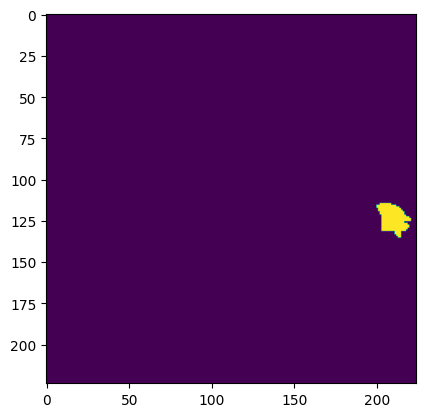

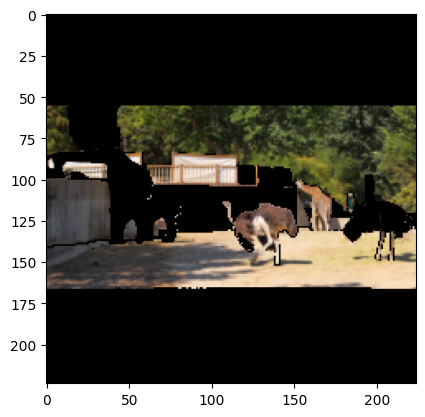

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 67, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 47, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 105, 106, 107, 110, 117]
14 -39.209067821502686 14.822709560394287
26 7.453811168670654 44.454389810562134
40 -0.08684396743774414 1.843029260635376
41 4.015308618545532 0.6671726703643799
highest until here with 41
100 5.1320672035217285 22.57530689239502
16 9.079927206039429 0.12736916542053223
highest until here with 16
59 -8.626365661621094 32.0056676864624
9 -567.8560256958008 55.57534992694855
25 -4.5287251472473145 12.931197881698608
31 -7.006716728210449 2.8826534748077393
36 72.51851260662079 81.53985291719437
51 -505.88693618774414 86.74391955137253
53 -76.72468423843384 41.27466678619385
71 7.630187273025513 1.0345399379730225
78 4.86031174659729 8.73447060585022
104 -11.038625240325928

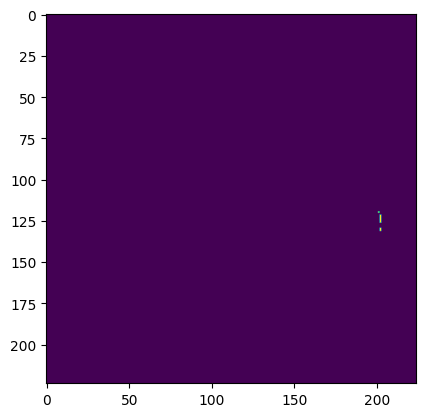

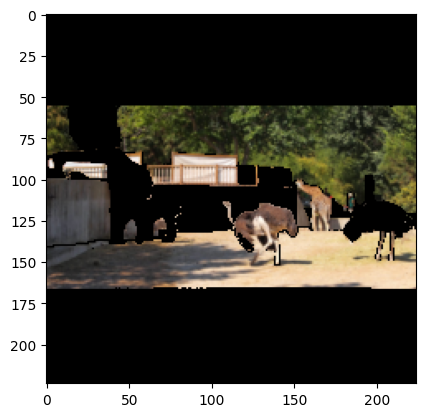

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 67, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 105, 106, 107, 110, 117]
14 -42.034912109375 10.626763105392456
26 0.05065202713012695 40.217798948287964
40 0.5961418151855469 2.6114344596862793
41 5.253320932388306 1.6019165515899658
highest until here with 41
100 1.4543592929840088 18.156814575195312
16 8.475571870803833 -0.1165151596069336
highest until here with 16
59 -8.120059967041016 28.80607843399048
9 -566.7569160461426 47.782135009765625
25 -9.174752235412598 10.01158356666565
31 -9.967923164367676 0.3937065601348877
36 71.7953234910965 87.69372627139091
51 -609.2112064361572 81.45893067121506
53 -9.369444847106934 59.660667181015015
71 6.525689363479614 0.9968936443328857
78 3.845769166946411 7.151752710342407
104 -9.846305847167969 

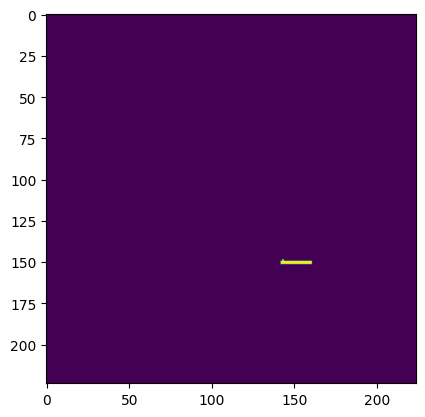

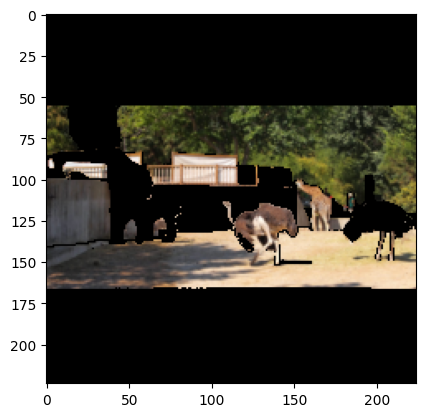

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 67, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 105, 106, 107, 110]
14 -43.66631507873535 9.530621767044067
26 0.06570816040039062 39.84087109565735
40 0.5090415477752686 2.592998743057251
41 5.3253173828125 1.5323877334594727
highest until here with 41
100 1.5580236911773682 17.82251000404358
16 8.170181512832642 -0.5035758018493652
highest until here with 16
59 -8.251535892486572 28.9101243019104
9 -607.0370674133301 47.34625816345215
25 -10.931527614593506 12.122488021850586
31 -13.45900297164917 0.16453862190246582
36 67.15550720691681 88.00291195511818
51 -722.5532531738281 79.16759997606277
53 -10.764217376708984 59.1333270072937
71 6.259500980377197 1.3099730014801025
78 3.0478477478027344 7.758241891860962
104 -14.469313621520996 -

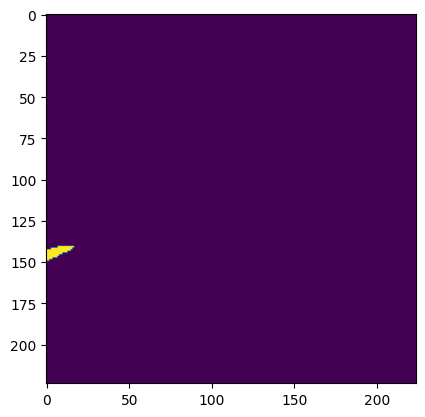

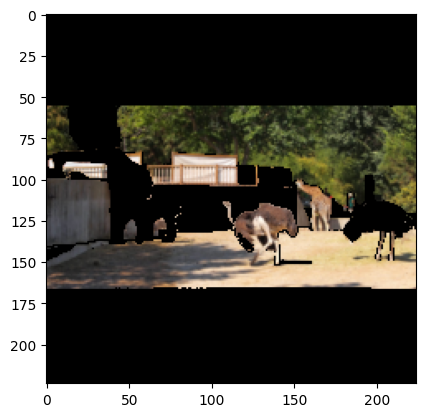

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 67, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 105, 106, 107]
14 -47.71015644073486 10.023045539855957
26 -0.6967306137084961 46.17606997489929
40 2.5032222270965576 3.1038761138916016
41 6.2775373458862305 1.978832483291626
highest until here with 41
100 2.9613852500915527 22.131389379501343
16 8.436065912246704 0.3764510154724121
highest until here with 16
59 -9.409070014953613 28.71910333633423
9 -574.2444515228271 50.14445185661316
25 -12.352514266967773 10.85163950920105
31 -12.664306163787842 1.5811622142791748
36 68.0823802947998 88.26143890619278
51 -769.5343971252441 77.51669138669968
53 0.7603287696838379 63.436490297317505
71 6.495636701583862 1.66206955909729
78 3.107219934463501 8.387553691864014
104 -15.392863750457764 

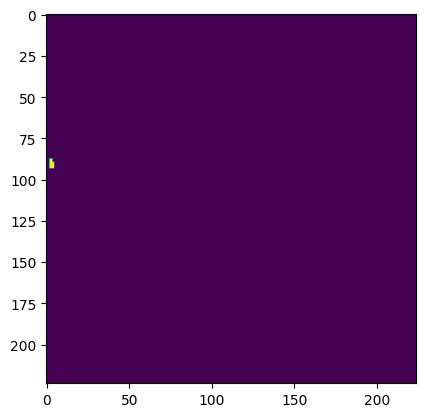

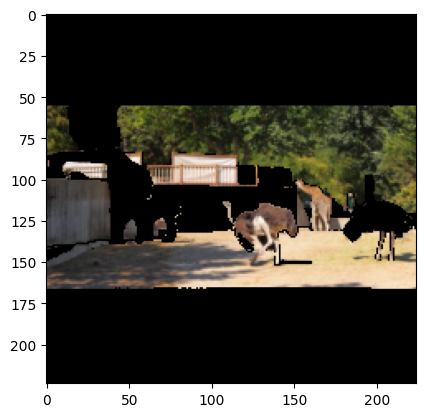

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 86, 89, 105, 106, 107]
14 -48.13807010650635 9.386169910430908
26 -3.010249137878418 44.12596821784973
40 -0.057375431060791016 1.7737030982971191
41 6.814295053482056 1.5574097633361816
highest until here with 41
100 3.650820255279541 20.768409967422485
16 8.773761987686157 -0.6538510322570801
highest until here with 16
59 -9.784388542175293 29.080069065093994
9 -563.2102966308594 50.15801191329956
25 -10.958361625671387 11.68813705444336
31 -12.245750427246094 1.616150140762329
36 68.00142228603363 88.62266317009926
51 -686.1155033111572 78.87443006038666
53 4.4777750968933105 65.50690829753876
71 6.382650136947632 1.5954315662384033
78 3.345900774002075 8.428972959518433
104 -14.5089626312255

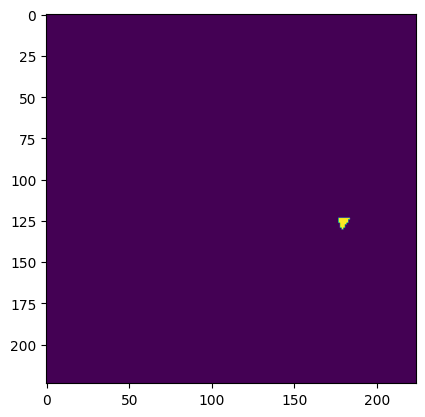

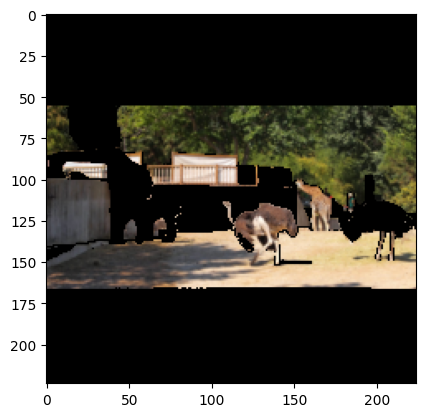

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86]
checking for  [14, 26, 40, 41, 100, 16, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 89, 105, 106, 107]
14 -45.390236377716064 10.00666618347168
26 3.0398130416870117 48.0359673500061
40 -1.304304599761963 0.6873965263366699
41 6.748396158218384 2.6467323303222656
highest until here with 41
100 8.892017602920532 24.70824122428894
16 7.70382285118103 -0.7168889045715332
highest until here with 16
59 -7.15872049331665 31.697356700897217
9 -572.3301410675049 51.20502710342407
25 -9.285914897918701 13.441389799118042
31 -17.187082767486572 -2.23538875579834
36 55.890581011772156 87.17101514339447
51 -746.8655586242676 78.77432554960251
53 -31.91201686859131 54.194656014442444
71 8.078455924987793 1.8111705780029297
78 3.612542152404785 10.044437646865845
104 -20.077943801879883 

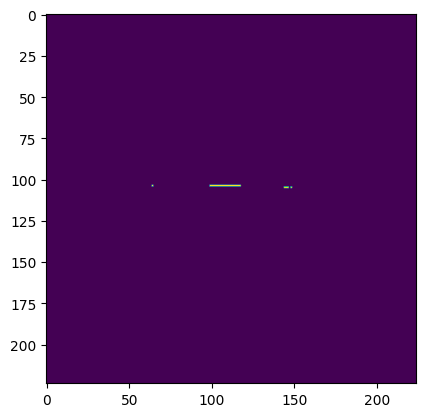

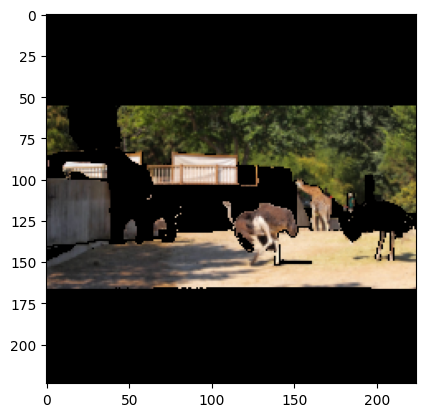

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16]
checking for  [14, 26, 40, 41, 100, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 89, 105, 106, 107, 96]
14 -46.895742416381836 8.980470895767212
26 7.836270332336426 49.72681999206543
40 -0.2888798713684082 1.786130666732788
41 6.9297194480896 3.48932147026062
highest until here with 41
100 9.35361385345459 25.320881605148315
59 -11.360347270965576 33.34154486656189
9 -571.5438365936279 49.85042214393616
25 -16.412925720214844 9.734803438186646
31 -22.604334354400635 -2.9343485832214355
36 53.48604619503021 87.34240680932999
51 -824.0224838256836 78.18683534860611
53 -34.33222770690918 53.452956676483154
71 7.460153102874756 2.1332740783691406
highest until here with 71
78 1.9098401069641113 9.2043936252594
104 -26.837468147277832 -10.110270977020264
118 -4.0670633316040

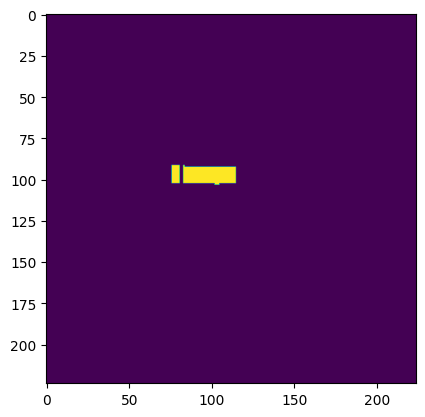

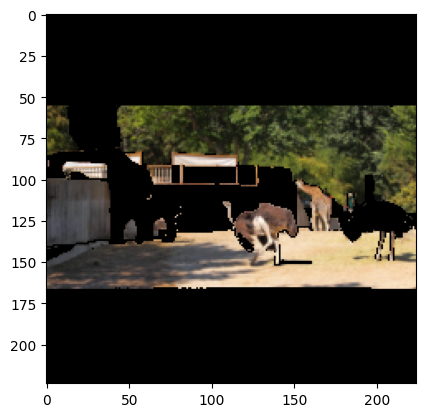

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96]
checking for  [14, 26, 40, 41, 100, 59, 9, 25, 31, 36, 51, 53, 71, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 89, 105, 106, 107, 48]
14 -23.317837715148926 16.003453731536865
26 16.77369475364685 55.953094363212585
40 6.901258230209351 2.960723638534546
highest until here with 40
41 4.429692029953003 1.1933982372283936
100 13.261091709136963 31.347978115081787
59 -54.6244740486145 19.84611749649048
9 -569.6031093597412 55.59934079647064
25 -66.93809032440186 3.7141501903533936
31 -14.461076259613037 5.242061614990234
36 41.09373688697815 87.2009888291359
51 -1098.0114936828613 59.33687388896942
53 -41.34089946746826 47.75246977806091
71 8.444130420684814 2.8897106647491455
highest until here with 71
78 -1.4350295066833496 10.071909427642822
104 -23.62576723098755 -9.594058990478516
118 9.2119276

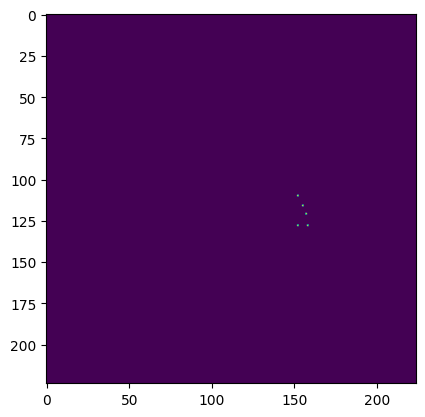

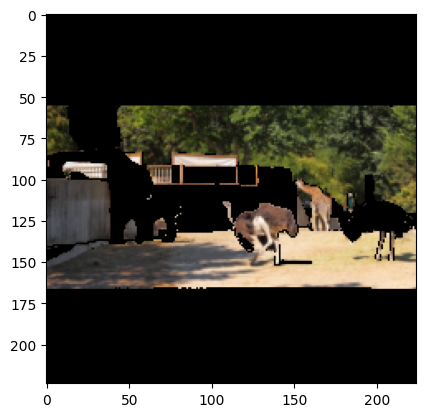

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71]
checking for  [14, 26, 40, 41, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 84, 85, 89, 105, 106, 107, 48]
14 -24.198389053344727 15.047454833984375
26 17.47146248817444 56.09288215637207
40 6.699967384338379 2.5992870330810547
highest until here with 40
41 4.359531402587891 1.1349499225616455
100 13.761931657791138 31.525087356567383
59 -55.83142042160034 19.295459985733032
9 -562.3062133789062 55.007633566856384
25 -65.51189422607422 3.554302453994751
31 -23.48620891571045 1.634228229522705
36 41.1422073841095 87.34756261110306
51 -1148.8271713256836 56.85839653015137
53 -41.38059616088867 46.66295647621155
78 -1.4973640441894531 9.92666482925415
104 -28.234052658081055 -12.550508975982666
118 9.098517894744873 5.913788080215454
119 4.990589618682861 1.067394018173217

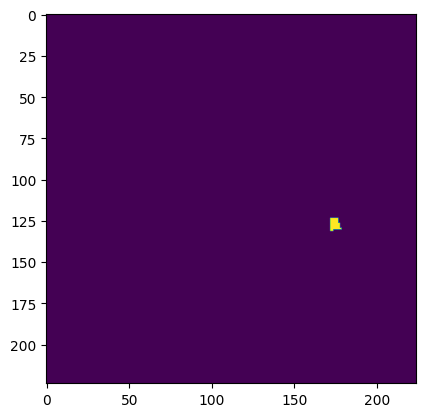

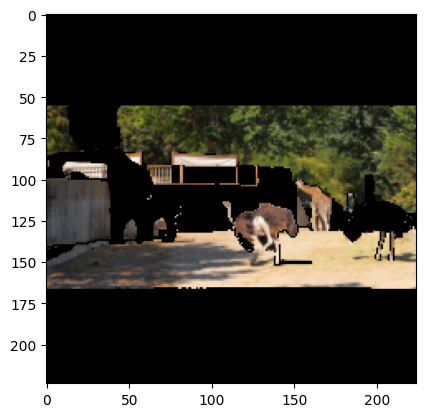

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84]
checking for  [14, 26, 40, 41, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 105, 106, 107, 48]
14 -24.571871757507324 15.135681629180908
26 17.916101217269897 56.41030967235565
40 6.65774941444397 2.6039421558380127
highest until here with 40
41 5.087566375732422 1.1137306690216064
100 14.809376001358032 31.556355953216553
59 -56.92615509033203 18.40963363647461
9 -550.136661529541 54.701727628707886
25 -68.42834949493408 0.30353665351867676
31 -20.339131355285645 3.750544786453247
36 32.639819383621216 87.57532387971878
51 -1247.695255279541 56.18039667606354
53 -49.629998207092285 45.377230644226074
78 -1.3013362884521484 9.861183166503906
104 -34.58753824234009 -14.599061012268066
118 8.72032642364502 5.721557140350342
119 4.887640476226807 0.397366285324

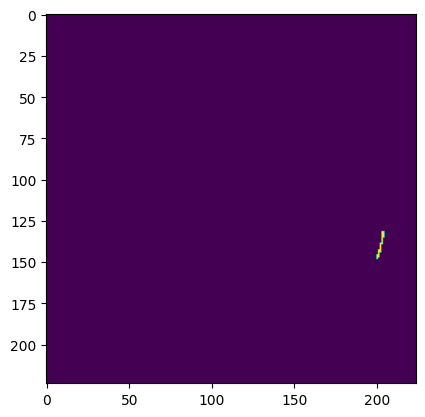

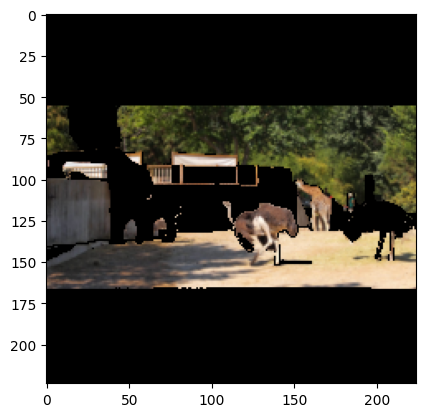

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107]
checking for  [14, 26, 40, 41, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 118, 119, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 105, 106, 48]
14 -25.45531988143921 15.224528312683105
26 18.249177932739258 56.48660957813263
40 5.881154537200928 2.285248041152954
highest until here with 40
41 4.906165599822998 1.6590356826782227
100 14.775067567825317 31.639283895492554
59 -58.270084857940674 17.504435777664185
9 -522.3599433898926 54.77392375469208
25 -70.37080526351929 -0.4638552665710449
31 -21.68750762939453 3.9347589015960693
36 35.98867654800415 87.95124590396881
51 -1191.7282104492188 56.00069761276245
53 -37.88849115371704 46.64638042449951
78 -2.1211981773376465 9.627693891525269
104 -37.59772777557373 -14.127087593078613
118 9.044301509857178 5.907392501831055
119 5.145007371902466 0.931531190872

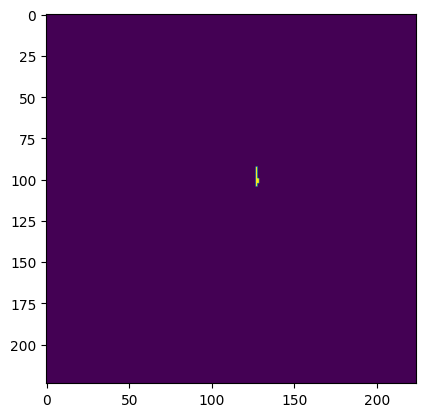

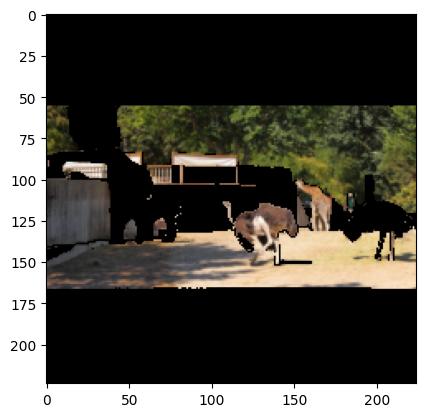

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119]
checking for  [14, 26, 40, 41, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 118, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 105, 106, 48]
14 -33.5543155670166 10.503876209259033
26 17.645442485809326 55.76138198375702
40 5.304819345474243 1.3708055019378662
highest until here with 40
41 4.716724157333374 1.8621265888214111
100 13.442540168762207 31.44679069519043
59 -30.56730031967163 25.30606985092163
9 -657.8182220458984 54.933881759643555
25 -60.979509353637695 0.564342737197876
31 -30.007731914520264 -0.5402326583862305
36 43.99683475494385 87.78953552246094
51 -1577.383041381836 55.86021840572357
53 -45.47349214553833 46.00028395652771
78 -1.6885757446289062 10.627567768096924
104 -44.86825466156006 -18.90268325805664
118 5.780476331710815 4.564565420150757
2 32.534629106521606 75.79172998666763

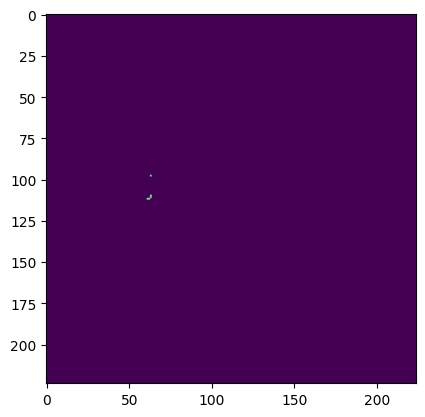

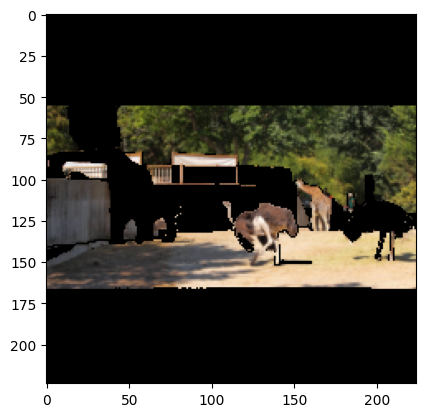

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40]
checking for  [14, 26, 41, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 118, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 105, 106, 48]
14 -37.64946460723877 9.478908777236938
26 10.589998960494995 54.20655608177185
41 4.680711030960083 -0.4061698913574219
highest until here with 41
100 10.804378986358643 27.71252989768982
59 -38.87462615966797 24.65643882751465
9 -651.8496513366699 54.37088906764984
25 -61.04228496551514 0.2053976058959961
31 -30.146753787994385 -0.36519765853881836
36 41.71869158744812 87.26295530796051
51 -1565.4788970947266 56.15812540054321
53 -28.467655181884766 51.130515336990356
78 -2.5301456451416016 9.719681739807129
104 -45.217037200927734 -19.126451015472412
118 4.673898220062256 1.9252657890319824
2 30.622023344039917 75.83560943603516
12 60.33327579498291 65.495020151

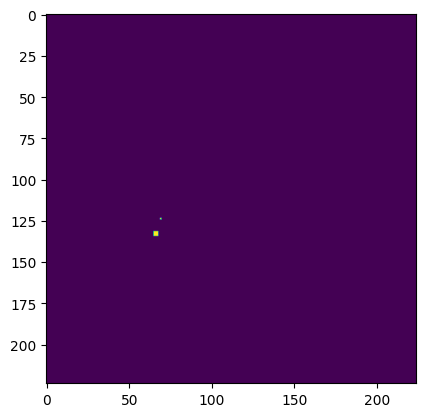

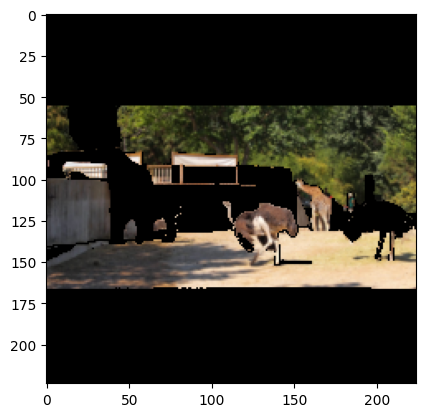

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40, 41]
checking for  [14, 26, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 118, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 105, 106, 48]
14 -39.65139389038086 5.237841606140137
26 13.330423831939697 58.75101387500763
100 16.39155149459839 40.107786655426025
59 -33.81401300430298 28.205424547195435
9 -686.8171215057373 52.591872215270996
25 -63.92785310745239 -1.6961097717285156
31 -30.318713188171387 -0.20363330841064453
36 38.71794939041138 88.07690888643265
51 -1515.005874633789 56.18579685688019
53 -27.091801166534424 51.549819111824036
78 -2.03474760055542 9.0126633644104
104 -45.71530818939209 -18.858158588409424
118 8.013182878494263 3.5266339778900146
highest until here with 118
2 35.081517696380615 77.0813524723053
12 65.56003987789154 67.42923259735107
21 -5.418491363525391 -2.7491807937622

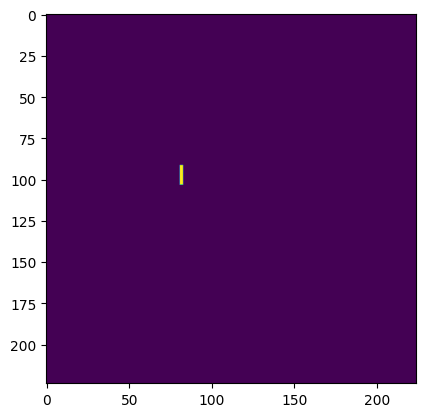

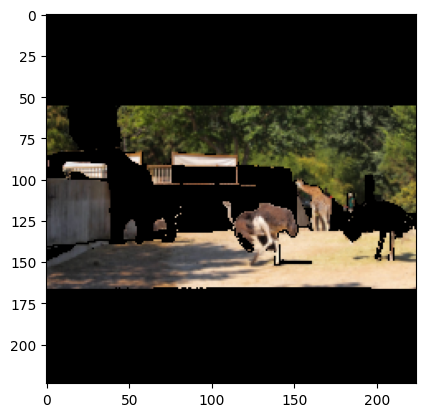

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40, 41, 118]
checking for  [14, 26, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 105, 106, 48]
14 -35.8278751373291 7.068789005279541
26 11.084330081939697 60.00397205352783
100 13.100481033325195 41.930413246154785
59 -36.535632610321045 25.69447159767151
9 -651.1393070220947 52.49159336090088
25 -76.51911973953247 -1.8273234367370605
31 -33.559632301330566 -1.1942744255065918
36 41.981905698776245 88.82052153348923
51 -1517.8339004516602 52.0867645740509
53 -11.315226554870605 57.87045359611511
78 -2.534651756286621 8.814924955368042
104 -46.70783281326294 -19.840729236602783
2 38.735127449035645 78.00486385822296
12 62.14559078216553 66.44227802753448
21 -7.2302937507629395 -2.0882248878479004
45 -22.762906551361084 15.203839540481567
54 12.29540109634399

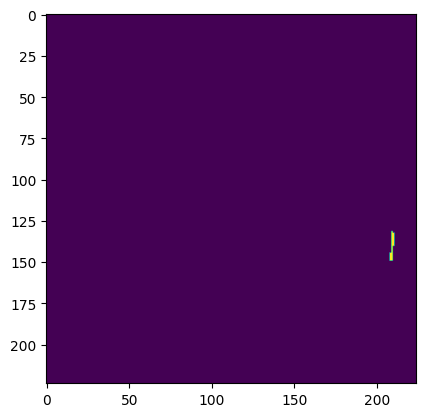

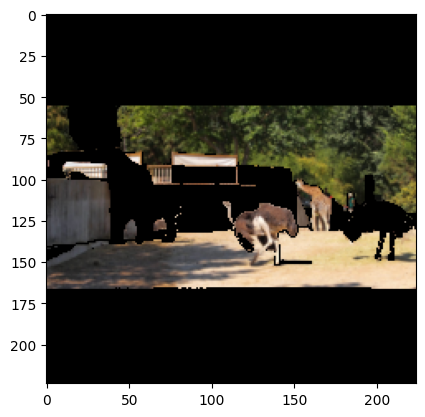

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40, 41, 118, 105]
checking for  [14, 26, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 30, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 106, 48]
14 -34.52638387680054 7.285124063491821
26 11.865878105163574 60.42635142803192
100 14.979124069213867 42.84026026725769
59 -36.90950870513916 26.33841037750244
9 -668.9004898071289 52.103191614151
25 -77.6892900466919 -2.6795268058776855
31 -30.675804615020752 -1.1930227279663086
36 37.85200119018555 88.39094713330269
51 -1484.2232704162598 52.89938747882843
53 -8.707332611083984 58.08458924293518
78 -2.7212023735046387 8.698326349258423
104 -48.862361907958984 -22.226715087890625
2 40.33304452896118 78.53932827711105
12 63.54111731052399 67.76642501354218
21 -7.3011040687561035 -2.360975742340088
45 -21.043992042541504 15.893715620040894
54 14.295148849487305 40.

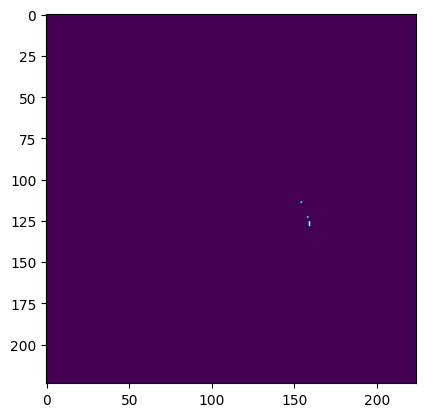

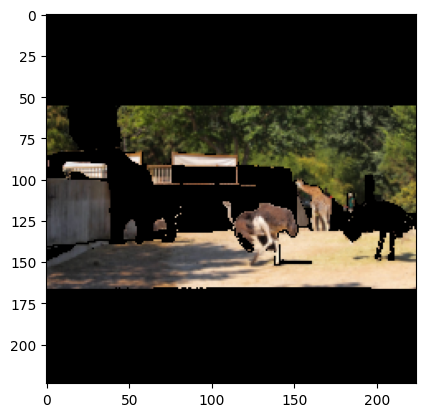

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40, 41, 118, 105, 30]
checking for  [14, 26, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 38, 39, 43, 44, 52, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 106, 48]
14 -35.82744598388672 7.1470558643341064
26 11.380624771118164 60.33282279968262
100 14.17505145072937 42.6988422870636
59 -33.15993547439575 27.405226230621338
9 -633.3977699279785 53.172361850738525
25 -78.64905595779419 -3.1754612922668457
31 -29.380643367767334 0.24796128273010254
36 38.3623480796814 88.93988579511642
51 -1498.367691040039 52.08115577697754
53 -7.170617580413818 56.61756694316864
78 -3.0313730239868164 8.716225624084473
104 -51.412391662597656 -19.28226947784424
2 40.01282453536987 78.45848947763443
12 66.05863869190216 69.17721629142761
21 -7.185697555541992 -2.374100685119629
45 -21.200954914093018 16.077297925949097
54 14.144068956375122 39.

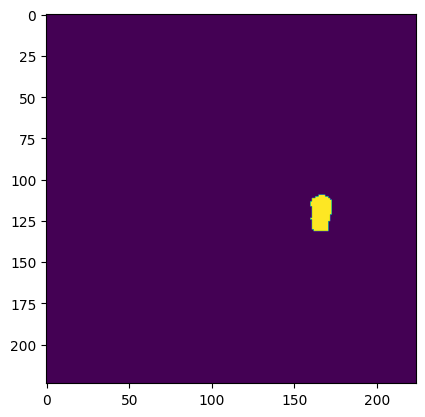

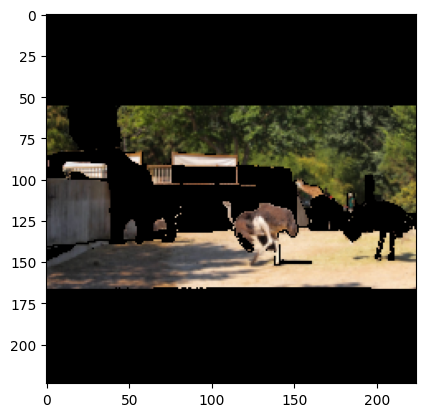

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40, 41, 118, 105, 30, 52]
checking for  [14, 26, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 2, 12, 21, 45, 54, 66, 94, 3, 4, 6, 20, 38, 39, 43, 44, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 106, 48]
14 -32.44410753250122 5.003732442855835
26 19.66409683227539 64.59040641784668
100 19.95687484741211 44.872355461120605
59 -41.525864601135254 29.338932037353516
9 -446.5108871459961 61.17592453956604
25 -74.01816844940186 -8.263969421386719
31 -117.71891117095947 -20.670020580291748
36 44.264739751815796 91.55643656849861
51 -1461.5509986877441 41.244035959243774
53 35.94938516616821 66.54040217399597
78 -2.627575397491455 7.507765293121338
104 -41.3477897644043 -9.094297885894775
2 39.00521993637085 77.47078686952591
12 46.54418230056763 58.242520689964294
21 -4.9323201179504395 -0.7763385772705078
45 -22.357988357543945 12.949919700622559
54 17.065274715423584 4

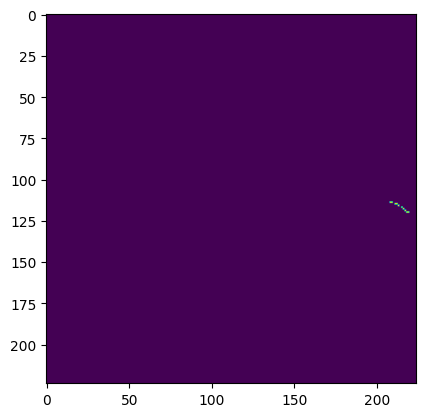

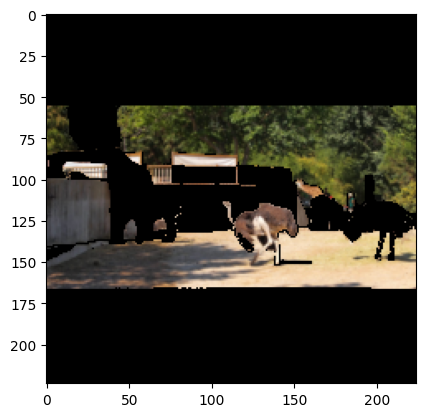

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40, 41, 118, 105, 30, 52, 6]
checking for  [14, 26, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 2, 12, 21, 45, 54, 66, 94, 3, 4, 20, 38, 39, 43, 44, 65, 69, 72, 73, 74, 77, 79, 80, 81, 85, 89, 106, 48]
14 -32.2870135307312 5.021160840988159
26 19.869637489318848 64.66284692287445
100 20.348089933395386 44.96421217918396
59 -39.727723598480225 29.804378747940063
9 -442.9666996002197 60.92632710933685
25 -73.53485822677612 -8.222317695617676
31 -116.26005172729492 -19.927775859832764
36 42.41240620613098 91.44491329789162
51 -1483.1769943237305 40.30774235725403
53 35.018450021743774 66.01670682430267
78 -2.525317668914795 7.476305961608887
104 -40.89559316635132 -9.195530414581299
2 39.469975233078 77.58337706327438
12 44.01081204414368 56.63457214832306
21 -5.191481113433838 -0.9302735328674316
45 -22.156929969787598 13.093620538711548
54 17.035120725631714 42.22

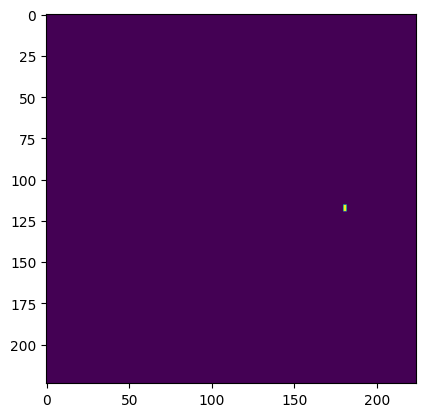

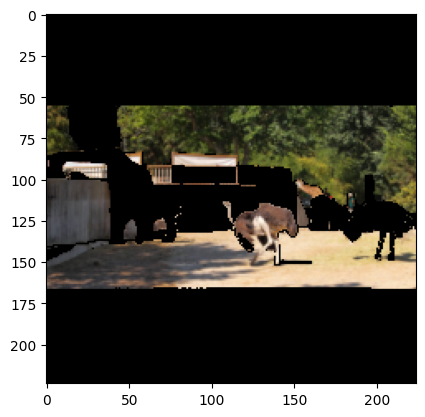

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40, 41, 118, 105, 30, 52, 6, 85]
checking for  [14, 26, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 2, 12, 21, 45, 54, 66, 94, 3, 4, 20, 38, 39, 43, 44, 65, 69, 72, 73, 74, 77, 79, 80, 81, 89, 106, 48]
14 -32.57817029953003 5.203211307525635
26 18.17079186439514 63.968825340270996
100 19.429266452789307 44.33487057685852
59 -40.38451910018921 29.372864961624146
9 -458.60304832458496 59.62769687175751
25 -73.1096863746643 -7.9288482666015625
31 -118.75529289245605 -20.39729356765747
36 40.52525758743286 91.40617996454239
51 -1487.2994422912598 40.70180654525757
53 34.74465012550354 66.63842499256134
78 -2.8888583183288574 7.334005832672119
104 -40.879642963409424 -8.495879173278809
2 38.83954882621765 77.29711532592773
12 43.582504987716675 56.273236870765686
21 -5.56485652923584 -0.9018301963806152
45 -22.840523719787598 12.903839349746704
54 16.30381941795349 42

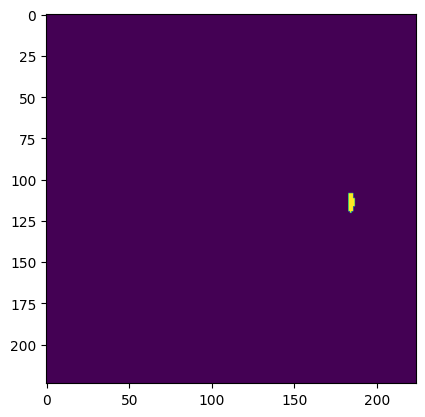

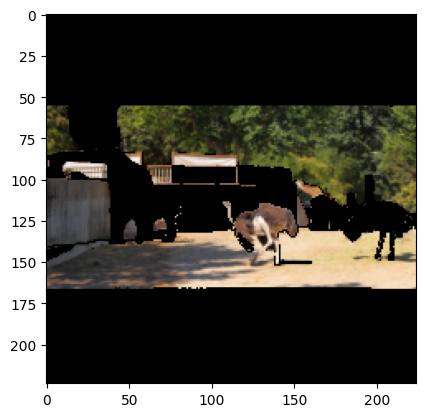

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40, 41, 118, 105, 30, 52, 6, 85, 38]
checking for  [14, 26, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 2, 12, 21, 45, 54, 66, 94, 3, 4, 20, 39, 43, 44, 65, 69, 72, 73, 74, 77, 79, 80, 81, 89, 106, 48]
14 -31.143367290496826 6.949704885482788
26 21.976757049560547 66.1906749010086
100 22.52632975578308 47.34821915626526
59 -36.280274391174316 35.36824584007263
9 -420.6878662109375 61.17030084133148
25 -69.8684573173523 -5.8910369873046875
31 -121.6130256652832 -27.756404876708984
36 37.48463988304138 90.18881320953369
51 -1769.776725769043 32.17242360115051
53 22.928577661514282 59.37211215496063
78 -2.120363712310791 7.162511348724365
104 -39.52819108963013 -10.233569145202637
2 43.54815483093262 79.89254742860794
12 52.964845299720764 64.75208401679993
21 -6.096541881561279 -1.919245719909668
45 -21.199917793273926 15.629333257675171
54 10.352611541748047 40.69

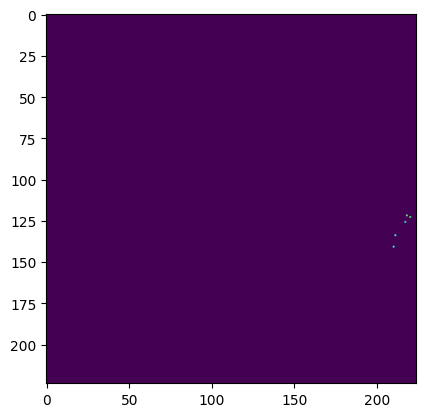

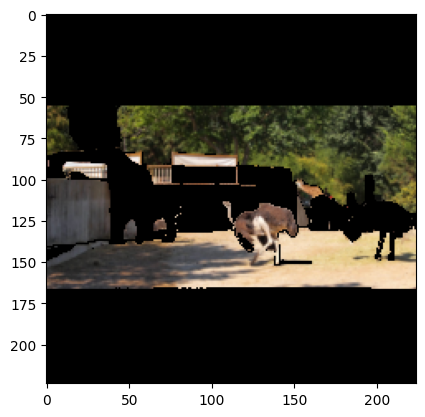

checking the adjacency list of  [5, 91, 87, 58, 19, 0, 92, 111, 99, 13, 95, 97, 47, 117, 110, 67, 86, 16, 96, 71, 84, 107, 119, 40, 41, 118, 105, 30, 52, 6, 85, 38, 20]
checking for  [14, 26, 100, 59, 9, 25, 31, 36, 51, 53, 78, 104, 2, 12, 21, 45, 54, 66, 94, 3, 4, 39, 43, 44, 65, 69, 72, 73, 74, 77, 79, 80, 81, 89, 106, 48]
14 -31.61766529083252 6.627887487411499
26 21.643155813217163 66.19552373886108
100 22.041964530944824 47.38625884056091
59 -38.20608854293823 34.42542552947998
9 -431.5244197845459 60.630303621292114
25 -69.72908973693848 -5.62206506729126
31 -123.33362102508545 -26.773560047149658
36 39.38897252082825 90.39370939135551
51 -1771.6211318969727 31.97314143180847
53 19.017434120178223 56.800323724746704
78 -1.7564177513122559 7.4790894985198975
104 -39.86084461212158 -10.622453689575195
2 43.14684867858887 79.82457727193832
12 51.91792845726013 64.39477503299713
21 -6.347692012786865 -1.9158482551574707
45 -21.660757064819336 15.783500671386719
54 8.58648419380188 40

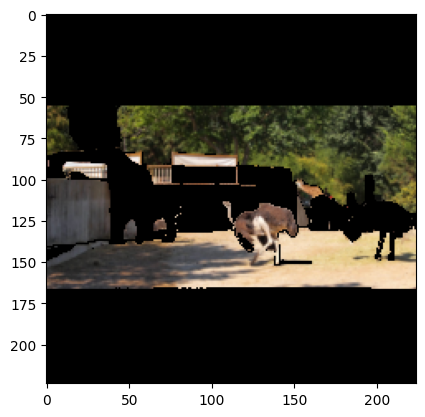

2 43.14684867858887 79.82457727193832
3 -1.7971515655517578 2.3031771183013916
4 -2.8907179832458496 0.6736278533935547
9 -431.5244197845459 60.630303621292114
12 51.91792845726013 64.39477503299713
14 -31.61766529083252 6.627887487411499
21 -6.347692012786865 -1.9158482551574707
25 -69.72908973693848 -5.62206506729126
26 21.643155813217163 66.19552373886108
31 -123.33362102508545 -26.773560047149658
36 39.38897252082825 90.39370939135551
39 -39.22830820083618 -12.759113311767578
43 1.390516757965088 16.253411769866943
44 -15.765702724456787 -3.6790013313293457
45 -21.660757064819336 15.783500671386719
48 -15.459287166595459 -7.738494873046875
51 -1771.6211318969727 31.97314143180847
53 19.017434120178223 56.800323724746704
54 8.58648419380188 40.194547176361084
59 -38.20608854293823 34.42542552947998
65 -30.074727535247803 -0.39975643157958984
66 6.634247303009033 21.861928701400757
69 -69.91133689880371 24.840939044952393
72 -1.7796993255615234 -0.5456686019897461
73 -0.5472898483276

In [450]:
final_segs_forlabel=[]
segments_for_label=[]
im_prev=copy.deepcopy(im)
image_prev=copy.deepcopy(image)
predictions_prev=copy.deepcopy(predictions)
segs_to_check=copy.deepcopy(list_of_all_segs)
# segs_to_check=copy.deepcopy(sorted(type1_comb_list))


prediction1=top10list[1]
prediction2=top10list[0]

while(True):
    print('checking from first')
    for i in segments_for_label:
        final_segs_forlabel.append(i)
    print('new final set of segments ',final_segs_forlabel)
    
    for seg in segments_for_label:
        segs_to_check.remove(seg)

    print('new set of segments checking ',segs_to_check)
    print('calculating adjacency list')
    
    adjacency_list=calc_adjacency_list(segs_to_check,new_segs)
    
    
    if final_segs_forlabel!=[]:
        im_prev=copy.deepcopy(new_im_highest_dip)
        image_prev=copy.deepcopy(new_im1_highest_dip)

    print('new image')
    plt.imshow(image_prev)
    plt.show()
    
    segments_for_label=[]
    adj_segments_for_label=[]
    max_dip=0
    Found=False
    max_dis=0
    #############################function with segs_to_check,model_using,im,image,predictions
    for i in segs_to_check:
    
        mask_intersection=get_mask([i],new_segs)
        masking_type='normal/'
        new_im=mask_on_image(im_prev , mask_intersection, masking_type)
        new_im1=mask_on_image(image_prev , mask_intersection, masking_type)
        (predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
        # label1_dip_perc=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy()))/np.sum(new_segs[i]))*100
        # label2_dip_perc=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy()))/np.sum(new_segs[i]))*100

        label1_dip_perc=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy())))*100
        label2_dip_perc=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy())))*100
    
        
        print(i,label1_dip_perc,label2_dip_perc)
        if label1_dip_perc > label2_dip_perc and  max_dis < label1_dip_perc-label2_dip_perc:
        # if label1_dip_perc > label2_dip_perc and max_dip < label1_dip_perc and max_dis < label1_dip_perc-label2_dip_perc:
        # if label1_dip_perc > label2_dip_perc and max_dip < label1_dip_perc :
    
            max_dis=label1_dip_perc-label2_dip_perc
            max_dip = label1_dip_perc
            max_dip_at = i
            predictions_highest_dip=predictions_temp
            new_im_highest_dip=new_im
            new_im1_highest_dip=new_im1
            Found=True
    
    if max_dip==0:
        break
    predictions_prev=copy.deepcopy(predictions_highest_dip)
    im_prev=copy.deepcopy(new_im_highest_dip)
    image_prev=copy.deepcopy(new_im1_highest_dip)
    if Found==True:
        print('maximum dip at ',max_dip_at)
        plt.imshow(new_segs[max_dip_at])
        plt.show()
        plt.imshow(new_im1_highest_dip)
        plt.show()
    
    
    ####################close function ,return i as max_dip_at
    
    while Found == True:
        
        max_dip=0
        max_dis=0
        Found=False
        
        segments_for_label.append(max_dip_at)
        for k in segments_for_label:
            for kk in adjacency_list[k]:
                if kk not in adj_segments_for_label and kk not in segments_for_label:
                    adj_segments_for_label.append(kk)
            # adj_segments_for_label
            # print(adjacency_list[k])
            # print(adj_segments_for_label)
        if max_dip_at in adj_segments_for_label:
            adj_segments_for_label.remove(max_dip_at)
            
        print('checking the adjacency list of ',segments_for_label)
        print('checking for ',adj_segments_for_label)
        
        for p in adj_segments_for_label:
            # print('checking for ',p)
            mask_intersection=get_mask(segments_for_label,new_segs)
            masking_type='normal/'
            new_im=mask_on_image(im_prev , mask_intersection, masking_type)
            new_im1=mask_on_image(image_prev , mask_intersection, masking_type)
            (predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
            # label1_dip_perc_a=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy()))/np.sum(new_segs[p]))*100
            # label2_dip_perc_a=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy()))/np.sum(new_segs[p]))*100

            label1_dip_perc_a=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy())))*100
            label2_dip_perc_a=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy())))*100
    
    
            mask_intersection=get_mask([p],new_segs)
            masking_type='normal/'
            new_im=mask_on_image(im_prev , mask_intersection, masking_type)
            new_im1=mask_on_image(image_prev , mask_intersection, masking_type)
            (predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
            # label1_dip_perc_b=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy()))/np.sum(new_segs[p]))*100
            # label2_dip_perc_b=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy()))/np.sum(new_segs[p]))*100

            label1_dip_perc_b=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy())))*100
            label2_dip_perc_b=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy())))*100

            mask_intersection=get_mask([p]+segments_for_label,new_segs)
            masking_type='normal/'
            new_im=mask_on_image(im_prev , mask_intersection, masking_type)
            new_im1=mask_on_image(image_prev , mask_intersection, masking_type)
            (predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
            # label1_dip_perc=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy()))/np.sum(new_segs[p]))*100
            # label2_dip_perc=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy()))/np.sum(new_segs[p]))*100

            label1_dip_perc=((1-(predictions_temp[0][prediction1].numpy()/predictions_prev[0][prediction1].numpy())))*100
            label2_dip_perc=((1-(predictions_temp[0][prediction2].numpy()/predictions_prev[0][prediction2].numpy())))*100
    
            print(p,label1_dip_perc,label2_dip_perc)
            if label1_dip_perc > label2_dip_perc and  max_dis < label1_dip_perc-label2_dip_perc:
            # if label1_dip_perc > label2_dip_perc and max_dip < label1_dip_perc:#  and label1_dip_perc_b > label2_dip_perc_b:#and label1_dip_perc>label1_dip_perc_a+label1_dip_perc_b
                print('highest until here with', p)
                Found=True
                max_dis=label1_dip_perc-label2_dip_perc
                max_dip = label1_dip_perc
                max_dip_at = p
                predictions_highest_dip=predictions_temp
                new_im_highest_dip=new_im
                new_im1_highest_dip=new_im1
        
        predictions_prev=copy.deepcopy(predictions_highest_dip)
        # print([max_dip_at]+segments_for_label)
        if Found==True:
            print('maximum dip at ',max_dip_at)
            plt.imshow(new_segs[max_dip_at])
            plt.show()
            plt.imshow(new_im1_highest_dip)
            plt.show()
        # im_prev=copy.deepcopy(new_im_highest_dip)
        # image_prev=copy.deepcopy(new_im1_highest_dip)
    
        
     



In [451]:
B=final_segs_forlabel

In [452]:

# A=[40, 58, 14, 78, 53, 119, 16, 73, 72, 4, 44, 41, 67, 43, 96, 95, 20, 107, 86, 85, 45, 65, 104, 80, 81, 9, 76, 79, 6, 105, 89, 54, 39]
# B=[6, 0, 30, 14, 71, 74, 85, 52, 39, 38, 79, 31, 91, 41, 100, 21, 16, 66, 105, 106, 92, 43, 118, 67, 89, 120, 76, 119, 104]

int=[i for i in A if i in B]
onlyA=[i for i in A if i not in B]
onlyB=[i for i in B if i not in A]

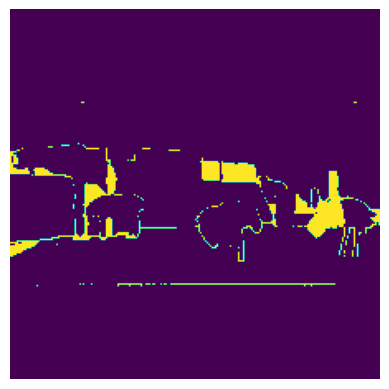

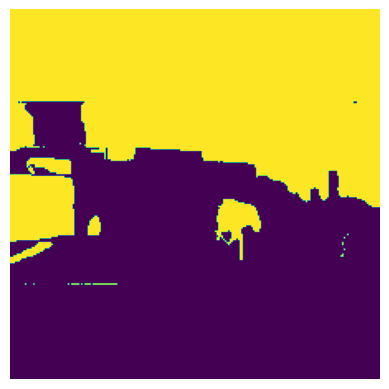

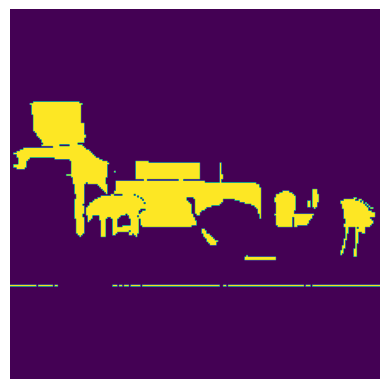

In [453]:
plt.imshow(get_mask(int,new_segs))
plt.axis('off')
plt.savefig('verification_intersection_mask.svg',format='svg')
plt.show()

plt.imshow(get_mask(onlyA,new_segs))
plt.axis('off')
plt.savefig('verification_S1mask.svg',format='svg')
plt.show()

plt.imshow(get_mask(onlyB,new_segs))
plt.axis('off')
plt.savefig('verification_S2mask.svg',format='svg')

plt.show()


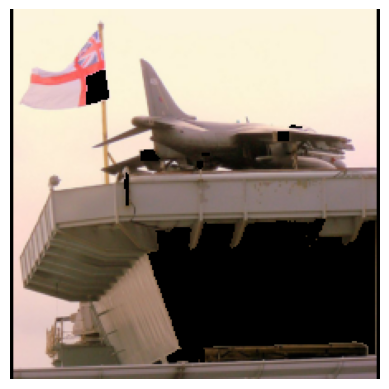

94.17194947600365 -97.56990671157837
0.025909375 0.49536845


In [35]:
prediction1=top10list[0]
prediction2=top10list[1]
X=get_mask(onlyA,new_segs)
masking_type='normal/'
new_im=mask_on_image(im , X, masking_type)
new_im1=mask_on_image(image , X, masking_type)
(predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
label1_dip_perc=(1-(predictions_temp[0][prediction1].numpy()/predictions[0][prediction1].numpy()))*100
label2_dip_perc=(1-(predictions_temp[0][prediction2].numpy()/predictions[0][prediction2].numpy()))*100
plt.imshow(new_im1)
plt.axis('off')
plt.savefig('verification_S1redacted.svg',format='svg')
plt.show()
print(label1_dip_perc,label2_dip_perc)
print(predictions_temp[0][prediction1].numpy(),predictions_temp[0][prediction2].numpy())

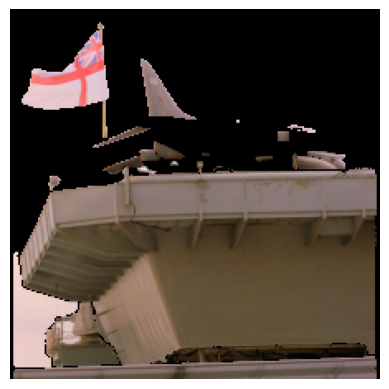

-75.41873455047607 98.98621998727322
0.7798474 0.002541858


In [34]:
prediction1=top10list[0]
prediction2=top10list[1]
X=get_mask(onlyB,new_segs)
masking_type='normal/'
new_im=mask_on_image(im , X, masking_type)
new_im1=mask_on_image(image , X, masking_type)
(predictions_temp,decoded_predictions_temp,top10list_temp,top1000list_temp,id_to_name_temp)=predict_img(model_using,new_im,print_data=False)
label1_dip_perc=(1-(predictions_temp[0][prediction1].numpy()/predictions[0][prediction1].numpy()))*100
label2_dip_perc=(1-(predictions_temp[0][prediction2].numpy()/predictions[0][prediction2].numpy()))*100
plt.imshow(new_im1)
plt.axis('off')
plt.savefig('verification_S2redacted.svg',format='svg')
plt.show()
print(label1_dip_perc,label2_dip_perc)
print(predictions_temp[0][prediction1].numpy(),predictions_temp[0][prediction2].numpy())

In [ ]:
plt.imshow(pixelwise_attributions)
plt.show()
for i in new_segs:
    plt.imshow(i)
plt.show()
plt.imshow(segmentwise_attributions)
plt.show()

# x=get_mask(list_of_masks[:10],new_segs)
# redacted_image=mask_on_image(image , x, 'normal/')

In [72]:
#disjoint
# abcd,cnt=check_for_type_1_and_2_using_rankings_new(segs,pixelwise_attributions,segmentwise_attributions,prediction_dictionary,model_using,im,image,topk,top10list,70,new_segs,list_of_masks,checkonly=None)

# abcd,cnt=check_for_type_1_and_2_using_rankings_new(segs,pixelwise_attributions,segmentwise_attributions,prediction_dictionary,model_wth_pre_soft_max_using,im,image,topk,top10list,60,new_segs,list_of_masks,checkonly=None)


In [ ]:
#disjoint check all graphs 
combs=[i for i in range(5)]
for (x1,x2) in list(combinations(combs, 2)):
    prediction1=top10list[x1]
    prediction2=top10list[x2]
    first_redaction=prediction_dictionary[f'{prediction1} vs {prediction2}'][prediction1][1]
    second_redaction=prediction_dictionary[f'{prediction1} vs {prediction2}'][prediction2][1]

    first_redaction_all=prediction_dictionary[f'{prediction1} vs {prediction2}'][prediction1]
    second_redaction_all=prediction_dictionary[f'{prediction1} vs {prediction2}'][prediction2]

    ROWS=1
    COLS=2
    UPSCALE_FACTOR = 10
    fig, axs = plt.subplots(ROWS, COLS, figsize=(ROWS * UPSCALE_FACTOR, COLS * (UPSCALE_FACTOR-8)))
    axs.flat[0].plot(range(len(first_redaction_all[0][prediction1])),first_redaction_all[0][prediction1],label=id_to_name[prediction1])
    axs.flat[0].plot(range(len(first_redaction_all[0][prediction2])),first_redaction_all[0][prediction2],label=id_to_name[prediction2])
    axs.flat[0].legend()
    axs.flat[0].set_title('probabilities vs no. of redacted segments')
    axs.flat[0].set_ylabel('probabilities')
    axs.flat[0].set_xlabel('no. of redacted segments')
    # axs.flat[0].axvline(x=redaction1_percentile, color='r', linestyle=':',label=str(redaction1_percentile))
    axs.flat[0].axvline(x=first_redaction_all[3], color='b', linestyle=':',label=str(first_redaction_all[3]))
    axs.flat[1].plot(range(len(first_redaction[prediction1])),first_redaction[prediction1],label=id_to_name[prediction1])
    axs.flat[1].plot(range(len(first_redaction[prediction2])),first_redaction[prediction2],label=id_to_name[prediction2])
    axs.flat[1].legend()
    axs.flat[1].set_title('percentages vs no. of redacted segments')
    axs.flat[1].set_ylabel('percentages')
    axs.flat[1].set_xlabel('no. of redacted segments')
    # axs.flat[1].axvline(x=redaction1_percentile, color='r', linestyle=':',label=str(redaction1_percentile))
    axs.flat[1].axvline(x=first_redaction_all[3], color='b', linestyle=':',label=str(first_redaction_all[3]))
    plt.show()
    
    ROWS=1
    COLS=2
    UPSCALE_FACTOR = 10
    fig, axs = plt.subplots(ROWS, COLS, figsize=(ROWS * UPSCALE_FACTOR, COLS * (UPSCALE_FACTOR-8)))
    axs.flat[0].plot(range(len(second_redaction_all[0][prediction1])),second_redaction_all[0][prediction1],label=id_to_name[prediction1])
    axs.flat[0].plot(range(len(second_redaction_all[0][prediction2])),second_redaction_all[0][prediction2],label=id_to_name[prediction2])
    axs.flat[0].legend()
    axs.flat[0].set_title('probabilities vs no. of redacted segments')
    axs.flat[0].set_ylabel('probabilities')
    axs.flat[0].set_xlabel('no. of redacted segments')
    # axs.flat[0].axvline(x=redaction2_percentile, color='r', linestyle=':',label=str(redaction2_percentile))
    axs.flat[0].axvline(x=second_redaction_all[3], color='b', linestyle=':',label=str(second_redaction_all[3]))
    axs.flat[1].plot(range(len(second_redaction[prediction1])),second_redaction[prediction1],label=id_to_name[prediction1])
    axs.flat[1].plot(range(len(second_redaction[prediction2])),second_redaction[prediction2],label=id_to_name[prediction2])
    axs.flat[1].legend()
    axs.flat[1].set_title('percentages vs no. of redacted segments')
    axs.flat[1].set_ylabel('percentages')
    axs.flat[1].set_xlabel('no. of redacted segments')
    # axs.flat[1].axvline(x=redaction2_percentile, color='r', linestyle=':',label=str(redaction2_percentile))
    axs.flat[1].axvline(x=second_redaction_all[3], color='b', linestyle=':',label=str(second_redaction_all[3]))
    plt.show()

In [ ]:
intersect_list=abcd[2]+abcd[3]
print(intersect_list)
print(abcd)

In [29]:
temp_mask=get_mask(intersect_list,new_segs)
masking_type='normal/'
new_im=mask_on_image(im , temp_mask, masking_type)
new_im1=mask_on_image(image , temp_mask, masking_type)
prediction1=top10list[0]
prediction2=top10list[1]
(predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_using,new_im,print_data=False)
new_prediction1_temp=predictions3[0][prediction1].numpy()
new_prediction2_temp=predictions3[0][prediction2].numpy()
(predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_wth_pre_soft_max_using,new_im,print_data=False)
new_prediction1_pre_temp=predictions3[0][prediction1].numpy()
new_prediction2_pre_temp=predictions3[0][prediction2].numpy()


print(new_prediction1_temp,new_prediction2_temp,new_prediction1_pre_temp,new_prediction2_pre_temp)

0.053862043 0.00023822616 7.1675105 1.7465494


In [30]:
numbered_masks = {ind: mask for ind, mask in enumerate(new_segs)}


In [ ]:
redacted_mask_intersection=get_mask(intersect_list,new_segs)
# plt.imshow(redacted_mask_intersection)
numbered_masks = {ind: mask for ind, mask in enumerate(new_segs)}
x=[]
y=[]
xx=[]
yy=[]

z1=[]
z2=[]
z3=[]
z4=[]
x.append(new_prediction1_temp)
y.append(new_prediction2_temp)
xx.append(new_prediction1_pre_temp)
yy.append(new_prediction2_pre_temp)
for i in intersect_list:
    temp=intersect_list[:]
    temp.remove(i)
    temp_mask=get_mask(temp,new_segs)
    # plt.imshow(temp_mask)
    # plt.show()
    plt.imshow(numbered_masks[i])
    plt.show()
    masking_type='normal/'
    new_im=mask_on_image(im , temp_mask, masking_type)
    new_im1=mask_on_image(image , temp_mask, masking_type)
    prediction1=top10list[0]
    prediction2=top10list[1]
    (predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_using,new_im,print_data=False)
    new_prediction1=predictions3[0][prediction1].numpy()
    new_prediction2=predictions3[0][prediction2].numpy()
    (predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_wth_pre_soft_max_using,new_im,print_data=False)
    new_prediction1_pre=predictions3[0][prediction1].numpy()
    new_prediction2_pre=predictions3[0][prediction2].numpy()
    print(i,new_prediction1,new_prediction2,new_prediction1_pre,new_prediction2_pre)
    print('**',new_prediction1_temp,new_prediction2_temp,new_prediction1_pre_temp,new_prediction2_pre_temp)
    print(i,(new_prediction1_temp/new_prediction1)*100,(new_prediction2_temp/new_prediction2)*100,(new_prediction1_pre_temp/new_prediction1_pre)*100,(new_prediction2_pre_temp/new_prediction2_pre)*100)
    x.append(new_prediction1)
    y.append(new_prediction2)
    xx.append(new_prediction1_pre)
    yy.append(new_prediction2_pre)
    z1.append((new_prediction1_temp/new_prediction1)*100)
    z2.append((new_prediction2_temp/new_prediction2)*100)
    z3.append((new_prediction1_pre_temp/new_prediction1_pre)*100)
    z4.append((new_prediction2_pre_temp/new_prediction2_pre)*100)
    

In [33]:
# import numpy as np
# import matplotlib.pyplot as plt
# # from mpl_toolkits.mplot3d import Axes3D

# # Example: Assuming 'data' is your 224x224 array
# data = pixelwise_attributions[159]  # Replace with your actual data
# data2 = pixelwise_attributions[211]
# # Create meshgrid for the x and y axes
# x = np.arange(data.shape[1])
# y = np.arange(data.shape[0])
# x, y = np.meshgrid(x, y)

# # Plotting
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# # Plot the surface
# ax.plot_surface(x, y, data, cmap='viridis')


# # Label axes
# # ax.set_xlabel('X axis')
# # ax.set_ylabel('Y axis')
# # ax.set_zlabel('Z axis')

# plt.show()


In [63]:
# np.array(segs).shape
# np.array(new_segs).shape
np.array(new_segs).shape
# pixelwise_attributions[159].shape
# segmentwise_attributions[159]
print(len(list_of_masks[159]))

60


In [219]:

# (predictions,decoded_predictions,top10list,top1000list,id_to_name)=predict_img(model_wth_pre_soft_max,im,print_data=True)


# predictions.shape
# predictions_new=scipy.special.softmax(predictions)
# predictions_new.shape
# decoded_predictions = tf.keras.applications.vgg16.decode_predictions(np.array(predictions_new), top=1000)[0]  # Top 5 predictions

# for i, (imagenet_id, label, score) in enumerate(decoded_predictions):
#     if i>=20:
#         break
#     print(f"{i + 1}:{imagenet_id} {label} ({score:.10f})")

In [62]:
np.array(new_segs).shape


(89, 224, 224)

In [98]:

all_redaction_values = load_predictions_by_redactions(model_using,segmentwise_attributions,image,im,topk,top10list,pth,list_of_masks,new_segs,predictions,redo=True,dont_save=False)




loading predictions while redating 159
loading predictions while redating 208
loading predictions while redating 243
loading predictions while redating 168
loading predictions while redating 163


In [101]:
all_redaction_values[0]

{159: {159: [0.62755543,
   0.6068694,
   0.6057309,
   0.5064185,
   0.3828374,
   0.38060927,
   0.37515056,
   0.12620237,
   0.11769768,
   0.0008884784,
   0.00089115556,
   0.00091629487,
   0.00092413207,
   0.0008024798,
   0.00095142017,
   0.00094074936,
   2.4932075e-05,
   4.4934237e-05,
   8.933914e-06,
   1.0168652e-05,
   1.0955579e-05,
   2.6007056e-05,
   2.7060993e-05,
   2.7748343e-05,
   3.0815667e-05,
   3.59402e-05,
   3.543399e-05,
   3.3944914e-05,
   2.4556737e-05,
   2.0249712e-05,
   2.130739e-05,
   1.3180654e-05,
   1.4575126e-05,
   1.4854112e-05,
   2.7840228e-05,
   3.779291e-05,
   4.3683758e-05,
   6.6621484e-05,
   9.025586e-05,
   0.00010250463,
   8.9204485e-05,
   0.000100659025,
   0.00025575623,
   0.00028039905,
   0.0003180797,
   0.00031461325,
   0.00029776365],
  208: [0.15960893,
   0.17316703,
   0.17237006,
   0.19040802,
   0.25845468,
   0.27563897,
   0.2824562,
   0.12104941,
   0.13936429,
   0.013592261,
   0.012914671,
   0.0126719

In [408]:



def check_for_type_2_using_rankings_exp2(segs,pixelwise_attributions,segmentwise_attributions,final_prediction_dictionary,final_prediction_dictionary_with_percentages,final_redacted_images,model_in_use,model_in_use2,im,image,topk,top10list,delta_for_type1,checkonly=None,check_both_pred=True):
    combs=[i for i in range(topk)]
    cnt=0
    for (x1,x2) in list(combinations(combs, 2)):
        prediction1=top10list[x1]
        prediction2=top10list[x2]
        first_redaction=final_prediction_dictionary_with_percentages[prediction1]
        second_redaction=final_prediction_dictionary_with_percentages[prediction2]
        print(x1,x2)
        print(id_to_name[prediction1],id_to_name[prediction2])
        print(prediction1,prediction2)
        type1_flag=None
        type2_flag=None

        
        
        

        if (checkonly=='type2' or checkonly==None) and type1_flag!=True:
            #checking for type2
            print('checking for type2')
            # print(first_redaction[prediction1])
            # print(first_redaction[prediction2])
            for i in range(len(first_redaction[prediction1])):
                flag1=None
                # print(i,first_redaction[prediction1][i],first_redaction[prediction2][i])
                if check_both_pred==True:
                    condition1= first_redaction[prediction1][i] <= 20 and first_redaction[prediction2][i] <= 20
                else:
                    condition1= first_redaction[prediction1][i] <= 20
                
                if condition1:
                    flag1=True
                    redaction1_percentile=i
                    break
        
            for i in range(len(first_redaction[prediction1])):
                flag2=None
                if check_both_pred==True:
                    condition2=second_redaction[prediction2][i] <= 20 and second_redaction[prediction1][i] <= 20
                else:
                    condition2=second_redaction[prediction2][i] <= 20
                # print(i,second_redaction[prediction2][i],second_redaction[prediction1][i])
        
                if condition2:
                    flag2=True
                    redaction2_percentile=i
                    break
            # print(flag1,flag2)
            if flag1==True and flag2==True:
                print(redaction1_percentile,redaction2_percentile)
                
                mask_id_for_redaction1= list_of_masks[prediction1][:redaction1_percentile]
                mask_id_for_redaction2= list_of_masks[prediction2][:redaction2_percentile]
                mask_id_intersection=[i for i in mask_id_for_redaction1 if i in mask_id_for_redaction2]
                print(mask_id_intersection)
                
                mask_intersection=get_mask(mask_id_intersection,new_segs)

                # (predictions_pre_softmax_intersection,decoded_predictions_pre_softmax_intersection,top10list_pre_softmax_intersection,top1000list_pre_softmax_intersection,id_to_name_pre_softmax_intersection)=predict_img(model_in_use2,im,print_data=False)


                # intersection_predictions=load_predictions_by_redactions(model_in_use2,segmentwise_attributions,image,im,1,[prediction1,prediction2],pth,{prediction1:mask_id_intersection},new_segs,predictions_pre_softmax_intersection,redo=True,dont_save=True)
                # print(intersection_predictions[0])
                # print(intersection_predictions[1])

                # intersection_redaction_values=intersection_predictions[0][prediction1]
                # intersection_redaction_percentages=intersection_predictions[1][prediction1]
                # intersection_redaction_percentages=intersection_predictions[1][prediction1]
                # second_redaction=final_prediction_dictionary_with_percentages[prediction2]
                
                # print(mask_id_for_redaction1)
                # plt.imshow(get_mask(mask_id_for_redaction1,new_segs))
                # plt.show()

                           
                # print(mask_id_for_redaction2)
                # plt.imshow(get_mask(mask_id_for_redaction2,new_segs))
                # plt.show()
                            
                # print(mask_id_intersection)
                # plt.imshow(mask_intersection)
                # plt.show()


                masking_type='normal/'
                new_im=mask_on_image(im , mask_intersection, masking_type)
                new_im1=mask_on_image(image , mask_intersection, masking_type)
                (predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_in_use,new_im,print_data=False)
                new_prediction1_percentage_after_intersection=(predictions3[0][prediction1].numpy()/predictions[0][prediction1].numpy())*100
                new_prediction2_percentage_after_intersection=(predictions3[0][prediction2].numpy()/predictions[0][prediction2].numpy())*100
                
                print('redaction of intersection of '+str(prediction1)+' and '+str(prediction2))
                print('redaction of intersection of '+id_to_name[prediction1]+' and '+id_to_name[prediction2])

                print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][0])
                print(' final predcition of '+str(prediction1),predictions3[0][prediction1].numpy())
                print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_intersection)
                print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][0])
                print(' final predcition of '+str(prediction2),predictions3[0][prediction2].numpy())
                print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_intersection)

                # print(intersection_predictions[0])
                # print(intersection_predictions[1])
                # redacted_image_with_intersection=mask_on_image(image , mask_intersection, masking_type)
                plt.imshow(mask_intersection)
                plt.show()
                plt.imshow(new_im1)
                plt.show()
                # plot_for_type1_redaction1(redacted_image_with_intersection,mask_intersection,intersection_predictions[0],intersection_redaction_percentages,id_to_name,prediction1,prediction2,len(mask_id_intersection),'pre_sm')



                
                # masking_type='normal/'
                # new_im=mask_on_image(im , mask_intersection, masking_type)
                # new_im1=mask_on_image(image , mask_intersection, masking_type)
                # (predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_in_use2,new_im,print_data=False)
                # new_prediction1_percentage_after_intersection=(predictions3[0][prediction1].numpy()/intersection_redaction_values[prediction1][0])*100
                # new_prediction2_percentage_after_intersection=(predictions3[0][prediction2].numpy()/intersection_redaction_values[prediction2][0])*100
                
                # print('redaction of intersection of '+str(prediction1)+' and '+str(prediction2))
                # print(' Initial predcition of '+str(prediction1),intersection_redaction_values[prediction1][0])
                # print(' final predcition of '+str(prediction1),predictions3[0][prediction1].numpy())
                # print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_intersection)
                # print(' Initial predcition of '+str(prediction2),intersection_redaction_values[prediction2][0])
                # print(' final predcition of '+str(prediction2),predictions3[0][prediction2].numpy())
                # print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_intersection)

                # print(intersection_predictions[0])
                # print(intersection_predictions[1])
                # redacted_image_with_intersection=mask_on_image(image , mask_intersection, masking_type)
                # plot_for_type1_redaction1(redacted_image_with_intersection,mask_intersection,intersection_predictions[0],intersection_redaction_percentages,id_to_name,prediction1,prediction2,len(mask_id_intersection),'pre_sm')






                # mask_id_intersection=[i for i in mask_id_for_redaction1 if i in mask_id_for_redaction2]
                # print(mask_id_intersection)
                # mask_intersection=get_mask(mask_id_intersection,new_segs)

                # (predictions_pre_softmax_intersection,decoded_predictions_pre_softmax_intersection,top10list_pre_softmax_intersection,top1000list_pre_softmax_intersection,id_to_name_pre_softmax_intersection)=predict_img(model_in_use,im,print_data=False)

                # intersection_predictions=load_predictions_by_redactions(model_in_use,segmentwise_attributions,image,im,1,[prediction1,prediction2],pth,{prediction1:mask_id_intersection},new_segs,predictions_pre_softmax_intersection,redo=True,dont_save=True)
                # # print(intersection_predictions[0])
                # # print(intersection_predictions[1])

                # intersection_redaction_values=intersection_predictions[0][prediction1]
                # intersection_redaction_percentages=intersection_predictions[1][prediction1]

                # masking_type='normal/'
                # new_im=mask_on_image(im , mask_intersection, masking_type)
                # new_im1=mask_on_image(image , mask_intersection, masking_type)
                # (predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_in_use2,new_im,print_data=False)
                # new_prediction1_percentage_after_intersection=(predictions3[0][prediction1].numpy()/intersection_redaction_values[prediction1][0])*100
                # new_prediction2_percentage_after_intersection=(predictions3[0][prediction2].numpy()/intersection_redaction_values[prediction2][0])*100

                # print('redaction of intersection of '+str(prediction1)+' and '+str(prediction2))
                # print(' Initial predcition of '+str(prediction1),intersection_redaction_values[prediction1][0])
                # print(' final predcition of '+str(prediction1),predictions3[0][prediction1].numpy())
                # print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_intersection)
                # print(' Initial predcition of '+str(prediction2),intersection_redaction_values[prediction2][0])
                # print(' final predcition of '+str(prediction2),predictions3[0][prediction2].numpy())
                # print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_intersection)

                # print(intersection_predictions[0])
                # print(intersection_predictions[1])
                # redacted_image_with_intersection=mask_on_image(image , mask_intersection, masking_type)
                # plot_for_type1_redaction1(redacted_image_with_intersection,mask_intersection,intersection_predictions[0],intersection_redaction_percentages,id_to_name,prediction1,prediction2,len(mask_id_intersection),'prob')





                

                # mask_id_intersection=[i for i in mask_id_for_redaction2 if i in mask_id_for_redaction1]
                # print(mask_id_intersection)
                # mask_intersection=get_mask(mask_id_intersection,new_segs)

                # (predictions_pre_softmax_intersection,decoded_predictions_pre_softmax_intersection,top10list_pre_softmax_intersection,top1000list_pre_softmax_intersection,id_to_name_pre_softmax_intersection)=predict_img(model_in_use2,im,print_data=False)

                # intersection_predictions=load_predictions_by_redactions(model_in_use2,segmentwise_attributions,image,im,1,[prediction1,prediction2],pth,{prediction1:mask_id_intersection},new_segs,predictions_pre_softmax_intersection,redo=True,dont_save=True)
                # # print(intersection_predictions[0])
                # # print(intersection_predictions[1])

                # intersection_redaction_values=intersection_predictions[0][prediction1]
                # intersection_redaction_percentages=intersection_predictions[1][prediction1]

                # masking_type='normal/'
                # new_im=mask_on_image(im , mask_intersection, masking_type)
                # new_im1=mask_on_image(image , mask_intersection, masking_type)
                # (predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_in_use2,new_im,print_data=False)
                # new_prediction1_percentage_after_intersection=(predictions3[0][prediction1].numpy()/intersection_redaction_values[prediction1][0])*100
                # new_prediction2_percentage_after_intersection=(predictions3[0][prediction2].numpy()/intersection_redaction_values[prediction2][0])*100

                # print('redaction of intersection of '+str(prediction1)+' and '+str(prediction2))
                # print(' Initial predcition of '+str(prediction1),intersection_redaction_values[prediction1][0])
                # print(' final predcition of '+str(prediction1),predictions3[0][prediction1].numpy())
                # print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_intersection)
                # print(' Initial predcition of '+str(prediction2),intersection_redaction_values[prediction2][0])
                # print(' final predcition of '+str(prediction2),predictions3[0][prediction2].numpy())
                # print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_intersection)

                # print(intersection_predictions[0])
                # print(intersection_predictions[1])
                # redacted_image_with_intersection=mask_on_image(image , mask_intersection, masking_type)
                # plot_for_type1_redaction1(redacted_image_with_intersection,mask_intersection,intersection_predictions[0],intersection_redaction_percentages,id_to_name,prediction1,prediction2,len(mask_id_intersection),'pre_sm')




                # mask_id_intersection=[i for i in mask_id_for_redaction2 if i in mask_id_for_redaction1]
                # print(mask_id_intersection)
                # mask_intersection=get_mask(mask_id_intersection,new_segs)

                # (predictions_pre_softmax_intersection,decoded_predictions_pre_softmax_intersection,top10list_pre_softmax_intersection,top1000list_pre_softmax_intersection,id_to_name_pre_softmax_intersection)=predict_img(model_in_use,im,print_data=False)

                # intersection_predictions=load_predictions_by_redactions(model_in_use,segmentwise_attributions,image,im,1,[prediction1,prediction2],pth,{prediction1:mask_id_intersection},new_segs,predictions_pre_softmax_intersection,redo=True,dont_save=True)
                # # print(intersection_predictions[0])
                # # print(intersection_predictions[1])

                # intersection_redaction_values=intersection_predictions[0][prediction1]
                # intersection_redaction_percentages=intersection_predictions[1][prediction1]

                # masking_type='normal/'
                # new_im=mask_on_image(im , mask_intersection, masking_type)
                # new_im1=mask_on_image(image , mask_intersection, masking_type)
                # (predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_in_use2,new_im,print_data=False)
                # new_prediction1_percentage_after_intersection=(predictions3[0][prediction1].numpy()/intersection_redaction_values[prediction1][0])*100
                # new_prediction2_percentage_after_intersection=(predictions3[0][prediction2].numpy()/intersection_redaction_values[prediction2][0])*100

                # print('redaction of intersection of '+str(prediction1)+' and '+str(prediction2))
                # print(' Initial predcition of '+str(prediction1),intersection_redaction_values[prediction1][0])
                # print(' final predcition of '+str(prediction1),predictions3[0][prediction1].numpy())
                # print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_intersection)
                # print(' Initial predcition of '+str(prediction2),intersection_redaction_values[prediction2][0])
                # print(' final predcition of '+str(prediction2),predictions3[0][prediction2].numpy())
                # print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_intersection)

                # print(intersection_predictions[0])
                # print(intersection_predictions[1])
                # redacted_image_with_intersection=mask_on_image(image , mask_intersection, masking_type)
                # plot_for_type1_redaction1(redacted_image_with_intersection,mask_intersection,intersection_predictions[0],intersection_redaction_percentages,id_to_name,prediction1,prediction2,len(mask_id_intersection),'prob')



                
                
                # if True:

                if new_prediction1_percentage_after_intersection<20 and new_prediction2_percentage_after_intersection<20:
                # if new_prediction1_percentage_after_only1 > 70 and new_prediction2_percentage_after_only1 > 70 and new_prediction1_percentage_after_only2 > 70 and new_prediction2_percentage_after_only2 >70 :
                    print('Yes its type2')
                    type2_flag=True
                    print('redaction for '+str(prediction1)+' percentile at ',redaction1_percentile)
                    print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][0])
                    print(' final predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][redaction1_percentile])
                    print(' final percentage of '+str(prediction1),first_redaction[prediction1][redaction1_percentile])
                    print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction1][prediction2][0])
                    print(' final predcition of '+str(prediction2),final_prediction_dictionary[prediction1][prediction2][redaction1_percentile])
                    print(' final percentage of '+str(prediction2),first_redaction[prediction2][redaction1_percentile])

                    redacted_mask_with_pred1=get_mask(mask_id_for_redaction1,new_segs)
                    redacted_image_with_pred1=mask_on_image(image , redacted_mask_with_pred1, masking_type)
                    plot_for_type1_redaction1(redacted_image_with_pred1,redacted_mask_with_pred1,final_prediction_dictionary,first_redaction,id_to_name,prediction1,prediction2,redaction1_percentile,'prob')
    
                    
                    print('redaction for '+str(prediction2)+' percentile at ',redaction2_percentile)
                    print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][0])
                    print(' final predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][redaction2_percentile])
                    print(' final percentage of '+str(prediction2),second_redaction[prediction2][redaction2_percentile])
                    print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction2][prediction1][0])
                    print(' final predcition of '+str(prediction1),final_prediction_dictionary[prediction2][prediction1][redaction2_percentile])
                    print(' final percentage of '+str(prediction1),second_redaction[prediction1][redaction2_percentile])

                    redacted_mask_with_pred2=get_mask(mask_id_for_redaction2,new_segs)
                    redacted_image_with_pred2=mask_on_image(image , redacted_mask_with_pred2, masking_type)
                    plot_for_type1_redaction2(redacted_image_with_pred2,redacted_mask_with_pred2,final_prediction_dictionary,second_redaction,id_to_name,prediction1,prediction2,redaction2_percentile)



                    if x1==0 and x2==1 :
                        return mask_id_for_redaction1,mask_id_for_redaction2,mask_id_intersection
                    
                    # plot_for_type1_redaction1(redacted_image_with_intersection,mask_intersection,final_prediction_dictionary,second_redaction,id_to_name,prediction1,prediction2,redaction2_percentile)

                    
                    # plot_for_type2_sequence_of_masks(segmentwise_attributions,prediction1,prediction2,redaction1_percentile,redaction2_percentile)
    
                    
                    
                    # print('redaction only for '+str(prediction1)+' but not for '+str(prediction2))
                    # print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][0])
                    # print(' final predcition of '+str(prediction1),predictions1[0][prediction1].numpy())
                    # print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_only1)
                    # print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][0])
                    # print(' final predcition of '+str(prediction2),predictions1[0][prediction2].numpy())
                    # print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_only1)
        
                    # print('redaction only for '+str(prediction2)+' but not for '+str(prediction1))
                    # print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][0])
                    # print(' final predcition of '+str(prediction2),predictions2[0][prediction2].numpy())
                    # print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_only2)
                    # print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][0])
                    # print(' final predcition of '+str(prediction1),predictions2[0][prediction1].numpy())
                    # print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_only2)
        
                    # print('redaction of intersection of '+str(prediction1)+' and '+str(prediction2))
                    # print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][0])
                    # print(' final predcition of '+str(prediction1),predictions3[0][prediction1].numpy())
                    # print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_intersection)
                    # print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][0])
                    # print(' final predcition of '+str(prediction2),predictions3[0][prediction2].numpy())
                    # print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_intersection)
    
                    # plot_for_type2_sequence_of_masks(segmentwise_attributions,prediction1,prediction2,redaction1_percentile,redaction2_percentile)



        
                                  
                # plt.imshow(mask_only_for_2)
                # plt.show()
                # plt.imshow(new_im1)
                # plt.show()
                # print(id_to_name[prediction1])
                # plt.imshow(redacted_image_with_pred1)
                # plt.show()
                # plt.imshow(mask_for_redaction1)
                # plt.show()
                # # plt.imshow(mask_only_for_1)
                # # plt.show()
                # print(id_to_name[prediction2])
                # plt.imshow(redacted_image_with_pred2)
                # plt.show()
                # plt.imshow(mask_for_redaction2)
                # plt.show()
                # # plt.imshow(mask_only_for_2)
                # # plt.show()
                # plt.imshow(mask_union)
                # plt.show()
                # plt.imshow(mask_intersection)
                # plt.show()'''
        
        # break
    if type1_flag==True and type2_flag==True:
        print('Here i am , Both are true')
    # print(cnt)
    return mask_id_for_redaction1,mask_id_for_redaction2,mask_id_intersection
    # return intersection_predictions,new_prediction1_percentage_after_intersection,new_prediction2_percentage_after_intersection
    
    
    




0 1
barn_spider ladybug
73 301
checking for type2
19 14
[34, 57, 27, 45, 40, 52, 37, 50, 19]
redaction of intersection of 73 and 301
redaction of intersection of barn_spider and ladybug
 Initial predcition of 73 0.16158219
 final predcition of 73 0.0015441211
 final percentage of 73 0.9556258097290993
 Initial predcition of 301 0.12962091
 final predcition of 301 0.0076392535
 final percentage of 301 5.893534794449806


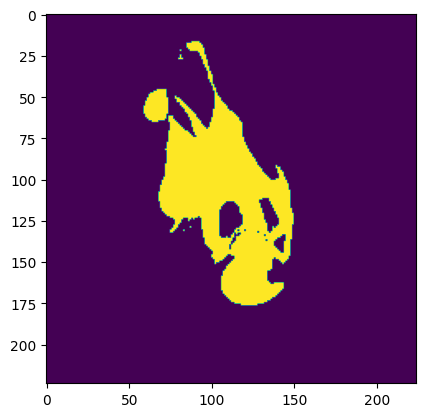

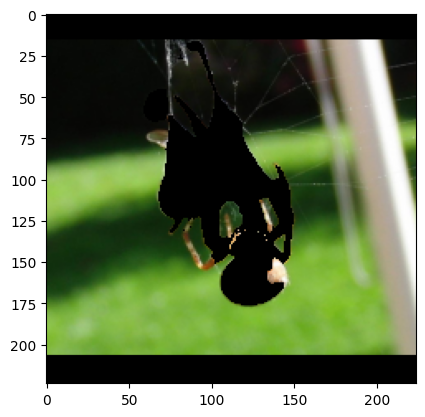

Yes its type2
redaction for 73 percentile at  19
 Initial predcition of 73 0.16158219
 final predcition of 73 0.0018668382
 final percentage of 73 1.1553490534424782
 Initial predcition of 301 0.12962091
 final predcition of 301 0.012591825
 final percentage of 301 9.714347124099731


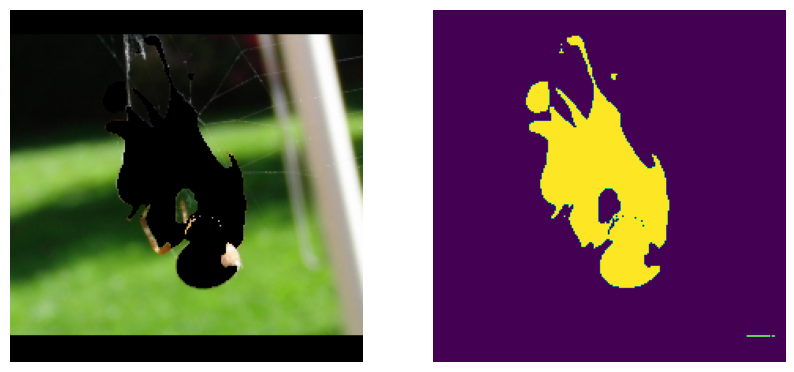

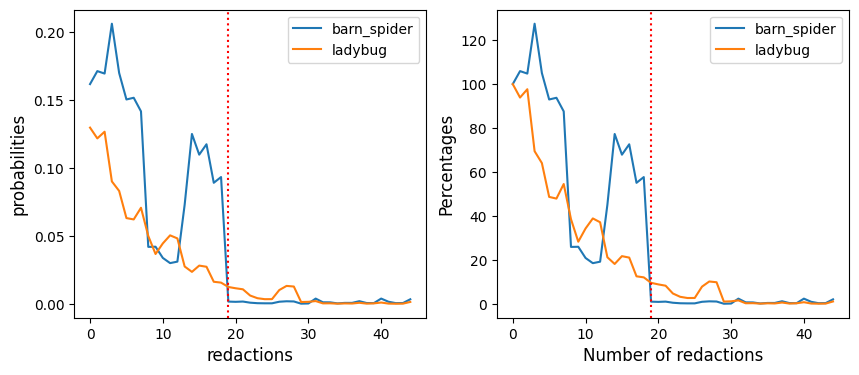

redaction for 301 percentile at  14
 Initial predcition of 301 0.12962091
 final predcition of 301 0.007243733
 final percentage of 301 5.58839850127697
 Initial predcition of 73 0.16158219
 final predcition of 73 0.003053793
 final percentage of 73 1.889931783080101


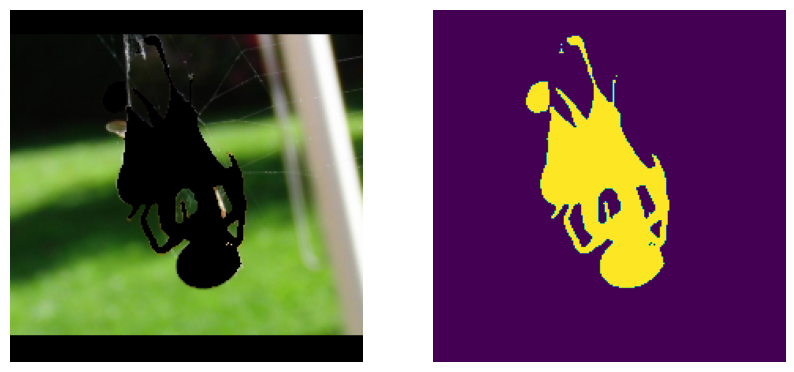

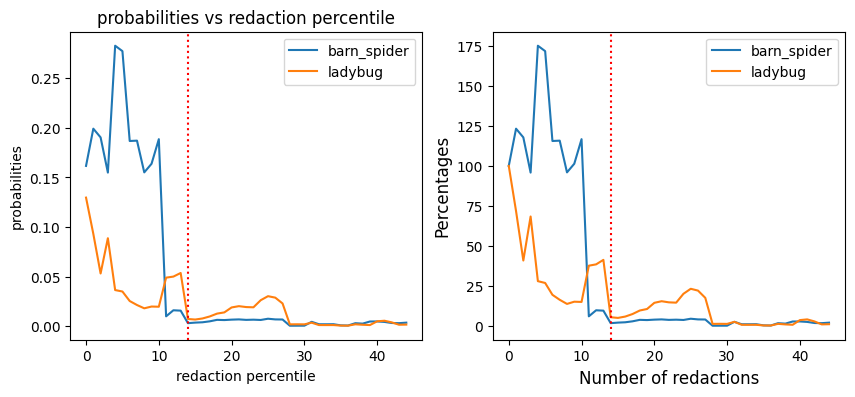

In [380]:
xx,yy,zz=check_for_type_2_using_rankings_exp2(segs,pixelwise_attributions,segmentwise_attributions,all_redaction_values[0],all_redaction_values[1],all_redaction_values[2],model_using,model_wth_pre_soft_max_using,im,image,topk,top10list,80,checkonly=None,check_both_pred=True)


In [218]:



def check_for_type_1_using_rankings_exp2(segs,
                                         pixelwise_attributions,
                                         segmentwise_attributions,
                                         final_prediction_dictionary,
                                         final_prediction_dictionary_with_percentages,
                                         final_redacted_images,
                                         model_in_use,
                                         model_in_use2,
                                         im,
                                         image,
                                         topk,
                                         top10list,
                                         delta_for_type1,
                                         checkonly=None,
                                         check_both_pred=True):
    combs=[i for i in range(topk)]
    cnt=0
    for (x1,x2) in list(combinations(combs, 2)):
        prediction1=top10list[x1]
        prediction2=top10list[x2]
        first_redaction=final_prediction_dictionary_with_percentages[prediction1]
        second_redaction=final_prediction_dictionary_with_percentages[prediction2]
        print(x1,x2)
        print(id_to_name[prediction1],id_to_name[prediction2])
        print(prediction1,prediction2)
        type1_flag=None
        type2_flag=None

        
        
        if checkonly=='type1' or checkonly==None:
            # checking for type1
            print('checking for type1')
            for i in range(len(first_redaction[prediction1])):
                flag1=None
                if first_redaction[prediction1][i] <= 100-delta_for_type1 and first_redaction[prediction2][i] >= delta_for_type1:
                    flag1=True
                    redaction1_percentile=i
                    break
        
            for i in range(len(first_redaction[prediction1])):
                flag2=None    
                if second_redaction[prediction2][i] <= 100-delta_for_type1 and second_redaction[prediction1][i] >= delta_for_type1:
                    flag2=True
                    redaction2_percentile=i
                    break
        
            if flag1==True and flag2==True:

                mask_id_for_redaction1= list_of_masks[prediction1][:redaction1_percentile]
                mask_id_for_redaction2= list_of_masks[prediction2][:redaction2_percentile]
                mask_id_only1=[i for i in mask_id_for_redaction1 if i not in mask_id_for_redaction2]
                mask_id_only2=[i for i in mask_id_for_redaction2 if i not in mask_id_for_redaction1]
                print(mask_id_for_redaction1)
                print(mask_id_for_redaction2)
                print(mask_id_only1)
                print(mask_id_only2)
                
                mask_only1=get_mask(mask_id_only1,new_segs)
                masking_type='normal/'
                new_im=mask_on_image(im , mask_only1, masking_type)
                new_im1=mask_on_image(image , mask_only1, masking_type)
                (predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_in_use,new_im,print_data=False)
                new_prediction1_percentage_after_only1=(predictions3[0][prediction1].numpy()/predictions[0][prediction1].numpy())*100
                new_prediction2_percentage_after_only1=(predictions3[0][prediction2].numpy()/predictions[0][prediction2].numpy())*100
                plt.imshow(mask_only1)
                plt.show()
                plt.imshow(new_im1)
                plt.show()
                print('redaction of only1 of '+str(prediction1)+' and '+str(prediction2))
                print('redaction of only of '+id_to_name[prediction1]+' and '+id_to_name[prediction2])
                print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][0])
                print(' final predcition of '+str(prediction1),predictions3[0][prediction1].numpy())
                print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_only1)
                print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][0])
                print(' final predcition of '+str(prediction2),predictions3[0][prediction2].numpy())
                print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_only1)

                
                mask_only2=get_mask(mask_id_only2,new_segs)
                masking_type='normal/'
                new_im=mask_on_image(im , mask_only2, masking_type)
                new_im1=mask_on_image(image , mask_only2, masking_type)
                (predictions3,decoded_predictions3,top10list3,top1000list3,id_to_name3)=predict_img(model_in_use,new_im,print_data=False)
                new_prediction1_percentage_after_only2=(predictions3[0][prediction1].numpy()/predictions[0][prediction1].numpy())*100
                new_prediction2_percentage_after_only2=(predictions3[0][prediction2].numpy()/predictions[0][prediction2].numpy())*100
                plt.imshow(mask_only2)
                plt.show()
                plt.imshow(new_im1)
                plt.show()
                print('redaction of intersection of '+str(prediction1)+' and '+str(prediction2))
                print('redaction of intersection of '+id_to_name[prediction1]+' and '+id_to_name[prediction2])
                print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][0])
                print(' final predcition of '+str(prediction1),predictions3[0][prediction1].numpy())
                print(' final percentage of '+str(prediction1),new_prediction1_percentage_after_only2)
                print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][0])
                print(' final predcition of '+str(prediction2),predictions3[0][prediction2].numpy())
                print(' final percentage of '+str(prediction2),new_prediction2_percentage_after_only2)

                if new_prediction1_percentage_after_only1 <= 100-delta_for_type1 and new_prediction2_percentage_after_only1 >= delta_for_type1 and new_prediction2_percentage_after_only2 <= 100-delta_for_type1 and new_prediction1_percentage_after_only2 >= delta_for_type1:
                    type1_flag=True
                    # cnt=cnt+1
                    print('Yes its type1')
                    
                    
                    print('redaction for '+str(prediction1)+' percentile at ',redaction1_percentile)
                    print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][0])
                    print(' final predcition of '+str(prediction1),final_prediction_dictionary[prediction1][prediction1][redaction1_percentile])
                    print(' final percentage of '+str(prediction1),first_redaction[prediction1][redaction1_percentile])
                    print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction1][prediction2][0])
                    print(' final predcition of '+str(prediction2),final_prediction_dictionary[prediction1][prediction2][redaction1_percentile])
                    print(' final percentage of '+str(prediction2),first_redaction[prediction2][redaction1_percentile])
        
        
                    redacted_mask_with_pred1=get_mask(mask_id_for_redaction1,new_segs)
                    redacted_image_with_pred1=mask_on_image(image , redacted_mask_with_pred1, masking_type)
                    plot_for_type1_redaction1(redacted_image_with_pred1,redacted_mask_with_pred1,final_prediction_dictionary,first_redaction,id_to_name,prediction1,prediction2,redaction1_percentile,'prob')
        
                    # print(len(first_redaction[prediction1]))
                    
                    print('redaction for '+str(prediction2)+' percentile at ',redaction2_percentile)
                    print(' Initial predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][0])
                    print(' final predcition of '+str(prediction2),final_prediction_dictionary[prediction2][prediction2][redaction2_percentile])
                    print(' final percentage of '+str(prediction2),second_redaction[prediction2][redaction2_percentile])
                    print(' Initial predcition of '+str(prediction1),final_prediction_dictionary[prediction2][prediction1][0])
                    print(' final predcition of '+str(prediction1),final_prediction_dictionary[prediction2][prediction1][redaction2_percentile])
                    print(' final percentage of '+str(prediction1),second_redaction[prediction1][redaction2_percentile])
        
                    redacted_mask_with_pred2=get_mask(mask_id_for_redaction2,new_segs)
                    redacted_image_with_pred2=mask_on_image(image , redacted_mask_with_pred2, masking_type)
                    plot_for_type1_redaction2(redacted_image_with_pred2,redacted_mask_with_pred2,final_prediction_dictionary,second_redaction,id_to_name,prediction1,prediction2,redaction2_percentile)
        
                    
                
                
                # print(id_to_name[prediction1])
                # plt.imshow(redacted_image_with_pred1)
                # plt.show()
                # print(id_to_name[prediction2])
                # plt.imshow(redacted_image_with_pred2)
                # plt.show()


        
        # break
    if type1_flag==True and type2_flag==True:
        print('Here i am , Both are true')
    # print(cnt)
    return [],[],[],[]
    # return mask_id_for_redaction1,mask_id_for_redaction2,mask_id_only1,mask_id_only2
    # return intersection_predictions,new_prediction1_percentage_after_intersection,new_prediction2_percentage_after_intersection
    
    
    




0 1
baseball ballplayer
429 981
checking for type1
[2, 62, 40, 32, 65, 3, 64, 104, 33, 74, 92, 1, 78, 90]
[62, 104, 32, 14, 29, 86, 65, 63, 3, 48, 88, 83, 67, 33, 66, 17, 40]
[2, 64, 74, 92, 1, 78, 90]
[14, 29, 86, 63, 48, 88, 83, 67, 66, 17]


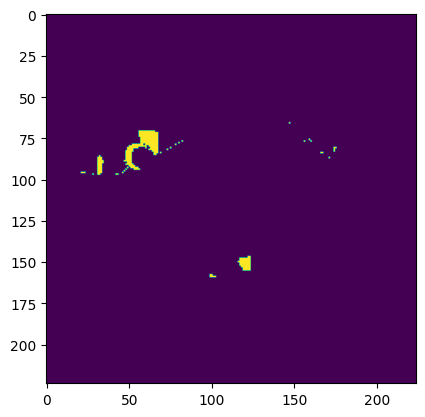

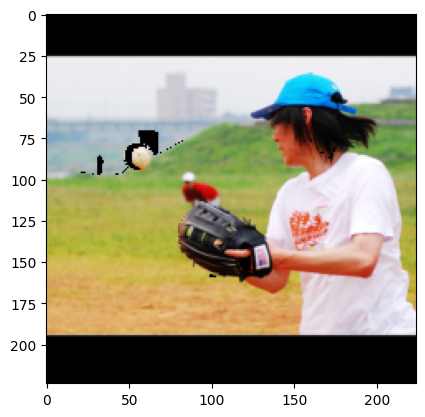

redaction of only1 of 429 and 981
redaction of only of baseball and ballplayer
 Initial predcition of 429 0.5132923
 final predcition of 429 0.31000286
 final percentage of 429 60.39499640464783
 Initial predcition of 981 0.48458698
 final predcition of 981 0.68133056
 final percentage of 981 140.6002640724182


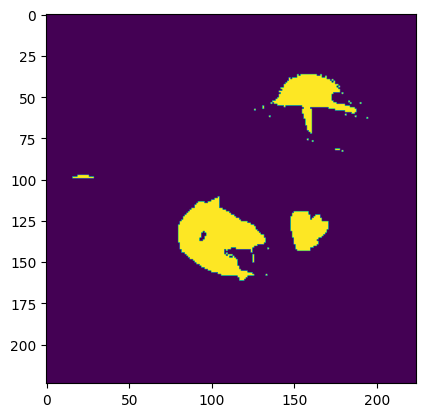

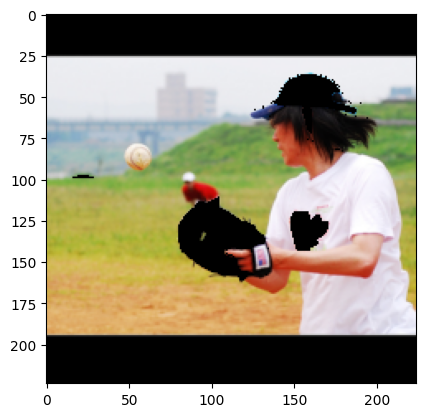

redaction of intersection of 429 and 981
redaction of intersection of baseball and ballplayer
 Initial predcition of 429 0.5132923
 final predcition of 429 0.9443727
 final percentage of 429 183.98340940475464
 Initial predcition of 981 0.48458698
 final predcition of 981 0.049727157
 final percentage of 981 10.261760652065277
0 2
baseball crash_helmet
429 518
checking for type1
[2, 62, 40, 32, 65, 3, 64, 104, 33, 74, 92, 1, 78, 90]
[65, 50, 86, 92, 103, 33]
[2, 62, 40, 32, 3, 64, 104, 74, 1, 78, 90]
[50, 86, 103]


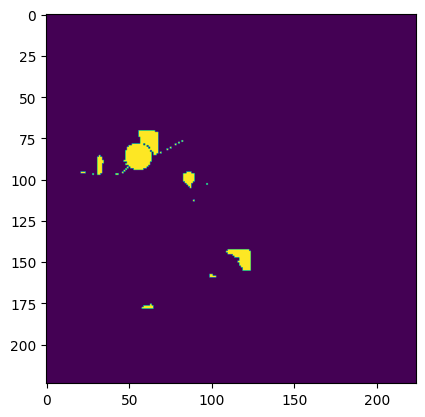

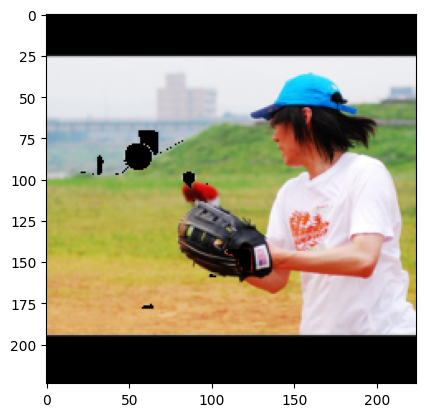

redaction of only1 of 429 and 518
redaction of only of baseball and crash_helmet
 Initial predcition of 429 0.5132923
 final predcition of 429 0.21562451
 final percentage of 429 42.00813174247742
 Initial predcition of 518 0.0010850176
 final predcition of 518 0.014425181
 final percentage of 518 1329.488182067871


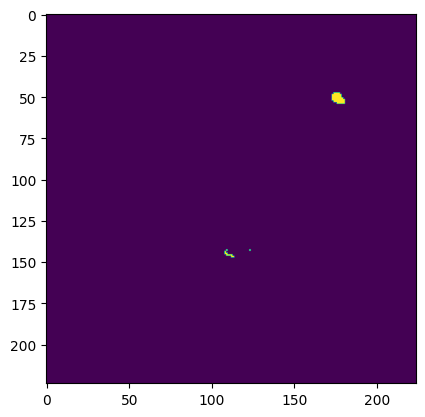

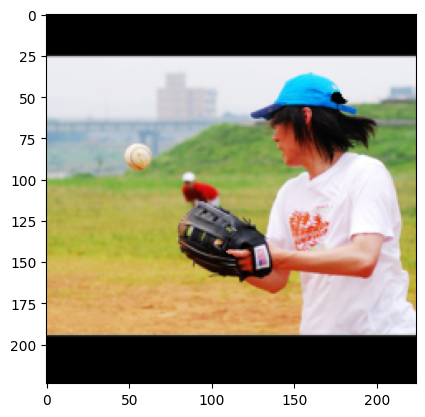

redaction of intersection of 429 and 518
redaction of intersection of baseball and crash_helmet
 Initial predcition of 429 0.5132923
 final predcition of 429 0.49120632
 final percentage of 429 95.69718837738037
 Initial predcition of 518 0.0010850176
 final predcition of 518 0.0010060524
 final percentage of 518 92.7222192287445
0 3
baseball lawn_mower
429 621
checking for type1
[2, 62, 40, 32, 65, 3, 64, 104, 33, 74, 92, 1, 78, 90]
[65, 59, 90, 86, 64, 33, 24, 50, 51, 47, 104, 17]
[2, 62, 40, 32, 3, 74, 92, 1, 78]
[59, 86, 24, 50, 51, 47, 17]


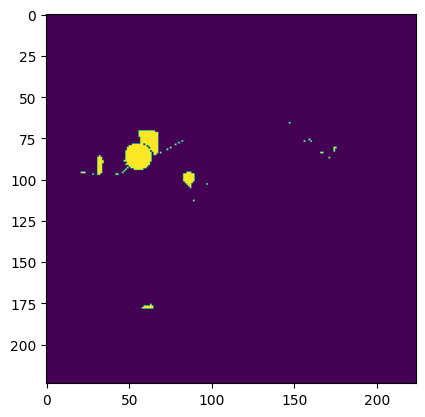

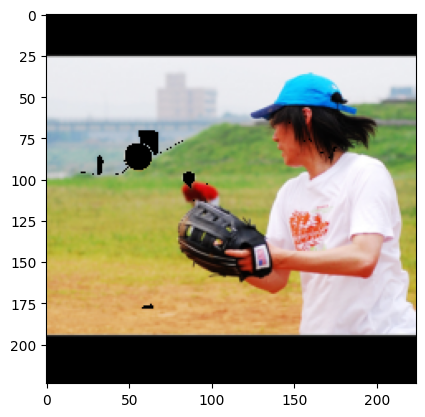

redaction of only1 of 429 and 621
redaction of only of baseball and lawn_mower
 Initial predcition of 429 0.5132923
 final predcition of 429 0.2286686
 final percentage of 429 44.54939067363739
 Initial predcition of 621 0.00044414226
 final predcition of 621 0.007305729
 final percentage of 621 1644.9073791503906


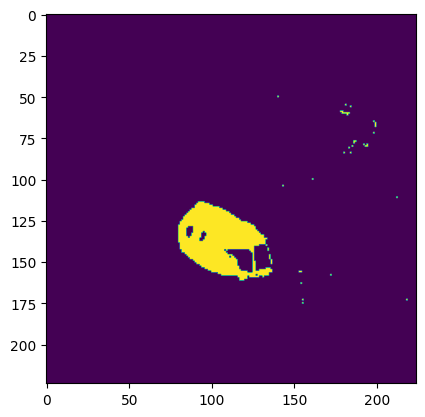

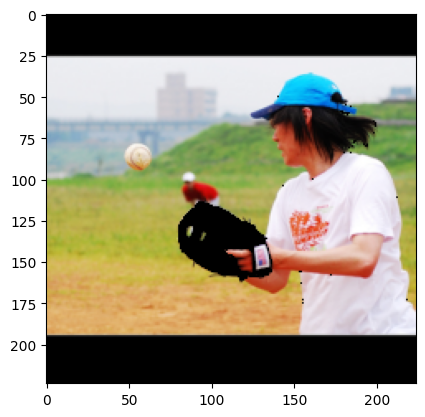

redaction of intersection of 429 and 621
redaction of intersection of baseball and lawn_mower
 Initial predcition of 429 0.5132923
 final predcition of 429 0.87109065
 final percentage of 429 169.70654726028442
 Initial predcition of 621 0.00044414226
 final predcition of 621 3.2844357e-05
 final percentage of 621 7.395008206367493
0 4
baseball golf_ball
429 574
checking for type1
1 2
ballplayer crash_helmet
981 518
checking for type1
[62, 104, 32, 14, 29, 86, 65, 63, 3, 48, 88, 83, 67, 33, 66, 17, 40, 60, 92, 51, 21, 78, 1, 50, 9, 2, 93, 74, 107, 36, 59]
[65, 50, 86, 92, 103, 33]
[62, 104, 32, 14, 29, 63, 3, 48, 88, 83, 67, 66, 17, 40, 60, 51, 21, 78, 1, 9, 2, 93, 74, 107, 36, 59]
[103]


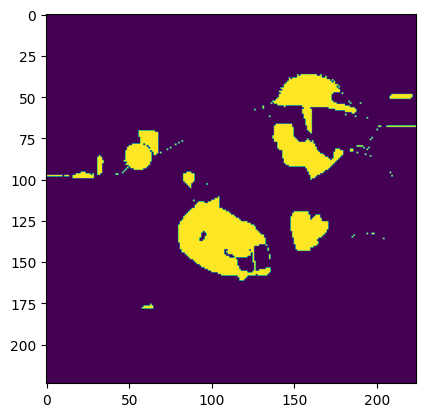

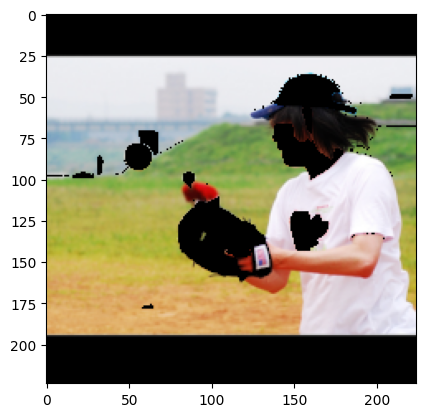

redaction of only1 of 981 and 518
redaction of only of ballplayer and crash_helmet
 Initial predcition of 981 0.48458698
 final predcition of 981 0.2051336
 final percentage of 981 42.33163595199585
 Initial predcition of 518 0.0010850176
 final predcition of 518 0.009603591
 final percentage of 518 885.1092338562012


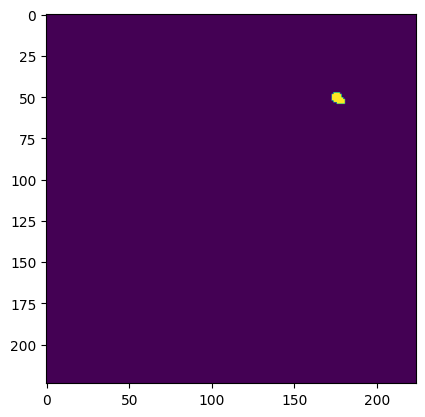

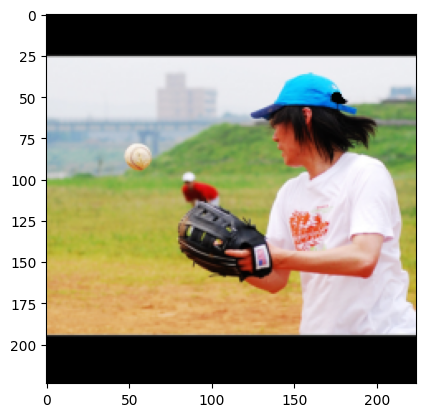

redaction of intersection of 981 and 518
redaction of intersection of ballplayer and crash_helmet
 Initial predcition of 981 0.48458698
 final predcition of 981 0.4979483
 final percentage of 981 102.7572512626648
 Initial predcition of 518 0.0010850176
 final predcition of 518 0.001172028
 final percentage of 518 108.01926851272583
1 3
ballplayer lawn_mower
981 621
checking for type1
[62, 104, 32, 14, 29, 86, 65, 63, 3, 48, 88, 83, 67, 33, 66, 17, 40]
[65, 59, 90, 86, 64, 33, 24, 50, 51, 47, 104, 17]
[62, 32, 14, 29, 63, 3, 48, 88, 83, 67, 66, 40]
[59, 90, 64, 24, 50, 51, 47]


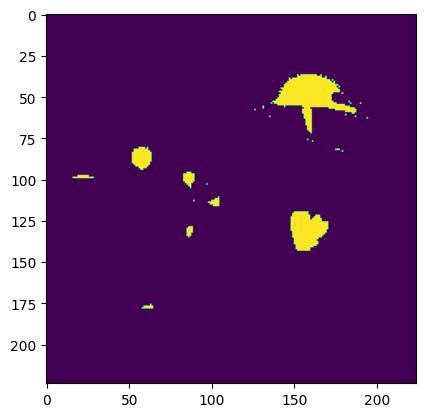

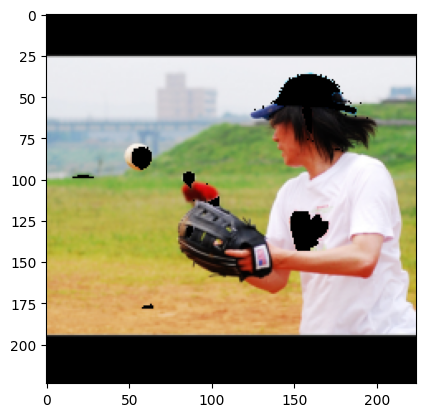

redaction of only1 of 981 and 621
redaction of only of ballplayer and lawn_mower
 Initial predcition of 981 0.48458698
 final predcition of 981 0.5272208
 final percentage of 981 108.79796743392944
 Initial predcition of 621 0.00044414226
 final predcition of 621 0.0061610085
 final percentage of 621 1387.1700286865234


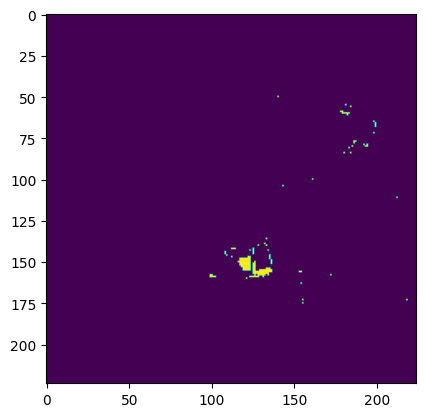

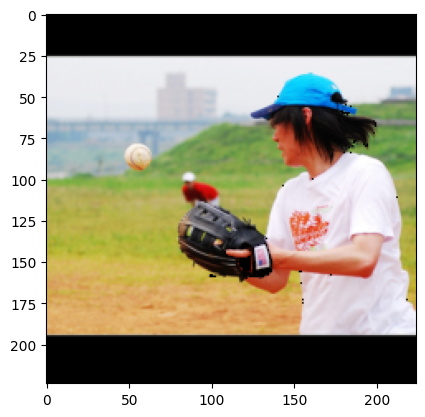

redaction of intersection of 981 and 621
redaction of intersection of ballplayer and lawn_mower
 Initial predcition of 981 0.48458698
 final predcition of 981 0.52666175
 final percentage of 981 108.68260860443115
 Initial predcition of 621 0.00044414226
 final predcition of 621 0.00047918785
 final percentage of 621 107.89061784744263
1 4
ballplayer golf_ball
981 574
checking for type1
2 3
crash_helmet lawn_mower
518 621
checking for type1
[65, 50, 86, 92, 103, 33]
[65, 59, 90, 86, 64, 33, 24, 50, 51, 47, 104, 17, 88, 30, 37, 32, 48, 93, 63, 77, 84, 62, 107, 3, 18, 74, 21, 96, 83, 100, 105, 94, 13]
[92, 103]
[59, 90, 64, 24, 51, 47, 104, 17, 88, 30, 37, 32, 48, 93, 63, 77, 84, 62, 107, 3, 18, 74, 21, 96, 83, 100, 105, 94, 13]


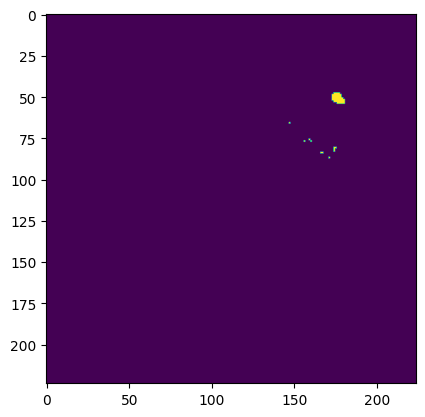

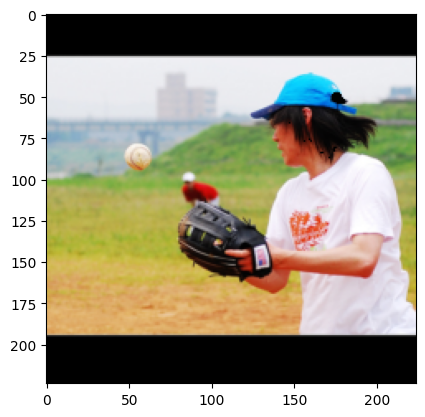

redaction of only1 of 518 and 621
redaction of only of crash_helmet and lawn_mower
 Initial predcition of 518 0.0010850176
 final predcition of 518 0.0013359875
 final percentage of 518 123.13048839569092
 Initial predcition of 621 0.00044414226
 final predcition of 621 0.00053724967
 final percentage of 621 120.96341848373413


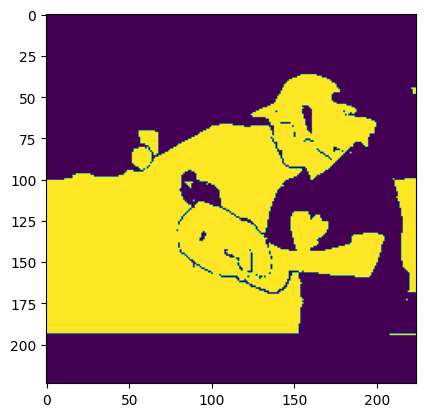

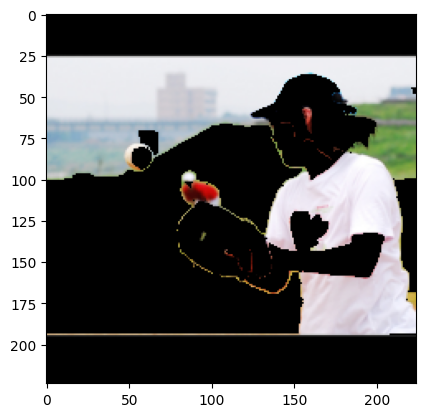

redaction of intersection of 518 and 621
redaction of intersection of crash_helmet and lawn_mower
 Initial predcition of 518 0.0010850176
 final predcition of 518 0.00040685388
 final percentage of 518 37.497445940971375
 Initial predcition of 621 0.00044414226
 final predcition of 621 2.086388e-05
 final percentage of 621 4.697566851973534
2 4
crash_helmet golf_ball
518 574
checking for type1
3 4
lawn_mower golf_ball
621 574
checking for type1


ValueError: too many values to unpack (expected 3)

In [28]:
# %%capture captured_output2
xx,yy,zz=check_for_type_1_using_rankings_exp2(segs,pixelwise_attributions,segmentwise_attributions,all_redaction_values[0],all_redaction_values[1],all_redaction_values[2],model_using,model_wth_pre_soft_max_using,im,image,topk,top10list,60,checkonly=None,check_both_pred=True)


In [59]:
# len(list_of_masks[153])

In [40]:
len(all_redaction_vaues[3][153])

37

In [ ]:
prediction1=top10list[1]
prediction2=top10list[2]
# prediction_dictionary[f'{prediction1} vs {prediction2}']['adjacent_segs']
mask_temp_array=prediction_dictionary[f'{prediction1} vs {prediction2}'][f'{prediction1}'][2][1:]
n=len(mask_temp_array)                
# n=redaction1_percentile+1
ROWS = math.floor(math.sqrt(n))
COLS = math.ceil(n / ROWS)
UPSCALE_FACTOR = 10
fig, axs = plt.subplots(ROWS, COLS, figsize=(ROWS * UPSCALE_FACTOR, COLS * (UPSCALE_FACTOR-5)))
for o in range(len(mask_temp_array)):
    axs.flat[o].imshow(mask_temp_array[o])
    # axs.flat[o].set_title(mask_temp_array2[o])
# for o in range(redaction1_percentile+1):
#     mask_temp = segmentwise_attributions[prediction1] > np.percentile(segmentwise_attributions[prediction1], 100-o)
#     axs.flat[o].imshow(mask_temp)
plt.show()

prediction1=top10list[1]
prediction2=top10list[2]
# prediction_dictionary[f'{prediction1} vs {prediction2}']['adjacent_segs']
temp_array=list_of_masks[prediction1]
# mask_temp_array=prediction_dictionary[f'{prediction1} vs {prediction2}'][f'{prediction1}'][2][1:]
n=len(temp_array)                
# n=redaction1_percentile+1
ROWS = math.floor(math.sqrt(n))
COLS = math.ceil(n / ROWS)
UPSCALE_FACTOR = 10
fig, axs = plt.subplots(ROWS, COLS, figsize=(ROWS * UPSCALE_FACTOR, COLS * (UPSCALE_FACTOR-5)))
for o in range(len(temp_array)):
    axs.flat[o].imshow(new_segs[temp_array[o]])
    axs.flat[o].set_title(f'{temp_array[o]}')
# for o in range(redaction1_percentile+1):
#     mask_temp = segmentwise_attributions[prediction1] > np.percentile(segmentwise_attributions[prediction1], 100-o)
#     axs.flat[o].imshow(mask_temp)
plt.show()



mask_temp_array=prediction_dictionary[f'{prediction1} vs {prediction2}'][f'{prediction2}'][2][1:]
n=len(mask_temp_array)                
# n=redaction1_percentile+1
ROWS = math.floor(math.sqrt(n))
COLS = math.ceil(n / ROWS)
UPSCALE_FACTOR = 10
fig, axs = plt.subplots(ROWS, COLS, figsize=(ROWS * UPSCALE_FACTOR, COLS * (UPSCALE_FACTOR-5)))
for o in range(len(mask_temp_array)):
    axs.flat[o].imshow(mask_temp_array[o])
    # axs.flat[o].set_title(mask_temp_array2[o])
# for o in range(redaction1_percentile+1):
#     mask_temp = segmentwise_attributions[prediction1] > np.percentile(segmentwise_attributions[prediction1], 100-o)
#     axs.flat[o].imshow(mask_temp)
plt.show()


prediction1=top10list[1]
prediction2=top10list[2]
# prediction_dictionary[f'{prediction1} vs {prediction2}']['adjacent_segs']
temp_array=list_of_masks[prediction2]
# mask_temp_array=prediction_dictionary[f'{prediction1} vs {prediction2}'][f'{prediction1}'][2][1:]
n=len(temp_array)                
# n=redaction1_percentile+1
ROWS = math.floor(math.sqrt(n))
COLS = math.ceil(n / ROWS)
UPSCALE_FACTOR = 10
fig, axs = plt.subplots(ROWS, COLS, figsize=(ROWS * UPSCALE_FACTOR, COLS * (UPSCALE_FACTOR-5)))
for o in range(len(temp_array)):
    axs.flat[o].imshow(new_segs[temp_array[o]])
    axs.flat[o].set_title(f'{temp_array[o]}')
# for o in range(redaction1_percentile+1):
#     mask_temp = segmentwise_attributions[prediction1] > np.percentile(segmentwise_attributions[prediction1], 100-o)
#     axs.flat[o].imshow(mask_temp)
plt.show()

In [44]:
prediction1=top10list[1]
prediction2=top10list[2]
prediction_dictionary[f'{prediction1} vs {prediction2}']['adjacent_segs']
# prediction_dictionary[f'{prediction1} vs {prediction2}'][f'{prediction1}']

{39: [25],
 26: [0, 6, 7, 11, 13, 18, 22, 40, 42, 43, 45, 46, 48, 49],
 45: [0, 13, 26],
 32: [13, 34, 50, 53],
 18: [0, 13, 17, 26, 40],
 36: [15]}

In [32]:
for i  in list_of_masks:
    print(list_of_masks[i])

[48, 57, 49, 52, 45, 60, 13, 8, 12, 47, 25, 33, 88, 0, 84, 11, 77, 3, 83, 19, 71, 34, 28, 18, 78, 2, 74, 40, 67, 46, 29, 15, 56, 50, 38, 82, 17, 39, 14, 70, 79, 55, 16, 53, 31, 59, 10, 44, 36, 68, 43, 24, 6, 7, 41, 26, 72, 65, 1, 32]
[57, 48, 52, 13, 47, 50, 24, 45, 83, 55, 78, 60, 8, 12, 71, 19, 26, 0, 33, 34, 67, 6, 7, 40, 53, 46, 38, 56, 77, 25, 82, 59, 84, 15, 16, 17, 28, 79, 88, 29, 31, 39, 11, 10, 74, 36, 2, 70, 68, 44, 3, 65, 43, 14, 18, 72, 49, 41, 1, 32]
[48, 49, 57, 50, 52, 13, 47, 12, 45, 25, 8, 11, 18, 34, 78, 71, 33, 67, 40, 24, 10, 14, 0, 88, 38, 59, 77, 26, 15, 19, 39, 56, 79, 28, 7, 83, 84, 53, 55, 60, 16, 6, 17, 31, 36, 46, 70, 3, 74, 2, 44, 82, 29, 43, 68, 65, 41, 1, 72, 32]
[57, 52, 45, 48, 72, 13, 49, 47, 12, 25, 77, 8, 55, 24, 26, 50, 78, 67, 15, 84, 0, 28, 88, 39, 40, 16, 33, 71, 38, 83, 11, 56, 19, 34, 68, 70, 79, 46, 2, 29, 10, 82, 3, 17, 74, 59, 44, 14, 6, 31, 7, 53, 43, 36, 41, 60, 1, 18, 65, 32]
[57, 48, 52, 45, 13, 11, 49, 60, 1, 55, 12, 26, 77, 47, 8, 32, 2

In [ ]:
prediction_dictionary['159 vs 208']['159'][2][1:]

In [ ]:
for i in prediction_dictionary[f'{prediction1} vs {prediction2}'][f'{prediction2}'][2][1:]:
    plt.imshow(i)
    plt.show()

In [103]:

check_for_type_1_and_2_using_rankings_new(segs,pixelwise_attributions,segmentwise_attributions,prediction_dictionary,model_in_use,im,image,topk,top10list,80,checkonly=None)


KeyError: '159 vs 208'

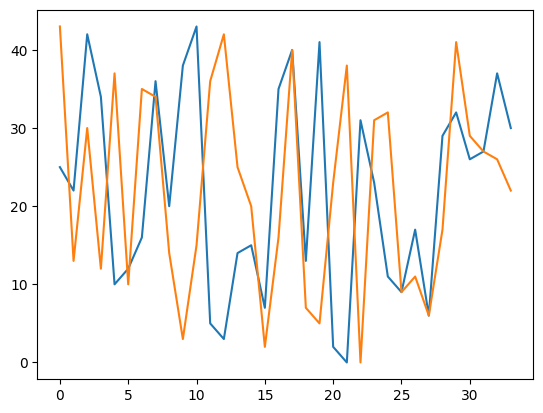

In [47]:
plt.plot(range(len(list_of_masks[814])),list_of_masks[814])
plt.plot(range(len(list_of_masks[554])),list_of_masks[554])

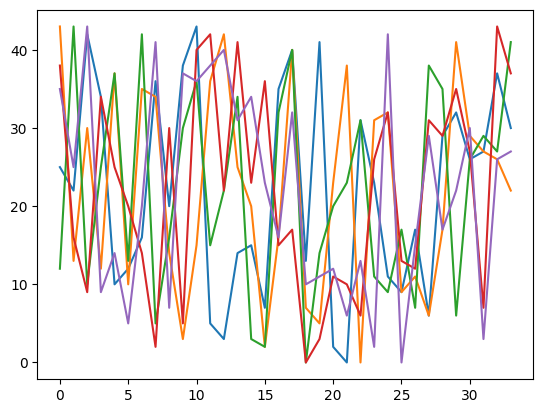

In [46]:
for i in list_of_masks.keys():
    plt.plot(range(len(list_of_masks[i])),list_of_masks[i])

In [60]:
len(prediction_dictionary['814 vs 554']['814'][2])

34

In [38]:

combs=[i for i in range(2)]
cnt=0

for (x1,x2) in list(combinations(combs, 2)):
    prediction1=top10list[x1]
    prediction2=top10list[x2]
    first_redaction=final_prediction_dictionary_with_percentages[prediction1]
    second_redaction=final_prediction_dictionary_with_percentages[prediction2]
    print(x1,x2)
    print(id_to_name[prediction1],id_to_name[prediction2])
    print(prediction1,prediction2)
    type1_flag=None
    type2_flag=None

# redact and save values pred1
# redact and save values pred2 
# check for type 1
# check for type 2



-0.002282364759594202 False True
-0.001340659218840301 False True
-3.7062709452584386e-05 False True
-0.0004617650993168354 False True
2.0180219507892616e-05 True False


In [54]:
# file_path='https://storage.googleapis.com/download.tensorflow.org/data/ImageNetLabels.txt'
# labels_file = tf.keras.utils.get_file('ImageNetLabels.txt', file_path)

In [47]:
with open('pic_id.pkl', 'rb') as file:
    pic_id=pickle.load(file)

In [49]:
pic_id[49905]

'chiton_n01955084'